# original oe notebook

In [136]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import numpy as np
import warnings

warnings.filterwarnings('ignore')

# LABELS and COLORS from the "original oe notebook" section (cell fddwmJ-JnKP3)
LABELS = {
    "imu": ['acc.x', 'acc.y', 'acc.z', 'gyro.x', 'gyro.y', 'gyro.z', 'mag.x', 'mag.y', 'mag.z'],
    "barometer": ['barometer.temperature', 'barometer.pressure'],
    "ppg": ['ppg.red', 'ppg.ir', 'ppg.green', 'ppg.ambient'],
    "bone_acc": ['bone_acc.x', 'bone_acc.y', 'bone_acc.z'],
    "optical_temp": ['optical_temp']
}

COLORS = {
    "ppg": ['red', 'darkred', 'green', 'gray']
}

def plot_trimmed_record(root_name: str):
    """
    Plots sensor and microphone data from trimmed CSV files.

    Args:
        root_name (str): The base path/name of the record, e.g.,
                         '/content/trimmed dual csv data/oe data/patient 5 - healthy/right ear/session 1'
                         (without the _sensors.csv or _mic.csv suffix).
    """
    sensors_path = f"{root_name}_sensors.csv"
    mic_path = f"{root_name}_mic.csv"

    # Load sensor data
    sensors_df = pd.DataFrame()
    try:
        sensors_df = pd.read_csv(sensors_path, index_col='timestamp')
        print(f"Loaded sensor data from: {sensors_path}")
        # Debug prints to check IMU data presence
        # print(f"DEBUG: sensors_df columns: {sensors_df.columns.tolist()}")
        if 'acc.x' in sensors_df.columns:
            pass
            # print(f"DEBUG: acc.x head:\n{sensors_df['acc.x'].head()}")
            # print(f"DEBUG: acc.x has any non-NaN values: {not sensors_df['acc.x'].isnull().all()}")
        if 'gyro.x' in sensors_df.columns:
            pass
            # print(f"DEBUG: gyro.x has any non-NaN values: {not sensors_df['gyro.x'].isnull().all()}")
        if 'mag.x' in sensors_df.columns:
            pass
            # print(f"DEBUG: mag.x has any non-NaN values: {not sensors_df['mag.x'].isnull().all()}")

    except FileNotFoundError:
        print(f"Sensor data file not found: {sensors_path} - Skipping sensor plots.")
    except Exception as e:
        print(f"Error loading sensor data from {sensors_path}: {e} - Skipping sensor plots.")

    # Load microphone data
    mic_df = pd.DataFrame()
    try:
        mic_df = pd.read_csv(mic_path, index_col='timestamp')
        print(f"Loaded microphone data from: {mic_path}")
    except FileNotFoundError:
        print(f"Microphone data file not found: {mic_path} - Skipping microphone plot.")
    except Exception as e:
        print(f"Error loading microphone data from {mic_path}: {e} - Skipping microphone plot.")

    fig, axes = plt.subplots(2, 3, figsize=(20, 10), sharex=False) # Changed to 3x3 grid
    axes = axes.flatten()

    # col_titles = ["Acc", "Gyro", "Mag", "PPG", "Barometer Temp", "Barometer Pressure", "Bone_Acc", "Mic", "Optical Temp"]
    col_titles = ["Acc", "Gyro", "Mag", "Bone_Acc", "Mic"]
    for i, title in enumerate(col_titles):
        axes[i].set_title(title)
        axes[i].grid(True)

    # Helper to plot series if they exist and are not all NaN
    def plot_series_if_available(ax, df_to_plot, cols, labels_map=None, colors=None):
        for i, col_full_name in enumerate(cols):
            if col_full_name in df_to_plot.columns:
                series = df_to_plot[col_full_name].dropna() # Drop NaNs before plotting
                if not series.empty: # Check if series is not empty after dropping NaNs
                    label = labels_map.get(col_full_name, col_full_name) if labels_map else col_full_name
                    color = colors[i] if colors and i < len(colors) else None
                    ax.plot(series.index, series, label=label, color=color, alpha=0.7)
        if ax.get_legend_handles_labels()[1]: # Check if any legend was added
            ax.legend()

    if not sensors_df.empty:
        # IMU Accelerometer
        acc_cols = [col for col in LABELS['imu'] if col.startswith('acc.')]
        plot_series_if_available(axes[0], sensors_df, acc_cols, labels_map={c: c.split('.')[1] for c in acc_cols})

        # IMU Gyroscope
        gyro_cols = [col for col in LABELS['imu'] if col.startswith('gyro.')]
        plot_series_if_available(axes[1], sensors_df, gyro_cols, labels_map={c: c.split('.')[1] for c in gyro_cols})

        # IMU Magnetometer
        mag_cols = [col for col in LABELS['imu'] if col.startswith('mag.')]
        plot_series_if_available(axes[2], sensors_df, mag_cols, labels_map={c: c.split('.')[1] for c in mag_cols})

        # # PPG - Re-enabled and mapped to axes[3]
        # ppg_cols = LABELS['ppg']
        # ppg_labels_map = {col: col.split('.')[1] for col in ppg_cols}
        # plot_series_if_available(axes[3], sensors_df, ppg_labels_map, COLORS.get('ppg'))

        # # Barometer Temperature - Re-enabled and mapped to axes[4]
        # if 'barometer.temperature' in sensors_df.columns:
        #     series = sensors_df['barometer.temperature'].dropna()
        #     if not series.empty:
        #         axes[4].plot(series.index, series, label="Temperature", alpha=0.7)
        #         axes[4].legend()

        # # Barometer Pressure - Re-enabled and mapped to axes[5]
        # if 'barometer.pressure' in sensors_df.columns:
        #     series = sensors_df['barometer.pressure'].dropna()
        #     if not series.empty:
        #         axes[5].plot(series.index, series, label="Pressure", alpha=0.7)
        #         axes[5].legend()

        # Bone_Acc - Mapped to axes[6]
        bone_acc_cols = LABELS['bone_acc']
        plot_series_if_available(axes[3], sensors_df, bone_acc_cols, labels_map={c: c.split('.')[1] for c in bone_acc_cols})

        # # Optical Temp - Re-enabled and mapped to axes[8]
        # if 'optical_temp' in sensors_df.columns:
        #     series = sensors_df['optical_temp'].dropna()
        #     if not series.empty:
        #         axes[8].plot(series.index, series, label="Optical Temperature", alpha=0.7)
        #         axes[8].legend()

    # Mic - Mapped to axes[7]
    if not mic_df.empty:
        if 'mic_inner' in mic_df.columns and not mic_df['mic_inner'].isnull().all():
            axes[4].plot(mic_df.index, mic_df['mic_inner'], label='Mic Inner', alpha=0.7)
        if 'mic_outer' in mic_df.columns and not mic_df['mic_outer'].isnull().all():
            axes[4].plot(mic_df.index, mic_df['mic_outer'], label='Mic Outer', alpha=0.7)
        if axes[4].get_legend_handles_labels()[1]:
            axes[4].legend()
    else:
      # If no mic data is loaded or available, remove the title for mic subplot
      axes[4].set_title('') # Or set to 'Mic (No Data)'

    fig.suptitle(f"Recording: {os.path.basename(root_name)}", fontsize=16, y=1.02) # Adjusted title position
    plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to make space for suptitle
    plt.savefig(f"{root_name}_plot.png")
    plt.show()

# trim data to 30 secs

## helper functions

### trimming

In [4]:
"""
trim_oe_sessions.py
────────────────────────────────────────────────────────────────────────────────
Automatically detects the 30-second FMCW chirp window in every .oe recording
and trims ALL sensor channels to that window.

Output (per session, written next to the .oe file)
──────
  right ear session 1_sensors.csv   ← IMU / barometer / PPG / bone-acc /
                                       optical-temp  (their native timestamps)
  right ear session 1_mic.csv       ← mic_inner + mic_outer  (48 kHz samples)

Why two files?
  Mic runs at 48 000 Hz; IMU at 400 Hz; bone-acc at 6 400 Hz, etc.
  Merging them on a shared timestamp index produces a table that is
  >99 % NaN.  Keeping them in separate files preserves every sample
  at its native rate with no padding.

Detection strategy
──────────────────
  The FMCW chirp spans 16–20 kHz, well above ambient noise.
  The inner mic is band-passed to that range; its short-time RMS energy
  envelope gives a precise start/end time.  Because every sensor starts
  and stops recording simultaneously the same window is applied to all.

Usage
─────
    python trim_oe_sessions.py              # scans ./data/ by default
    python trim_oe_sessions.py /path/to/data
"""

import os
import sys
import struct
import warnings
from collections import defaultdict

import numpy as np
import pandas as pd
from scipy.signal import butter, sosfilt

warnings.filterwarnings("ignore", category=RuntimeWarning)


# ─────────────────────────────────────────────────────────────────────────────
# Constants
# ─────────────────────────────────────────────────────────────────────────────
MIC_FS           = 48_000   # Hz
CHIRP_F_LOW      = 15_500   # Hz  (filter margin below 16 kHz)
CHIRP_F_HIGH     = 20_500   # Hz  (filter margin above 20 kHz)
CHIRP_DURATION_S = 30.0     # seconds — expected active window

FRAME_MS      = 10    # ms per RMS energy frame for detection
ENERGY_THRESH = 0.05  # fraction of peak energy → "chirp active"

LABELS = {
    "imu":          ["acc.x","acc.y","acc.z","gyro.x","gyro.y","gyro.z","mag.x","mag.y","mag.z"],
    "barometer":    ["barometer.temperature","barometer.pressure"],
    "ppg":          ["ppg.red","ppg.ir","ppg.green","ppg.ambient"],
    "bone_acc":     ["bone_acc.x","bone_acc.y","bone_acc.z"],
    "optical_temp": ["optical_temp"],
}

SENSOR_SID = {
    "imu": 0, "barometer": 1, "microphone": 2,
    "ppg": 4, "optical_temp": 6, "bone_acc": 7,
}

SENSOR_FORMATS = {
    0: "<9f",   # imu
    1: "<2f",   # barometer
    4: "<4I",   # ppg
    6: "<f",    # optical_temp
    7: "<3h",   # bone_acc
}


# ─────────────────────────────────────────────────────────────────────────────
# Binary parser  (faithful to the official OpenEarable notebook)
# ─────────────────────────────────────────────────────────────────────────────
def parse_oe(filename: str) -> dict:
    """
    Returns
    -------
    {
        "version"   : int,
        "mic_inner" : np.ndarray int16  | None,
        "mic_outer" : np.ndarray int16  | None,
        "sensors"   : { sid: [(timestamp_s, values_tuple), ...] }
    }
    """
    FILE_HEADER_FORMAT = "<HQ"
    HDR_SIZE = struct.calcsize(FILE_HEADER_FORMAT)

    raw_data    = defaultdict(list)
    mic_samples = []
    last_sid    = None

    with open(filename, "rb") as f:
        version, _ = struct.unpack(FILE_HEADER_FORMAT, f.read(HDR_SIZE))

        while True:
            hdr = f.read(10)
            if len(hdr) < 10:
                break

            sid, size, time = struct.unpack("<BBQ", hdr)

            if size > 192 or sid > 7:
                if last_sid is not None and raw_data[last_sid]:
                    raw_data[last_sid].pop()
                break

            last_sid = sid
            payload  = f.read(size)
            if len(payload) < size:
                break

            ts_s = time / 1e6

            try:
                if sid == SENSOR_SID["microphone"]:
                    mic_samples.extend(struct.unpack("<96h", payload))

                elif version < 2 and sid == SENSOR_SID["bone_acc"]:
                    raw_data[sid].append((ts_s, payload))   # raw bytes, decoded below

                elif sid in SENSOR_FORMATS:
                    fmt = SENSOR_FORMATS[sid]
                    esz = struct.calcsize(fmt)

                    if size == esz:
                        raw_data[sid].append((ts_s, struct.unpack(fmt, payload)))

                    elif (size - 2) % esz == 0:             # batched packet
                        delta = struct.unpack("<H", payload[-2:])[0] / 1e6
                        body  = payload[:-2]
                        for n in range(len(body) // esz):
                            vals = struct.unpack(fmt, body[n * esz:(n + 1) * esz])
                            raw_data[sid].append((ts_s + n * delta, vals))

            except struct.error:
                pass

    # ── Microphone ─────────────────────────────────────────────────────────
    mic_inner = mic_outer = None
    if mic_samples:
        arr       = np.array(mic_samples, dtype=np.int16)
        mic_inner = arr[1::2]   # inner mic (odd indices)
        mic_outer = arr[0::2]   # outer mic (even indices)

    # ── Bone-acc v1 raw-byte decode ────────────────────────────────────────
    if version < 2 and raw_data[7]:
        all_samples   = []
        sample_counts = []

        for _, payload in raw_data[7]:
            n = len(payload) // struct.calcsize("<3h")
            sample_counts.append(n)
            for i in range(n):
                off = i * struct.calcsize("<3h")
                all_samples.append(
                    struct.unpack("<3h", payload[off:off + struct.calcsize("<3h")])
                )

        all_times = []
        for i in range(len(raw_data[7]) - 1):
            t0 = raw_data[7][i][0]
            t1 = raw_data[7][i + 1][0]
            n  = sample_counts[i]
            dt = (t1 - t0) / (n + 1) if n > 0 else 0
            all_times.extend([t0 + j * dt for j in range(n)])

        raw_data[7] = list(zip(all_times, all_samples))

    return {
        "version"  : version,
        "mic_inner": mic_inner,
        "mic_outer": mic_outer,
        "sensors"  : dict(raw_data),
    }


# ─────────────────────────────────────────────────────────────────────────────
# Chirp detection
# ─────────────────────────────────────────────────────────────────────────────
def _bandpass_sos(signal: np.ndarray, low: float, high: float,
                  fs: float, order: int = 5) -> np.ndarray:
    nyq = 0.5 * fs
    sos = butter(order, [low / nyq, high / nyq], btype="band", output="sos")
    return sosfilt(sos, signal.astype(np.float32))


def detect_chirp_window(mic_inner: np.ndarray,
                        fs: float = MIC_FS) -> tuple[float, float]:
    """
    Returns (t_start_s, t_end_s) as seconds from the start of the mic array.
    """
    filtered  = _bandpass_sos(mic_inner, CHIRP_F_LOW, CHIRP_F_HIGH, fs)
    frame_len = int(fs * FRAME_MS / 1000)
    n_frames  = len(filtered) // frame_len
    frames    = filtered[:n_frames * frame_len].reshape(n_frames, frame_len)
    energy    = np.sqrt(np.mean(frames ** 2, axis=1))   # RMS per frame

    peak = energy.max()
    if peak == 0:
        raise ValueError("Inner microphone is silent — cannot detect chirp.")

    active = np.where(energy > ENERGY_THRESH * peak)[0]
    if len(active) == 0:
        raise ValueError("No chirp energy found in the 16–20 kHz band.")

    frame_dur = FRAME_MS / 1000.0
    t_start   = float(active[0])      * frame_dur
    t_end     = float(active[-1] + 1) * frame_dur

    dur = t_end - t_start
    print(f"    Chirp window : {t_start:.3f}s → {t_end:.3f}s  ({dur:.2f}s)")
    if abs(dur - CHIRP_DURATION_S) > 5.0:
        warnings.warn(
            f"Detected duration {dur:.1f}s deviates >5 s from expected "
            f"{CHIRP_DURATION_S}s — consider tuning ENERGY_THRESH.", stacklevel=2)

    return t_start, t_end


# ─────────────────────────────────────────────────────────────────────────────
# Build per-sensor DataFrames at native rate
# ─────────────────────────────────────────────────────────────────────────────
def build_sensor_dataframes(sensors: dict) -> dict[str, pd.DataFrame]:
    """
    Returns { sensor_name: DataFrame } where:
      - Index = absolute timestamp (seconds since boot)
      - Columns = sensor channels
    Only sensors with actual data are included.
    """
    result = {}
    for name, sid in SENSOR_SID.items():
        if name == "microphone" or sid not in sensors or not sensors[sid]:
            continue
        labels = LABELS.get(name, [f"val{i}" for i in range(10)])
        times, values = zip(*sensors[sid])
        df = pd.DataFrame(list(values), columns=labels)
        df.index = pd.Index(times, name="timestamp")
        df = df[~df.index.duplicated(keep="first")]
        result[name] = df
    return result


# ─────────────────────────────────────────────────────────────────────────────
# Trim one session → two CSVs
# ─────────────────────────────────────────────────────────────────────────────
def trim_session(oe_path: str) -> tuple[str, str]:
    """
    Parse, detect chirp, trim, write:
      <base>_sensors.csv  — all non-mic sensors at their native rate
      <base>_mic.csv      — inner + outer mic at 48 kHz

    Returns (sensors_csv_path, mic_csv_path).
    """
    base        = os.path.splitext(oe_path)[0]
    out_sensors = base + "_sensors.csv"
    out_mic     = base + "_mic.csv"

    print(f"\n  Parsing  : {os.path.abspath(oe_path)}")
    parsed = parse_oe(oe_path)

    mic_inner = parsed["mic_inner"]
    mic_outer = parsed["mic_outer"]

    if mic_inner is None or len(mic_inner) == 0:
        raise ValueError("No microphone data found.")

    # ── 1. Detect chirp window (seconds relative to mic array start) ─────────
    t_start, t_end = detect_chirp_window(mic_inner, fs=MIC_FS)

    # ── 2. Trim + save mic CSV ───────────────────────────────────────────────
    i_start = int(t_start * MIC_FS)
    i_end   = int(t_end   * MIC_FS)

    inner_trimmed = mic_inner[i_start:i_end]
    outer_trimmed = (mic_outer[i_start:i_end]
                     if mic_outer is not None else np.zeros_like(inner_trimmed))

    mic_times = np.arange(len(inner_trimmed), dtype=np.float64) / MIC_FS   # re-zeroed
    mic_df    = pd.DataFrame(
        {"mic_inner": inner_trimmed, "mic_outer": outer_trimmed},
        index=pd.Index(mic_times, name="timestamp"),
    )
    mic_df.to_csv(out_mic)
    print(f"    Mic CSV      : {os.path.basename(out_mic)}  ({len(mic_df):,} rows)")

    # ── 3. Trim + save sensor CSV ────────────────────────────────────────────
    sensor_dfs = build_sensor_dataframes(parsed["sensors"])

    if not sensor_dfs:
        print("    ⚠️  No non-mic sensor data found — only mic CSV written.")
        return out_sensors, out_mic

    # Derive absolute chirp boundaries from the earliest sensor timestamp.
    # (All sensors share the same clock; mic array index 0 ≈ recording start.)
    recording_start = min(df.index.min() for df in sensor_dfs.values())
    abs_start = recording_start + t_start
    abs_end   = recording_start + t_end

    trimmed_parts = []
    for name, df in sensor_dfs.items():
        mask    = (df.index >= abs_start) & (df.index <= abs_end)
        trimmed = df.loc[mask].copy()
        trimmed.index = trimmed.index - abs_start   # re-zero to 0
        trimmed.index.name = "timestamp"
        trimmed_parts.append(trimmed)
        print(f"    {name:<14}: {len(trimmed):>6,} rows "
              f"(kept {len(trimmed)/max(len(df),1)*100:.1f}% of {len(df):,})")

    # Row-wise concatenation keeps each sensor at its own native timestamps.
    # Within each sensor's rows every column for that sensor is populated —
    # columns belonging to other sensors are NaN, but that is expected and
    # correct: it simply reflects the fact that sensors sample at different rates.
    # This is the standard "long + wide" format for heterogeneous sensor logs.
    combined = pd.concat(trimmed_parts, axis=0, sort=True)
    combined.sort_index(inplace=True)
    combined.index.name = "timestamp"
    combined.to_csv(out_sensors)
    print(f"    Sensor CSV   : {os.path.basename(out_sensors)}  ({len(combined):,} rows)")

    return out_sensors, out_mic


# ─────────────────────────────────────────────────────────────────────────────
# Directory walker
# ─────────────────────────────────────────────────────────────────────────────
def process_data_directory(root: str = "data") -> None:
    """
    Recursively find and trim every .oe file under `root`.

    Expected layout (any nesting depth works):
        data/
          patient 1 - healthy/
            right ear/
              right ear session 1.oe
            left ear/
              ...
    """
    oe_files = []
    for dirpath, _, filenames in os.walk(root):
        for fn in sorted(filenames):
            if fn.lower().endswith(".oe"):
                oe_files.append(os.path.join(dirpath, fn))

    if not oe_files:
        print(f"No .oe files found under '{root}'.")
        return

    print(f"Found {len(oe_files)} .oe file(s) under '{root}'.\n")

    success, failed = [], []
    for path in oe_files:
        try:
            s, m = trim_session(path)
            success.append((s, m))
        except Exception as exc:
            print(f"    ❌ FAILED — {exc}")
            failed.append((path, str(exc)))

    print("\n" + "═" * 70)
    print(f"Done.  ✅ {len(success)} trimmed   ❌ {len(failed)} failed")
    if failed:
        print("\nFailed files:")
        for p, err in failed:
            print(f"  {p}\n    → {err}")




#### plotting

In [5]:
import struct
import os
import tempfile
from collections import defaultdict

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Audio
from scipy.io.wavfile import write
from scipy.signal import butter, filtfilt, resample, stft, istft
from sklearn.decomposition import PCA


LABELS = {
    "imu": ['acc.x', 'acc.y', 'acc.z', 'gyro.x', 'gyro.y', 'gyro.z', 'mag.x', 'mag.y', 'mag.z'],
    "barometer": ['barometer.temperature', 'barometer.pressure'],
    "ppg": ['ppg.red', 'ppg.ir', 'ppg.green', 'ppg.ambient'],
    "bone_acc": ['bone_acc.x', 'bone_acc.y', 'bone_acc.z'],
    "optical_temp": ['optical_temp'] # Added optical_temp label
}

COLORS = {
    "ppg": ['red', 'darkred', 'green', 'gray']
}

class SensorAccessor:
    def __init__(self, df: pd.DataFrame, labels: list):
        self._df = df
        self._data = {}
        groups = defaultdict(list)

        for label in labels:
            parts = label.split('.')
            if len(parts) == 2:
                group, field = parts
                if label in df:
                    groups[group].append(label)
            else:
                if label in df:
                    self._data[label] = df[label]

        for group, columns in groups.items():
            short_names = [label.split('.')[1] for label in columns]
            subdf = df[columns].copy()
            subdf.columns = short_names
            self._data[group] = subdf

        self._full_df = pd.concat(self._data.values(), axis=1) if self._data else df

    def __getitem__(self, key):
        return self._data.get(key, None)

    def __getattr__(self, name):
        if name in self._data:
            return self._data[name]
        if hasattr(self._full_df, name):
            return getattr(self._full_df, name)
        raise AttributeError(f"'SensorAccessor' object has no attribute '{name}'")

    def __repr__(self):
        return repr(self._full_df)

    def __getattr__df__(self):
        return self._full_df

    def to_dataframe(self):
        return self._full_df



class SensorDataset:
    SENSOR_SID = {
        "imu": 0,
        "barometer": 1,
        "microphone": 2,
        "ppg": 4,
        "optical_temp": 6,
        "bone_acc": 7,
    }

    sensor_formats = {
        SENSOR_SID["imu"]: '<9f',
        SENSOR_SID["barometer"]: '<2f',
        SENSOR_SID["ppg"]: '<4I',
        SENSOR_SID["optical_temp"]: '<f',
        SENSOR_SID["bone_acc"]: '<3h',
    }

    def __init__(self, filename):
        self.filename = filename
        self.data = defaultdict(list)
        self.audio_stereo = None
        self.bone_sound = None
        self.df = pd.DataFrame()

        self.imu = SensorAccessor(pd.DataFrame(columns=LABELS['imu']), LABELS['imu'])
        self.barometer = SensorAccessor(pd.DataFrame(columns=LABELS['barometer']), LABELS['barometer'])
        self.ppg = SensorAccessor(pd.DataFrame(columns=LABELS['ppg']), LABELS['ppg'])
        self.bone_acc = SensorAccessor(pd.DataFrame(columns=LABELS['bone_acc']), LABELS['bone_acc'])
        self.optical_temp = SensorAccessor(pd.DataFrame(columns=LABELS['optical_temp']), LABELS['optical_temp']) # Initialize optical_temp accessor

        self.parse()
        self._build_accessors()

    def parse(self):
        FILE_HEADER_FORMAT = '<HQ'
        FILE_HEADER_SIZE = struct.calcsize(FILE_HEADER_FORMAT)
        mic_samples = []
        _sid = None

        with open(self.filename, 'rb') as f:
            version, timestamp = struct.unpack(FILE_HEADER_FORMAT, f.read(FILE_HEADER_SIZE))
            print(f"📂 File: {os.path.basename(self.filename)}, Version: {version}, Timestamp (since boot): {timestamp}µs")

            while True:
                header = f.read(10)
                if len(header) < 10:
                    break
                sid, size, time = struct.unpack('<BBQ', header)
                if size > 192 or sid > 7:
                    if _sid != None and _sid in self.data.keys():
                        self.data[_sid].pop()
                    break

                _sid = sid

                data = f.read(size)
                if len(data) < size:
                    break
                timestamp_s = time / 1e6

                try:
                    if sid == self.SENSOR_SID["microphone"]:
                        samples = struct.unpack('<96h', data)
                        mic_samples.extend(samples)
                    elif version < 2 and sid == self.SENSOR_SID["bone_acc"]:
                         self.data[sid].append((timestamp_s, data))
                    elif sid in self.sensor_formats:
                        fmt = self.sensor_formats[sid]
                        expected_size = struct.calcsize(fmt)

                        if size == expected_size:
                            values = struct.unpack(fmt, data)
                            self.data[sid].append((timestamp_s, values))
                        elif(size - 2) % expected_size == 0:
                            delta = struct.unpack('<H', data[-2:])[0] / 1e6
                            data = data[:-2]
                            for n in range(len(data) // expected_size):
                                values = struct.unpack(fmt, data[n * expected_size: (n + 1) * expected_size])
                                self.data[sid].append((timestamp_s + n * delta, values))
                        else:
                            print(f"❌ Could not parse SID {sid} at timestamp {timestamp_s}")
                            continue
                    else:
                        continue
                except struct.error:
                    print(f"❌ Could not parse SID {sid} at timestamp {timestamp_s}")

        if mic_samples:
            mic_array = np.array(mic_samples, dtype=np.int16)
            self.audio_stereo = np.column_stack((mic_array[1::2], mic_array[0::2]))  # [inner, outer] correctly

        if version < 2 and len(self.data[7]) > 0:
            all_samples = []
            sample_counts = []

            for _, d in self.data[7]:
                samples_per_packet = len(d) // struct.calcsize('<3h')
                sample_counts.append(samples_per_packet)

                for i in range(samples_per_packet):
                    offset = i * struct.calcsize('<3h')
                    sample = struct.unpack('<3h', d[offset:offset + struct.calcsize('<3h')])
                    all_samples.append(sample)

            int16_arrays = np.array(all_samples)

            detailed_times = []

            for i in range(len(self.data[7])-1):
                current_time = self.data[7][i][0]
                next_time = self.data[7][i+1][0]
                samples_in_packet = sample_counts[i]
                if samples_in_packet > 0:
                    time_diff = (next_time - current_time) / (samples_in_packet + 1)
                    detailed_times.extend([current_time + j * time_diff for j in range(samples_in_packet)])

            self.data[7] = list(zip(detailed_times, all_samples))


    def _build_accessors(self):
        dfs = []
        for name, sid in self.SENSOR_SID.items():
            labels = LABELS.get(name, [f"val{i}" for i in range(0)])
            if sid in self.data and self.data[sid]:
                times, values = zip(*self.data[sid])
                df = pd.DataFrame(values, columns=labels)
                df['timestamp'] = times
                df.set_index('timestamp', inplace=True)
                df = df[~df.index.duplicated(keep='first')] # Drop duplicate timestamps
                dfs.append(df)
            else:
                df = pd.DataFrame(columns=labels)

            setattr(self, name, SensorAccessor(df, labels))

        if dfs:
            # Determine a common time index by taking the union of all indices and sorting
            common_index = pd.Index([])
            for df in dfs:
                common_index = common_index.union(df.index)
            common_index = common_index.sort_values()

            # Reindex each dataframe to the common index and then concatenate
            reindexed_dfs = [df.reindex(common_index) for df in dfs]
            self.df = pd.concat(reindexed_dfs, axis=1)
        else:
            self.df = pd.DataFrame()

    def get_dataframe(self):
        return self.df

    def export_csv(self):
        base_filename, _ = os.path.splitext(self.filename)
        self.save_csv(base_filename + ".csv")

    def save_csv(self, path):
        if not self.df.empty:
            self.df.to_csv(path)

    def play_audio(self, sampling_rate=48000):
        if self.audio_stereo is None:
            print("❌ No microphone data available.")
            return
        with tempfile.NamedTemporaryFile(delete=False, suffix=".wav") as tmp:
            write(tmp.name, sampling_rate, self.audio_stereo)
            display(Audio(tmp.name))

    def save_audio(self, path, sampling_rate=48000):
        if self.audio_stereo is None:
            print("❌ No microphone data available to save.")
            return
        try:
            write(path, sampling_rate, self.audio_stereo)
            print(f"✅ Audio saved successfully to {path}")
        except Exception as e:
            print(f"❌ Error saving audio to {path}: {e}")


    def process_bone(self, target_sampling_rate=16000, enable_noise_reduction=True, enable_equalization=True):
        if not self.data[7]:
            print("❌ No bone sound data available.")
            return

        # Helper functions for filtering
        def butter_bandpass(lowcut, highcut, fs, order=5):
            nyquist = 0.5 * fs
            low = lowcut / nyquist
            high = highcut / nyquist
            b, a = butter(order, [low, high], btype='band')
            return b, a

        def band_pass_filter(data, lowcut, highcut, fs, order=5):
            b, a = butter_bandpass(lowcut, highcut, fs, order=order)
            y = filtfilt(b, a, data, axis=0)
            return y

        time_stamps = np.array([item[0] for item in self.data[7]])
        bone_sound = np.array([item[1] for item in self.data[7]])

        # Based on the provided bone sound data
        original_samplerate = 1 / np.median(np.diff(time_stamps))

        # Apply band-pass filter to the bone sound
        lowcut_frequency = 150
        highcut_frequency = 400
        filtered_signal = band_pass_filter(bone_sound, lowcut_frequency, highcut_frequency, original_samplerate)

        # Perform PCA on the filtered signal
        pca = PCA(n_components=1)  # Reduce to 1 principal component
        pca_result = pca.fit_transform(filtered_signal)

        # Project the filtered signal along the first principal component
        processed_signal = pca_result[:, 0]

        # Resample the projected signal to target sampling rate
        num_samples_target = int(len(processed_signal) * (target_sampling_rate / original_samplerate))
        resampled_signal = resample(processed_signal, num_samples_target)
        current_samplerate = target_sampling_rate

        if enable_noise_reduction:
            # Parameter for STFT
            n_fft = 2048
            hop_length = n_fft // 8

            # STFT of the signal
            frequencies, times_stft, Zxx = stft(resampled_signal, fs=current_samplerate, nperseg=n_fft, noverlap=n_fft - hop_length)

            # Extract magnitudes and phases
            magnitude = np.abs(Zxx)
            phase = np.angle(Zxx)

            # Automatic Noise Estimation
            frame_energy = np.sum(magnitude**2, axis=0)
            noise_segment_length = int(current_samplerate * 0.5 / (n_fft / hop_length))
            min_energy_index = np.argmin(frame_energy)
            start_index = max(0, min_energy_index - noise_segment_length // 2)
            end_index = min(magnitude.shape[1], start_index + noise_segment_length)
            if end_index - start_index < noise_segment_length:
                start_index = max(0, end_index - noise_segment_length)

            noise_estimation_segment = magnitude[:, start_index:end_index]
            noise_estimation = np.mean(noise_estimation_segment, axis=1, keepdims=True)

            # Spectral Subtraction
            magnitude_denoised = np.maximum(magnitude - noise_estimation, 0)

            # Reconstruction of the signal
            Zxx_denoised = magnitude_denoised * np.exp(1j * phase)
            _, denoised_signal = istft(Zxx_denoised, fs=current_samplerate, nperseg=n_fft, noverlap=n_fft - hop_length)

            # Ensure the denoised signal has the same length as the resampled signal
            processed_signal = denoised_signal[:len(resampled_signal)]


        if enable_equalization:
            # Apply peaking EQ filters at 110Hz and 220Hz with -4dB reduction
            Q = 2
            gain = 10**(-4/20) # -4dB reduction
            w0_110 = 2 * np.pi * 110 / current_samplerate
            w0_220 = 2 * np.pi * 220 / current_samplerate
            alpha_110 = np.sin(w0_110)/(2*Q)
            alpha_220 = np.sin(w0_220)/(2*Q)

            # 110Hz filter coefficients
            a0_110 = 1 + alpha_110/gain
            a1_110 = -2 * np.cos(w0_110)
            a2_110 = 1 - alpha_110/gain
            b0_110 = 1 + alpha_110*gain
            b1_110 = -2 * np.cos(w0_110)
            b2_110 = 1 - alpha_110*gain

            # 220Hz filter coefficients
            a0_220 = 1 + alpha_220/gain
            a1_220 = -2 * np.cos(w0_220)
            a2_220 = 1 - alpha_220/gain
            b0_220 = 1 + alpha_220*gain
            b1_220 = -2 * np.cos(w0_220)
            b2_220 = 1 - alpha_220*gain

            # Apply filters
            equalized_signal = filtfilt([b0_110, b1_110, b2_110], [a0_110, a1_110, a2_110], processed_signal)
            processed_signal = filtfilt([b0_220, b1_220, b2_220], [a0_220, a1_220, a2_220], equalized_signal)


        # Scale the final processed signal for playback
        self.bone_sound = np.int16(processed_signal / np.max(np.abs(processed_signal)) * 32767)

        # To play the scaled_processed_signal:
        with tempfile.NamedTemporaryFile(delete=False, suffix=".wav") as tmp:
            write(tmp.name, target_sampling_rate, self.bone_sound)
            display(Audio(tmp.name))


    def plot(self):
        fig, axes = plt.subplots(3, 3, figsize=(20, 12), sharex=False) # Adjusted for more subplots
        axes = axes.flatten()

        col_titles = ["Acc", "Gyro", "Mag", "PPG", "Barometer Temp", "Barometer Pressure", "Bone_Acc", "Mic", "Optical Temp"]
        for ax, title in zip(axes, col_titles):
            ax.set_title(title)

        if not self.df.empty:
            for axis in ['x', 'y', 'z']:
                series = self.imu.acc.get(axis)
                if series is not None:
                    axes[0].plot(series.index, series, label=f"acc.{axis}")

            for axis in ['x', 'y', 'z']:
                series = self.imu.gyro.get(axis)
                if series is not None:
                    axes[1].plot(series.index, series, label=f"gyro.{axis}")

            for axis in ['x', 'y', 'z']:
                series = self.imu.mag.get(axis)
                if series is not None:
                    axes[2].plot(series.index, series, label=f"mag.{axis}")

            for label, color in zip(LABELS['ppg'], COLORS['ppg']):
                series = getattr(self.ppg, label.split('.')[1], None)
                if series is not None:
                    axes[3].plot(series.index, series, label=label, color=color)

            temp = getattr(self.barometer, 'temperature', None)
            if temp is not None:
                axes[4].plot(temp.index, temp, label="Temperature")

            pressure = getattr(self.barometer, 'pressure', None)
            if pressure is not None:
                axes[5].plot(pressure.index, pressure, label="Pressure")

            for axis in ['x', 'y', 'z']:
                series = self.bone_acc.get(axis) # Use .get() for SensorAccessor
                if series is not None:
                    axes[6].plot(series.index, series, label=f"bone_acc.{axis}")

            optical_temp = getattr(self.optical_temp, 'optical_temp', None)
            if optical_temp is not None:
                axes[8].plot(optical_temp.index, optical_temp, label="Optical Temperature")


        if self.audio_stereo is not None:
            inner, outer = self.audio_stereo[:, 0], self.audio_stereo[:, 1]
            sample_rate = 48000
            duration = len(inner) / sample_rate
            times = np.linspace(0, duration, num=len(inner))
            axes[7].plot(times, inner, label='Mic Inner', alpha=0.7)
            axes[7].plot(times, outer, label='Mic Outer', alpha=0.7)


        for ax in axes:
            ax.grid(True)
            if ax.get_legend_handles_labels()[1]:
                ax.legend()

        fig.suptitle(f"Recording: {os.path.basename(self.filename)}", fontsize=14)
        plt.tight_layout()
        plt.show()


def load_recordings(file_paths):
    return [SensorDataset(path) for path in file_paths if os.path.isfile(path)]

def display_recordings(recordings):
    for ds in recordings:
        ds.plot()
        ds.play_audio()
        print("")

## execution

In [16]:
import shutil

# filename, extract_dir
shutil.unpack_archive('oe data.zip', 'oe data')

In [17]:
# ─────────────────────────────────────────────────────────────────────────────

root_dir =  "oe data"
process_data_directory(root_dir)

Found 18 .oe file(s) under 'oe data'.


  Parsing  : /content/oe data/oe data/patient 6 - osteoporosis/right ear/session 1.oe
    Chirp window : 1.300s → 31.480s  (30.18s)
    Mic CSV      : session 1_mic.csv  (1,448,640 rows)
    imu           :  5,776 rows (kept 79.6% of 7,259)
    bone_acc      : 190,077 rows (kept 82.9% of 229,286)
    Sensor CSV   : session 1_sensors.csv  (195,853 rows)

  Parsing  : /content/oe data/oe data/patient 6 - osteoporosis/right ear/session 2.oe
    Chirp window : 0.970s → 31.120s  (30.15s)
    Mic CSV      : session 2_mic.csv  (1,447,200 rows)
    imu           :  5,778 rows (kept 79.1% of 7,302)
    bone_acc      : 189,910 rows (kept 83.1% of 228,531)
    Sensor CSV   : session 2_sensors.csv  (195,688 rows)

  Parsing  : /content/oe data/oe data/patient 1 - healthy/right ear/Session1.oe
    Chirp window : 1.260s → 31.420s  (30.16s)
    Mic CSV      : Session1_mic.csv  (1,447,680 rows)
    imu           :  5,748 rows (kept 77.7% of 7,393)
    bone_acc  

In [18]:
import os
import shutil

source_root = '/content/oe data'
dest_root = 'trimmed dual csv data'

# Create the destination root directory if it doesn't exist
os.makedirs(dest_root, exist_ok=True)

for dirpath, dirnames, filenames in os.walk(source_root):
    for filename in filenames:
        if filename.endswith('.csv'):
            source_file_path = os.path.join(dirpath, filename)

            # Calculate the relative path from the source_root
            relative_path = os.path.relpath(dirpath, source_root)

            # Construct the destination subdirectory path
            dest_subdir_path = os.path.join(dest_root, relative_path)

            # Create the destination subdirectory if it doesn't exist
            os.makedirs(dest_subdir_path, exist_ok=True)

            # Construct the full destination file path
            dest_file_path = os.path.join(dest_subdir_path, filename)

            # Copy the file
            shutil.copy2(source_file_path, dest_file_path)
            print(f"Copied: {source_file_path} -> {dest_file_path}")

print(f"\nAll .csv files from '{source_root}' copied to '{dest_root}' with preserved directory structure.")

Copied: /content/oe data/oe data/patient 6 - osteoporosis/right ear/session 1_mic.csv -> trimmed dual csv data/oe data/patient 6 - osteoporosis/right ear/session 1_mic.csv
Copied: /content/oe data/oe data/patient 6 - osteoporosis/right ear/session 2_mic.csv -> trimmed dual csv data/oe data/patient 6 - osteoporosis/right ear/session 2_mic.csv
Copied: /content/oe data/oe data/patient 6 - osteoporosis/right ear/session 1_sensors.csv -> trimmed dual csv data/oe data/patient 6 - osteoporosis/right ear/session 1_sensors.csv
Copied: /content/oe data/oe data/patient 6 - osteoporosis/right ear/session 2_sensors.csv -> trimmed dual csv data/oe data/patient 6 - osteoporosis/right ear/session 2_sensors.csv
Copied: /content/oe data/oe data/patient 1 - healthy/right ear/Session2_mic.csv -> trimmed dual csv data/oe data/patient 1 - healthy/right ear/Session2_mic.csv
Copied: /content/oe data/oe data/patient 1 - healthy/right ear/Session4_sensors.csv -> trimmed dual csv data/oe data/patient 1 - healthy

In [ ]:
# # name_of_zip_file, format, directory_to_zip
shutil.make_archive('semi final trimmed dual csv data', 'zip', 'trimmed dual csv data')

'/content/updated trimmed dual csv data.zip'

#### plotting

Loaded sensor data from: /content/trimmed dual csv data/oe data/patient 6 - osteoporosis/right ear/session 1_sensors.csv
Loaded microphone data from: /content/trimmed dual csv data/oe data/patient 6 - osteoporosis/right ear/session 1_mic.csv


/tmp/ipykernel_6468/3657277581.py:141: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to make space for suptitle
/tmp/ipykernel_6468/3657277581.py:142: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f"{root_name}_plot.png")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


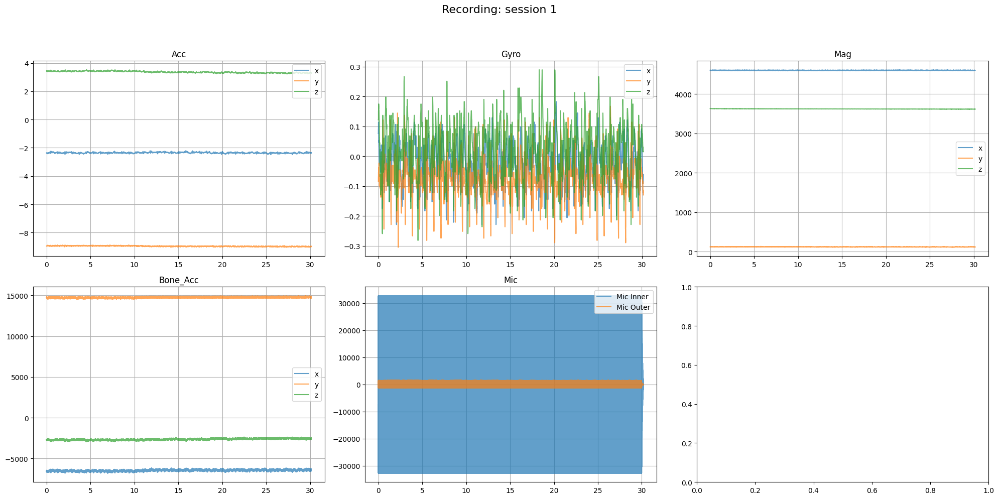

In [ ]:
trimmed_path = '/content/trimmed dual csv data/oe data/patient 6 - osteoporosis/right ear/session 1'

plot_trimmed_record(trimmed_path);

Found 18 unique records to plot.
Plotting record: Session1
Loaded sensor data from: /content/trimmed dual csv data/oe data/patient 1 - healthy/right ear/Session1_sensors.csv
Loaded microphone data from: /content/trimmed dual csv data/oe data/patient 1 - healthy/right ear/Session1_mic.csv


/tmp/ipykernel_535/3657277581.py:141: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to make space for suptitle
/tmp/ipykernel_535/3657277581.py:142: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f"{root_name}_plot.png")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


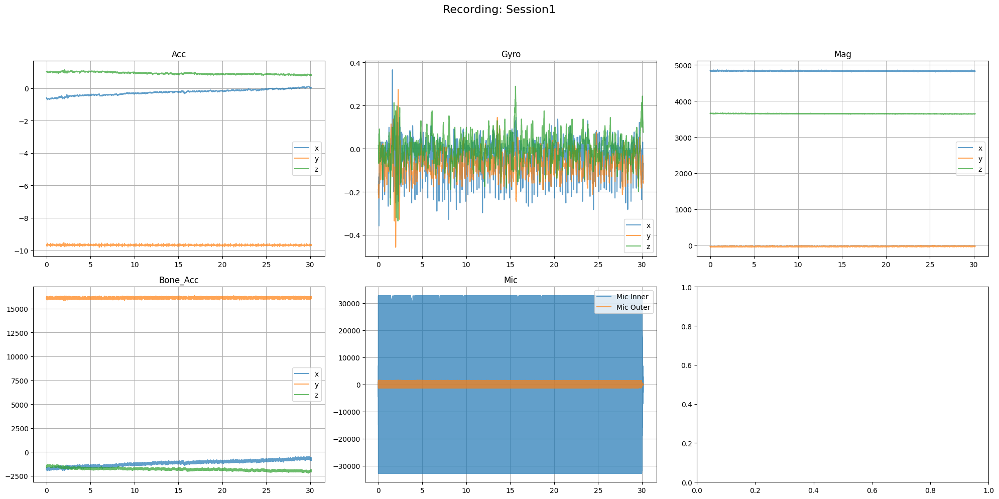

Plotting record: Session2
Loaded sensor data from: /content/trimmed dual csv data/oe data/patient 1 - healthy/right ear/Session2_sensors.csv
Loaded microphone data from: /content/trimmed dual csv data/oe data/patient 1 - healthy/right ear/Session2_mic.csv


/tmp/ipykernel_535/3657277581.py:141: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to make space for suptitle
/tmp/ipykernel_535/3657277581.py:142: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f"{root_name}_plot.png")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


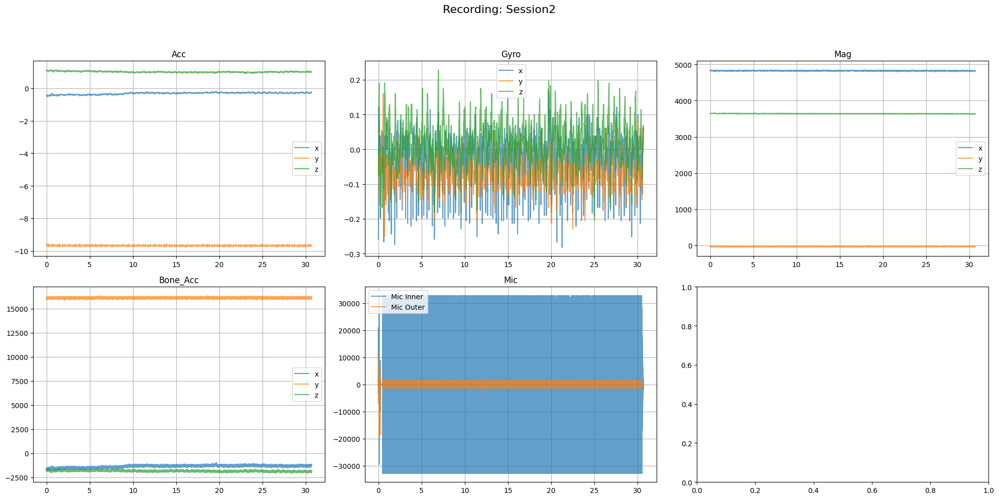

Plotting record: Session3
Loaded sensor data from: /content/trimmed dual csv data/oe data/patient 1 - healthy/right ear/Session3_sensors.csv
Loaded microphone data from: /content/trimmed dual csv data/oe data/patient 1 - healthy/right ear/Session3_mic.csv


/tmp/ipykernel_535/3657277581.py:141: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to make space for suptitle
/tmp/ipykernel_535/3657277581.py:142: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f"{root_name}_plot.png")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


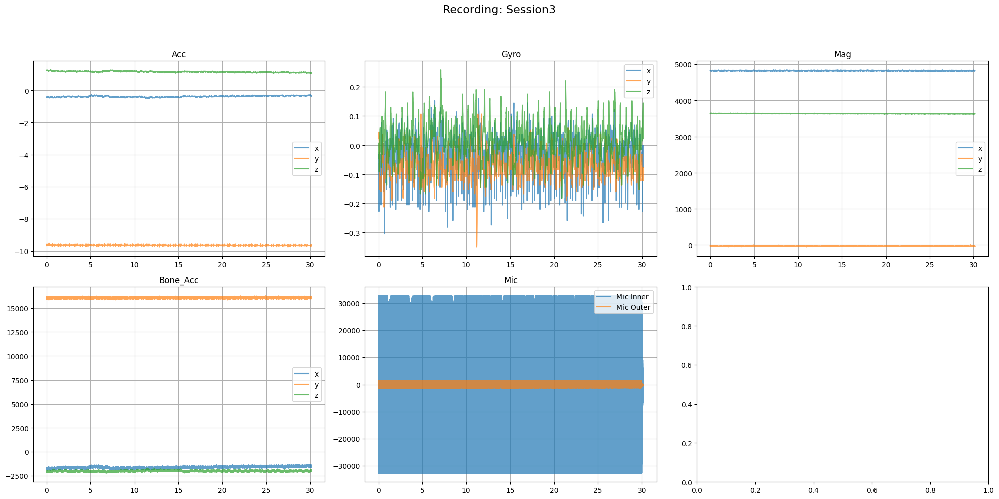

Plotting record: Session4
Loaded sensor data from: /content/trimmed dual csv data/oe data/patient 1 - healthy/right ear/Session4_sensors.csv
Loaded microphone data from: /content/trimmed dual csv data/oe data/patient 1 - healthy/right ear/Session4_mic.csv


/tmp/ipykernel_535/3657277581.py:141: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to make space for suptitle
/tmp/ipykernel_535/3657277581.py:142: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f"{root_name}_plot.png")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


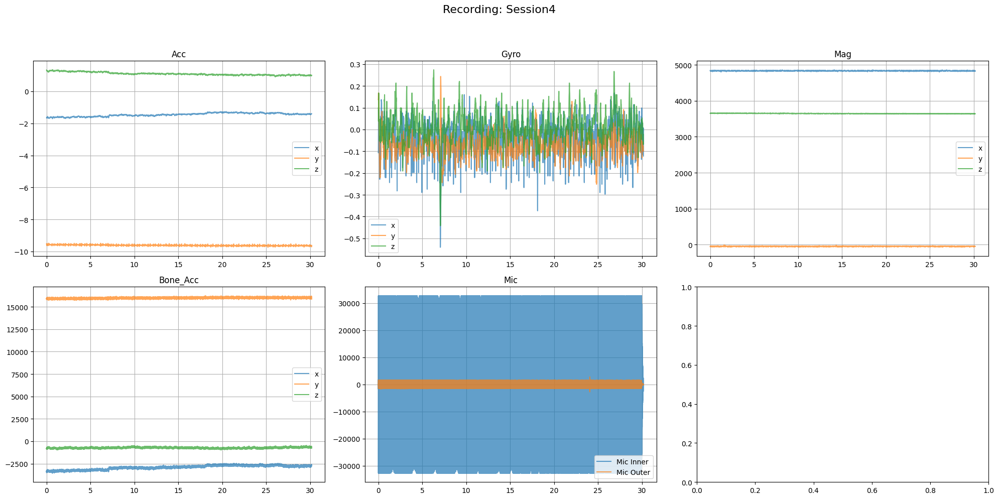

Plotting record: Session1
Loaded sensor data from: /content/trimmed dual csv data/oe data/patient 4 - osteoporosis/right ear/Session1_sensors.csv
Loaded microphone data from: /content/trimmed dual csv data/oe data/patient 4 - osteoporosis/right ear/Session1_mic.csv


/tmp/ipykernel_535/3657277581.py:141: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to make space for suptitle
/tmp/ipykernel_535/3657277581.py:142: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f"{root_name}_plot.png")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


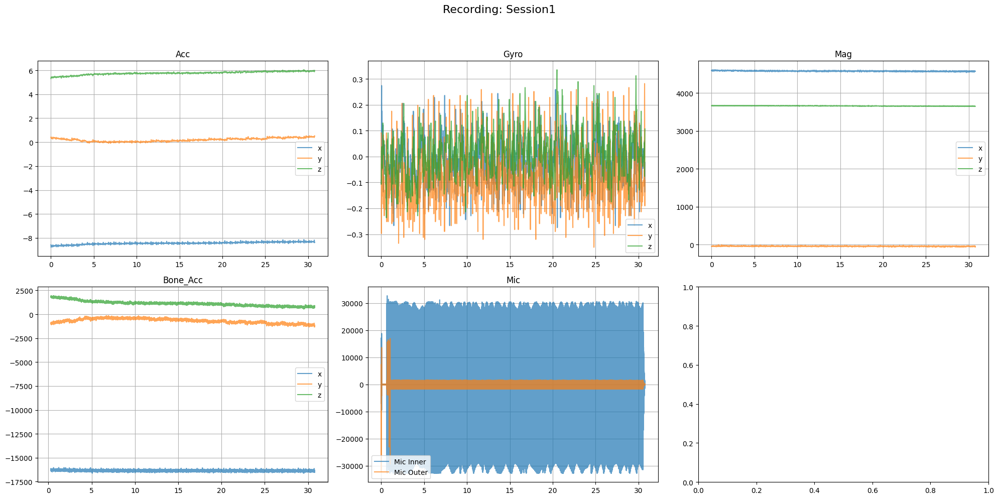

Plotting record: Session2
Loaded sensor data from: /content/trimmed dual csv data/oe data/patient 4 - osteoporosis/right ear/Session2_sensors.csv
Loaded microphone data from: /content/trimmed dual csv data/oe data/patient 4 - osteoporosis/right ear/Session2_mic.csv


/tmp/ipykernel_535/3657277581.py:141: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to make space for suptitle
/tmp/ipykernel_535/3657277581.py:142: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f"{root_name}_plot.png")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


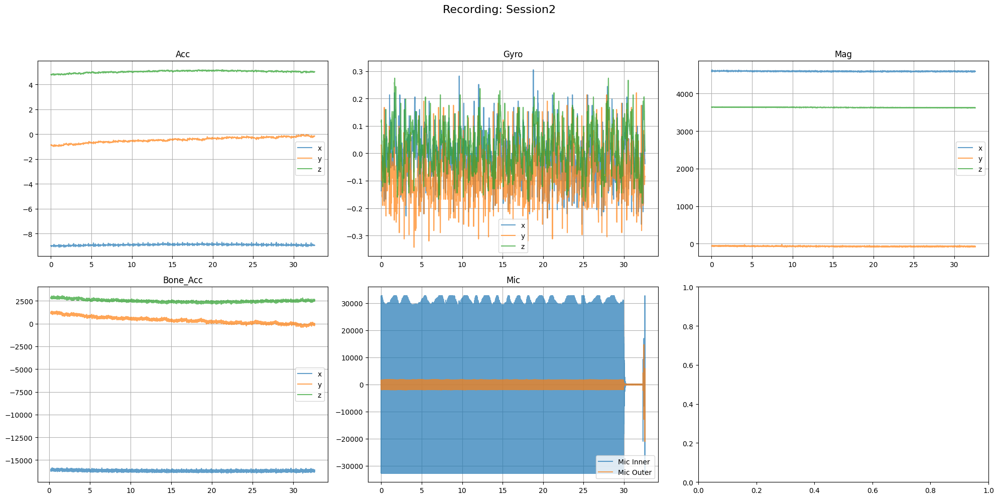

Plotting record: Session3
Loaded sensor data from: /content/trimmed dual csv data/oe data/patient 4 - osteoporosis/right ear/Session3_sensors.csv
Loaded microphone data from: /content/trimmed dual csv data/oe data/patient 4 - osteoporosis/right ear/Session3_mic.csv


/tmp/ipykernel_535/3657277581.py:141: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to make space for suptitle
/tmp/ipykernel_535/3657277581.py:142: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f"{root_name}_plot.png")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


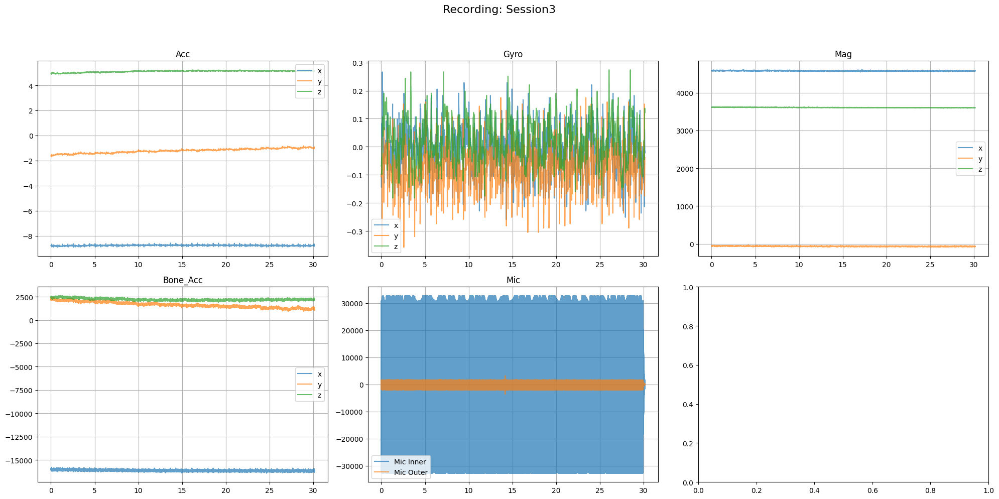

Plotting record: session 1
Loaded sensor data from: /content/trimmed dual csv data/oe data/patient 5 - healthy/right ear/session 1_sensors.csv
Loaded microphone data from: /content/trimmed dual csv data/oe data/patient 5 - healthy/right ear/session 1_mic.csv


/tmp/ipykernel_535/3657277581.py:141: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to make space for suptitle
/tmp/ipykernel_535/3657277581.py:142: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f"{root_name}_plot.png")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


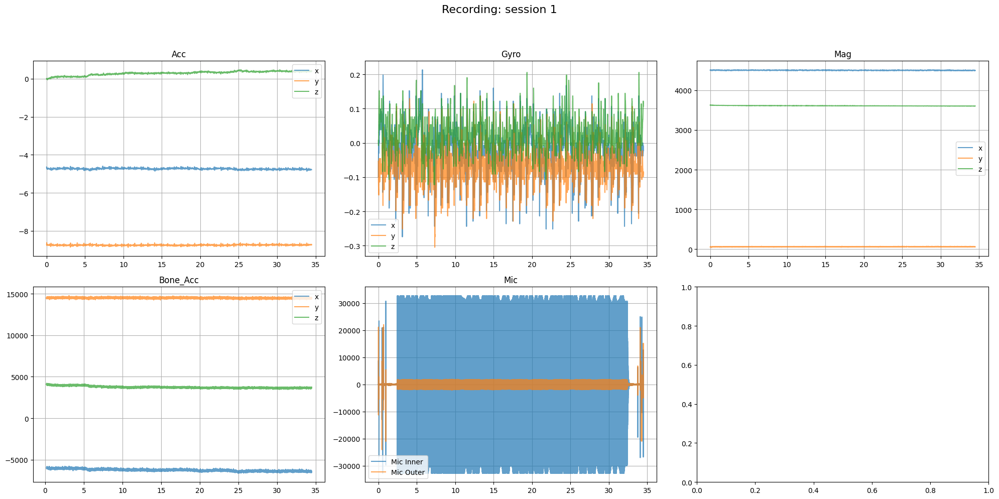

Plotting record: session 2
Loaded sensor data from: /content/trimmed dual csv data/oe data/patient 5 - healthy/right ear/session 2_sensors.csv
Loaded microphone data from: /content/trimmed dual csv data/oe data/patient 5 - healthy/right ear/session 2_mic.csv


/tmp/ipykernel_535/3657277581.py:141: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to make space for suptitle
/tmp/ipykernel_535/3657277581.py:142: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f"{root_name}_plot.png")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


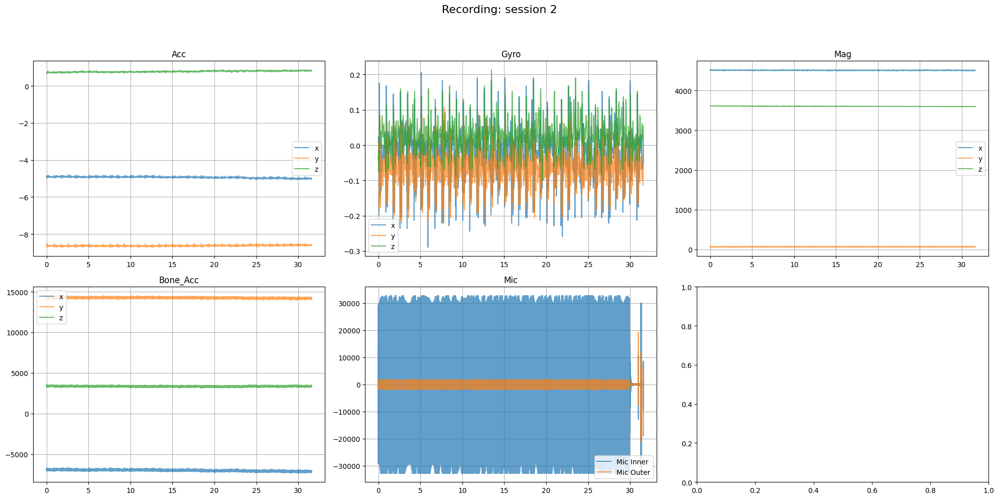

Plotting record: session 3
Loaded sensor data from: /content/trimmed dual csv data/oe data/patient 5 - healthy/right ear/session 3_sensors.csv
Loaded microphone data from: /content/trimmed dual csv data/oe data/patient 5 - healthy/right ear/session 3_mic.csv


/tmp/ipykernel_535/3657277581.py:141: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to make space for suptitle
/tmp/ipykernel_535/3657277581.py:142: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f"{root_name}_plot.png")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


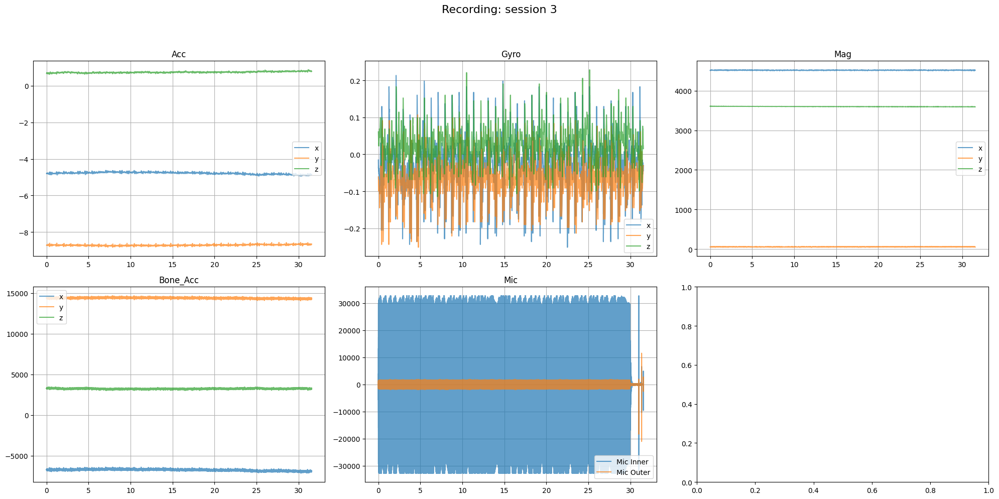

Plotting record: session 4
Loaded sensor data from: /content/trimmed dual csv data/oe data/patient 5 - healthy/right ear/session 4_sensors.csv
Loaded microphone data from: /content/trimmed dual csv data/oe data/patient 5 - healthy/right ear/session 4_mic.csv


/tmp/ipykernel_535/3657277581.py:141: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to make space for suptitle
/tmp/ipykernel_535/3657277581.py:142: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f"{root_name}_plot.png")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


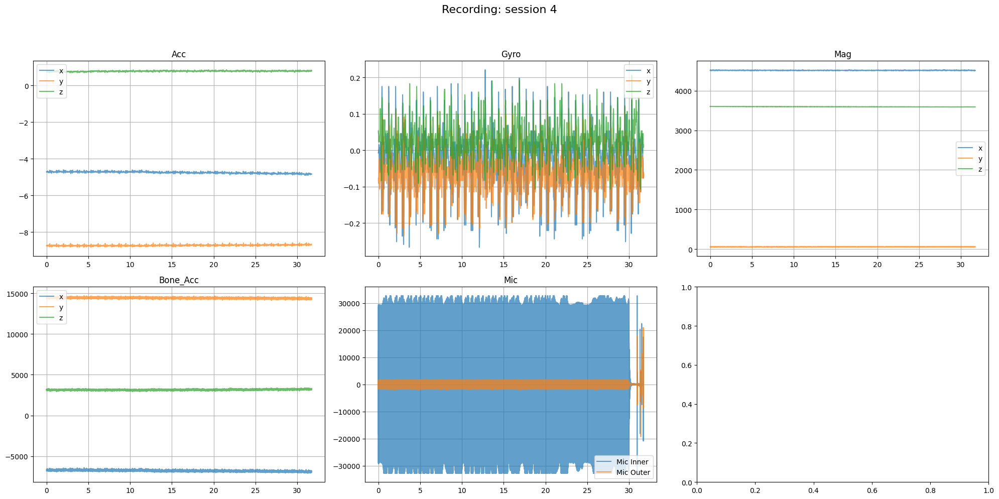

Plotting record: session 1
Loaded sensor data from: /content/trimmed dual csv data/oe data/patient 6 - osteoporosis/right ear/session 1_sensors.csv
Loaded microphone data from: /content/trimmed dual csv data/oe data/patient 6 - osteoporosis/right ear/session 1_mic.csv


/tmp/ipykernel_535/3657277581.py:141: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to make space for suptitle
/tmp/ipykernel_535/3657277581.py:142: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f"{root_name}_plot.png")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


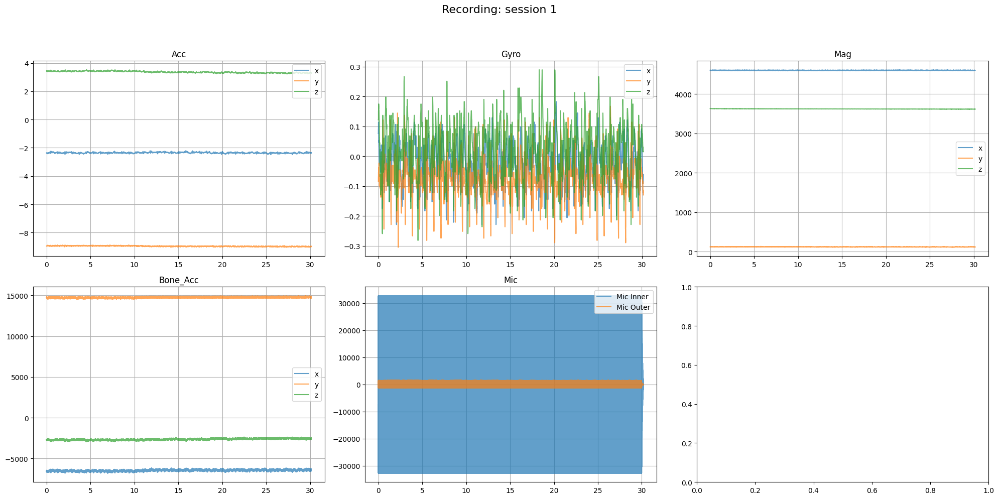

Plotting record: session 2
Loaded sensor data from: /content/trimmed dual csv data/oe data/patient 6 - osteoporosis/right ear/session 2_sensors.csv
Loaded microphone data from: /content/trimmed dual csv data/oe data/patient 6 - osteoporosis/right ear/session 2_mic.csv


/tmp/ipykernel_535/3657277581.py:141: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to make space for suptitle
/tmp/ipykernel_535/3657277581.py:142: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f"{root_name}_plot.png")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


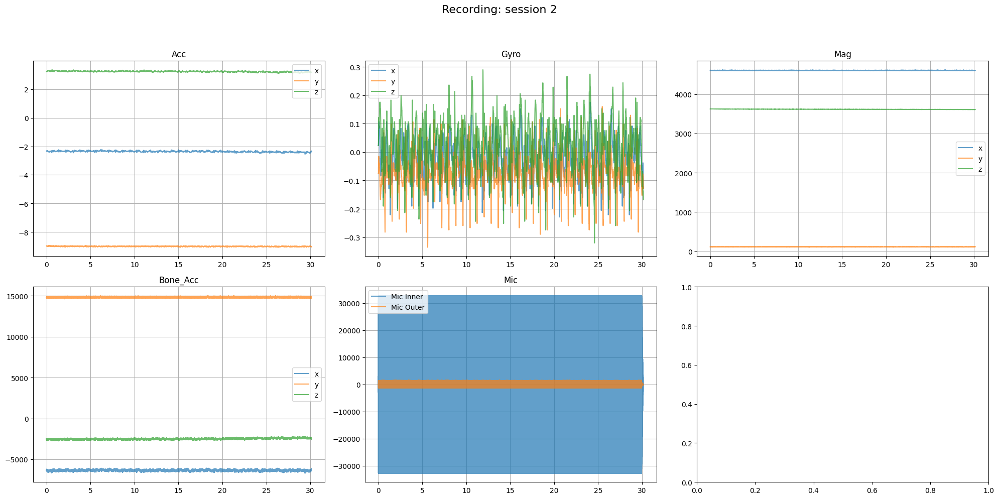

Plotting record: session 1
Loaded sensor data from: /content/trimmed dual csv data/oe data/patient 7 - osteoporosis/right ear/session 1_sensors.csv
Loaded microphone data from: /content/trimmed dual csv data/oe data/patient 7 - osteoporosis/right ear/session 1_mic.csv


/tmp/ipykernel_535/3657277581.py:141: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to make space for suptitle
/tmp/ipykernel_535/3657277581.py:142: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f"{root_name}_plot.png")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


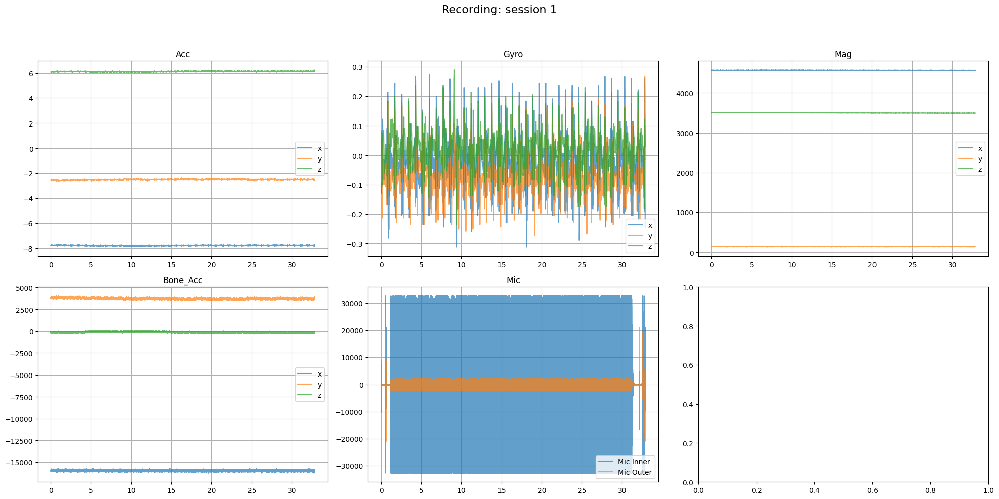

Plotting record: session 2
Loaded sensor data from: /content/trimmed dual csv data/oe data/patient 7 - osteoporosis/right ear/session 2_sensors.csv
Loaded microphone data from: /content/trimmed dual csv data/oe data/patient 7 - osteoporosis/right ear/session 2_mic.csv


/tmp/ipykernel_535/3657277581.py:141: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to make space for suptitle
/tmp/ipykernel_535/3657277581.py:142: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f"{root_name}_plot.png")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


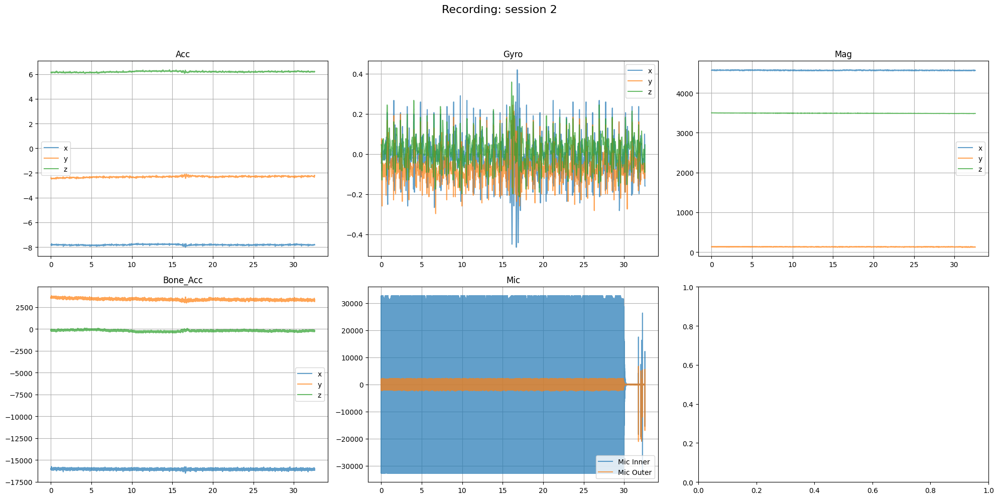

Plotting record: session 3
Loaded sensor data from: /content/trimmed dual csv data/oe data/patient 7 - osteoporosis/right ear/session 3_sensors.csv
Loaded microphone data from: /content/trimmed dual csv data/oe data/patient 7 - osteoporosis/right ear/session 3_mic.csv


/tmp/ipykernel_535/3657277581.py:141: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to make space for suptitle
/tmp/ipykernel_535/3657277581.py:142: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f"{root_name}_plot.png")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


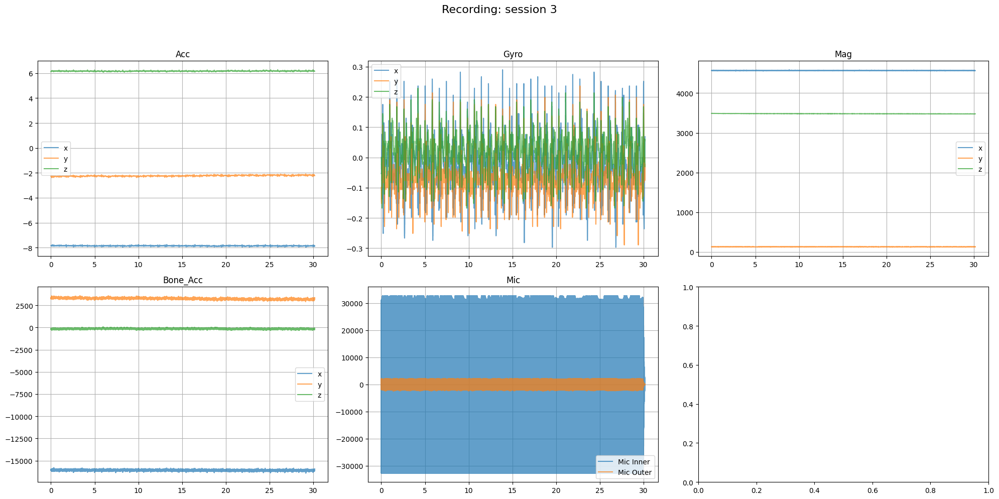

Plotting record: session 1
Loaded sensor data from: /content/trimmed dual csv data/oe data/patient 8 - osteoporosis/right ear/session 1_sensors.csv
Loaded microphone data from: /content/trimmed dual csv data/oe data/patient 8 - osteoporosis/right ear/session 1_mic.csv


/tmp/ipykernel_535/3657277581.py:141: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to make space for suptitle
/tmp/ipykernel_535/3657277581.py:142: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f"{root_name}_plot.png")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


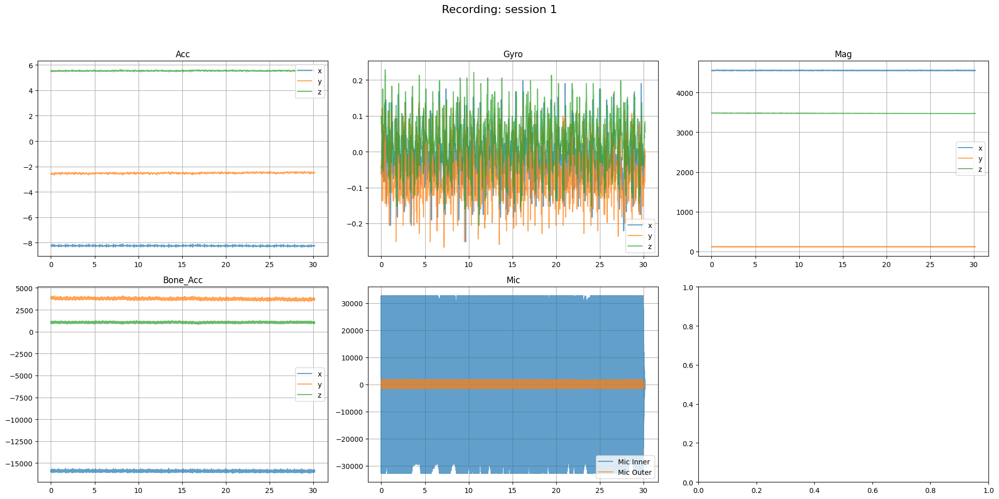

Plotting record: session 2
Loaded sensor data from: /content/trimmed dual csv data/oe data/patient 8 - osteoporosis/right ear/session 2_sensors.csv
Loaded microphone data from: /content/trimmed dual csv data/oe data/patient 8 - osteoporosis/right ear/session 2_mic.csv


/tmp/ipykernel_535/3657277581.py:141: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to make space for suptitle
/tmp/ipykernel_535/3657277581.py:142: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f"{root_name}_plot.png")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


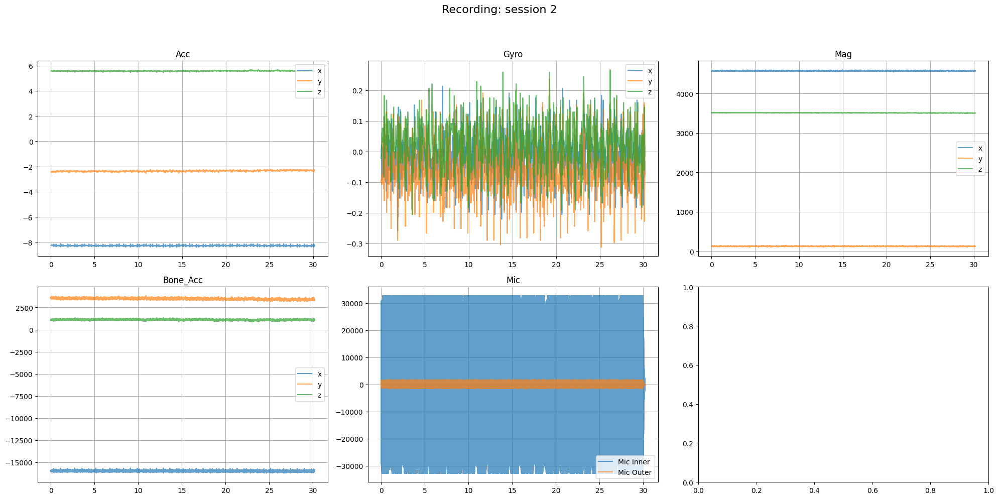

In [19]:
import os

trimmed_data_root = '/content/trimmed dual csv data'

# To store unique root names (e.g., without _sensors.csv or _mic.csv suffix)
unique_record_paths = set()

for dirpath, dirnames, filenames in os.walk(trimmed_data_root):
    for filename in filenames:
        # We are looking for either _sensors.csv or _mic.csv to identify a record
        if filename.endswith('_sensors.csv'):
            # Extract the root name by removing the suffix
            root_name = os.path.join(dirpath, filename.replace('_sensors.csv', ''))
            unique_record_paths.add(root_name)
        elif filename.endswith('_mic.csv'):
            # Extract the root name by removing the suffix
            root_name = os.path.join(dirpath, filename.replace('_mic.csv', ''))
            unique_record_paths.add(root_name)

print(f"Found {len(unique_record_paths)} unique records to plot.")

for record_path in sorted(list(unique_record_paths)):
    print(f"Plotting record: {os.path.basename(record_path)}")
    try:
        plot_trimmed_record(record_path)
    except Exception as e:
        print(f"Error plotting {record_path}: {e}")

In [20]:
# # name_of_zip_file, format, directory_to_zip
shutil.make_archive('semi final trimmed dual csv data with plots', 'zip', 'trimmed dual csv data')

'/content/semi final trimmed dual csv data with plots.zip'

# Features Extraction

**Adjustments and omissions — brief notes**

| § | Status | Note |
|---|---|---|
| **§2** | ✅ Full | Exact 264-sample cycles; incomplete trailing cycle discarded |
| **§3** | ✅ Full | Bandpass 14–21 kHz, zero-phase Butterworth; applied to both direct and echo sub-windows separately |
| **§4** | ✅ Adjusted | IMU windows are aligned to the same `BONE_BLOCK_MS = 200 ms` blocks used for bone/fusion — this is the practical midpoint of 100–500 ms and avoids three mismatched grid sizes. The threshold `IMU_MOTION_THRESH` is exposed at the top for easy tuning |
| **§5** | ✅ Partial | Outer mic provides `outer_noise_rms` and `echo_snr_db` per cycle. **Full** adaptive subtraction (Wiener/LMS) is not applied: a single 5 ms echo window is far too short to reliably estimate and subtract a noise transfer function without distorting the chirp reflections. The SNR metric is available to filter cycles in post-hoc analysis |
| **§6–§8** | ✅ Full | All 12 echo features + 5 direct features extracted per cycle |
| **§9–§11** | ✅ Full | Bone magnitude (3-axis norm), bandpass 20–3000 Hz, all 10 features |
| **§12–§13** | ✅ Full | Block-level fusion; anatomy normalisation is implicit via `echo_to_direct_ratio` and `direct_energy` |
| **§14** | ✅ (embedded) | Listed in spec as "aggregate" — implemented as §15 |
| **§15** | ✅ Full | `mean`, `median`, `std`, `IQR`, `p10`, `p90`, `CV` over all valid blocks &rarr; one row per session in `session_features.csv` |

---


Intermediate files saved per session: `cycles_<id>.parquet` (cycle-level) and `blocks_<id>.parquet` (block-level), both in `--out`.

## Helper functions

In [6]:
"""
extract_features.py
════════════════════════════════════════════════════════════════════════════════
Osteoporosis acoustic feature extraction pipeline.
Processes trimmed session CSVs produced by trim_oe_sessions.py.

Implements requirements §2–§15 from the analysis specification, PLUS an
additive integration of the paper's EarSonar feature block (§P) which
contributes 19 extra columns (13 MFCCs + 6 PSD statistics) per cycle,
aggregated to session level exactly like all other features.

Usage
─────
    python extract_features.py                        # default paths
    python extract_features.py --data data/ --out output/

Arguments
─────────
    --data   Root directory of trimmed sessions  (default: data/)
    --out    Output directory for all CSVs        (default: output/)

Expected input layout
─────────────────────
    data/
      patient 1 - healthy/
        right ear/
          right ear session 1/
            right ear session 1_sensors.csv
            right ear session 1_mic.csv
          right ear session 2/ ...
        left ear/ ...
      patient 2 - osteopenia/ ...
      patient 3 - osteoporosis/ ...

Intermediate outputs (in --out)
────────────────────────────────
    cycles_<session_id>.parquet      — per-5.5 ms-cycle mic features (§2–§8)
    blocks_<session_id>.parquet      — per-100-500 ms fused features (§9–§13)

Final output
────────────
    session_features.csv             — one row per session            (§15)
"""

import os
import re
import sys
import argparse
import warnings
from pathlib import Path
from typing import Dict, List, Optional, Tuple

import librosa
import numpy as np
import pandas as pd
from scipy import stats as scipy_stats
from scipy.signal import butter, sosfilt, welch, find_peaks
from scipy.stats import entropy as scipy_entropy

warnings.filterwarnings("ignore", category=RuntimeWarning)

# ════════════════════════════════════════════════════════════════════════════
# CONFIGURABLE CONSTANTS
# ════════════════════════════════════════════════════════════════════════════
MIC_FS        = 48_000          # Hz — inner/outer microphone
BONE_FS       = 6_400           # Hz — bone conduction accelerometer
IMU_FS        = 400             # Hz — IMU (for motion rejection context)

CHIRP_MS      = 0.5             # ms  — duration of direct chirp part per cycle
CYCLE_MS      = 5.5             # ms  — total cycle duration
CHIRP_SAMPLES = round(MIC_FS * CHIRP_MS  / 1000)   # 24 samples
CYCLE_SAMPLES = round(MIC_FS * CYCLE_MS  / 1000)   # 264 samples

# §3 — Mic bandpass
MIC_BP_LOW    = 15_500          # Hz
MIC_BP_HIGH   = 20_500          # Hz

# §4 — IMU motion-rejection block
IMU_BLOCK_MS  = 200             # ms  — chosen midpoint of 100–500 ms range
IMU_MOTION_THRESH = 0.15        # g   — acceleration RMS threshold for rejection

# §9/§10 — Bone-sensor window
BONE_BLOCK_MS = 200             # ms  — same window as IMU for alignment
BONE_BP_LOW   = 20              # Hz
BONE_BP_HIGH  = 3_000           # Hz

# §8 — Echo split inside a cycle
ECHO_EARLY_MS = 1.0             # ms  — boundary between early and late echo
ECHO_EARLY_SAMPLES = round(MIC_FS * ECHO_EARLY_MS / 1000)


# ── §P — Paper pipeline config ───────────────────────────────────────────────
# Matches PipelineConfig from osteoporosis_earsonar_pipeline.py
PAPER_BUTTER_ORDER         = 4
PAPER_ENERGY_WINDOW        = 256          # samples
PAPER_START_THRESH_SIGMA   = 1.0
PAPER_MIN_EVENT_GAP        = 200          # samples
PAPER_PARITY_PT            = 0.55
PAPER_PARITY_MIN_SUPPORT   = 12
PAPER_PARITY_SUBSEQ_LEN    = 75
PAPER_EXPECTED_DELAY       = 4            # samples — confirmed mode from data
PAPER_DELAY_TOLERANCE      = 3           # samples
PAPER_FFT_N                = 128
PAPER_FFT_HALF_WINDOW      = 64
PAPER_MFCC_N               = 13
PAPER_MFCC_N_MELS          = 26
PAPER_MFCC_FMIN            = 15_000
PAPER_MFCC_FMAX            = 21_000

# ════════════════════════════════════════════════════════════════════════════
# HELPER: zero-phase Butterworth bandpass
# ════════════════════════════════════════════════════════════════════════════
def bandpass(signal: np.ndarray, low: float, high: float,
             fs: float, order: int = 5) -> np.ndarray:
    nyq = 0.5 * fs
    lo  = max(low  / nyq, 1e-6)
    hi  = min(high / nyq, 1 - 1e-6)
    sos = butter(order, [lo, hi], btype="band", output="sos")
    return sosfilt(sos, signal.astype(np.float64))


def apply_hann(x: np.ndarray) -> np.ndarray:
    return (x * np.hanning(len(x))).astype(np.float32)

# ════════════════════════════════════════════════════════════════════════════
# §2  SEGMENT MICROPHONE DATA INTO 5.5 ms CYCLES
# ════════════════════════════════════════════════════════════════════════════
# def segment_mic_cycles(mic_inner: np.ndarray,
#                        mic_outer: np.ndarray) -> list[dict]:
#     """
#     Split mic arrays into non-overlapping CYCLE_SAMPLES windows.
#     Returns list of dicts with keys: cycle_idx, inner, outer,
#     direct (0–0.5 ms), echo (0.5–5.5 ms).
#     Incomplete trailing cycle is discarded.
#     """
#     n_cycles = len(mic_inner) // CYCLE_SAMPLES
#     cycles   = []
#     for i in range(n_cycles):
#         s = i * CYCLE_SAMPLES
#         e = s + CYCLE_SAMPLES
#         inner = mic_inner[s:e]
#         outer = mic_outer[s:e]
#         cycles.append({
#             "cycle_idx"   : i,
#             "t_start_ms"  : s / MIC_FS * 1000,
#             "inner"       : inner,
#             "outer"       : outer,
#             "direct_inner": inner[:CHIRP_SAMPLES],
#             "echo_inner"  : inner[CHIRP_SAMPLES:],
#             "direct_outer": outer[:CHIRP_SAMPLES],
#             "echo_outer"  : outer[CHIRP_SAMPLES:],
#         })
#     return cycles

# Specific frequencies for synthetic chirp template generation as per prompt
SYNTH_CHIRP_F0 = 16_000         # Hz
SYNTH_CHIRP_F1 = 20_000         # Hz

def segment_mic_cycles(mic_inner: np.ndarray,
                                     mic_outer: np.ndarray) -> list[dict]:
    """
    Modified version of segment_mic_cycles that uses cross-correlation to precisely
    detect the true start of the first chirp cycle within the provided mic signals.
    All subsequent cycles then follow deterministically.

    Args:
        mic_inner (np.ndarray): Inner microphone signal (already trimmed by detect_chirp_window).
        mic_outer (np.ndarray): Outer microphone signal (already trimmed by detect_chirp_window).

    Returns:
        list[dict]: List of dictionaries, each representing a cycle with
                    inner, outer, direct, and echo signal segments.
    """
    if len(mic_inner) < CHIRP_SAMPLES:
        return [] # Not enough samples for even one chirp

    # 1. Generate a synthetic 16->20 kHz FMCW chirp template (24 samples)
    t_template = np.arange(CHIRP_SAMPLES) / MIC_FS
    B = SYNTH_CHIRP_F1 - SYNTH_CHIRP_F0
    # Instantaneous frequency: f(t) = f0 + (B/T)*t
    # Phase: phi(t) = 2*pi * integral(f(tau) dtau) = 2*pi * (f0*t + 0.5*(B/T)*t**2)
    phase = 2 * np.pi * (SYNTH_CHIRP_F0 * t_template + 0.5 * (B / (CHIRP_MS / 1000)) * t_template**2)
    chirp_template = np.sin(phase).astype(np.float32)

    # 2. Cross-correlate with the initial segment of the mic_inner signal
    # Search window: first ~3 secs of the trimmed inner mic signal
    # 3 secs = 3.0 s = 3.0 * 48000 = 144000 samples
    search_window_len_samples = min(int(3.0 * MIC_FS), len(mic_inner))
    search_segment = mic_inner[:search_window_len_samples].astype(np.float32)

    if len(search_segment) < CHIRP_SAMPLES:
        # If the trimmed mic_inner is too short for correlation, assume start is 0
        true_start_offset_samples = 0
    else:
        # Use 'valid' mode for correlation to ensure the template is fully contained
        correlation = np.correlate(search_segment, chirp_template, mode='valid')
        true_start_offset_samples = np.argmax(correlation)

    # 3. Adjust slicing based on the detected true start
    # The true_start_offset_samples is the index within mic_inner where the
    # first chirp *actually* begins, aligned to its phase.

    cycles = []
    # Start the first cycle from the detected true offset
    current_sample_idx = true_start_offset_samples

    while (current_sample_idx + CYCLE_SAMPLES) <= len(mic_inner):
        s = current_sample_idx
        e = s + CYCLE_SAMPLES

        inner = mic_inner[s:e]
        outer = mic_outer[s:e]

        cycles.append({
            "cycle_idx"   : len(cycles), # Deterministic cycle index (0, 1, 2... for found cycles)
            "t_start_ms"  : s / MIC_FS * 1000,
            "inner"       : inner,
            "outer"       : outer,
            "direct_inner": inner[:CHIRP_SAMPLES],
            "echo_inner"  : inner[CHIRP_SAMPLES:],
            "direct_outer": outer[:CHIRP_SAMPLES],
            "echo_outer"  : outer[CHIRP_SAMPLES:],
        })
        current_sample_idx += CYCLE_SAMPLES

    return cycles



# ════════════════════════════════════════════════════════════════════════════
# §3  FILTER MICROPHONE SIGNALS
# ════════════════════════════════════════════════════════════════════════════
def filter_mic_cycle(cycle: dict) -> dict:
    """
    Apply bandpass (MIC_BP_LOW–MIC_BP_HIGH Hz) to inner and outer
    mic sub-arrays within each cycle.
    """
    def bp(x):
        return bandpass(x, MIC_BP_LOW, MIC_BP_HIGH, MIC_FS)

    cycle["direct_inner_f"] = bp(cycle["direct_inner"])
    cycle["echo_inner_f"]   = bp(cycle["echo_inner"])
    cycle["direct_outer_f"] = bp(cycle["direct_outer"])
    cycle["echo_outer_f"]   = bp(cycle["echo_outer"])
    return cycle


# ════════════════════════════════════════════════════════════════════════════
# §5  ENVIRONMENTAL NOISE ESTIMATION (outward mic)
# ════════════════════════════════════════════════════════════════════════════
def estimate_outer_noise(cycle: dict) -> dict:
    """
    Use the filtered outward mic to estimate environmental noise level
    and SNR for the echo window.
    The direct chirp is NOT attenuated — it is preserved for normalisation.

    NOTE: Full adaptive noise reduction (e.g. Wiener / LMS) requires a
    longer reference signal than a single 5 ms echo window.  We therefore
    compute noise metrics only; cycle rejection based on high outer energy
    is handled here and used in §4/§12 fusion.
    """
    outer_echo  = cycle["echo_outer_f"].astype(np.float64)
    inner_echo  = cycle["echo_inner_f"].astype(np.float64)
    outer_rms   = np.sqrt(np.mean(outer_echo ** 2)) + 1e-12
    inner_rms   = np.sqrt(np.mean(inner_echo ** 2)) + 1e-12
    cycle["outer_noise_rms"] = outer_rms
    cycle["echo_snr_db"]     = 20 * np.log10(inner_rms / outer_rms)
    return cycle


# ════════════════════════════════════════════════════════════════════════════
# §6  DIRECT CHIRP FEATURE EXTRACTION
# ════════════════════════════════════════════════════════════════════════════
def extract_direct_features(cycle: dict) -> dict:
    """
    Extract reference/QC features from the 0–0.5 ms direct-chirp window.
    These are for normalisation and QC only (§13), not primary biomarkers.
    """
    d = cycle["direct_inner_f"].astype(np.float64)
    t = np.arange(len(d)) / MIC_FS

    energy = float(np.sum(d ** 2))
    peak   = float(np.max(np.abs(d)))

    # Spectral centroid via Welch
    freqs, psd = welch(d, fs=MIC_FS, nperseg=min(len(d), CHIRP_SAMPLES))
    total_psd  = psd.sum() + 1e-30
    centroid   = float(np.sum(freqs * psd) / total_psd)

    peak_sample = int(np.argmax(np.abs(d)))
    peak_time   = float(peak_sample / MIC_FS * 1000)   # ms

    # SNR: signal vs outer-mic direct noise
    outer_d    = cycle["direct_outer_f"].astype(np.float64)
    noise_rms  = np.sqrt(np.mean(outer_d ** 2)) + 1e-12
    direct_rms = np.sqrt(np.mean(d ** 2)) + 1e-12
    snr        = float(20 * np.log10(direct_rms / noise_rms))

    cycle.update({
        "direct_energy"          : energy,
        "direct_peak"            : peak,
        "direct_spectral_centroid": centroid,
        "direct_peak_time"       : peak_time,
        "direct_SNR"             : snr,
    })
    return cycle


# ════════════════════════════════════════════════════════════════════════════
# §7  NORMALISE ECHO FEATURES USING DIRECT CHIRP ENERGY
# ════════════════════════════════════════════════════════════════════════════
#   Normalisation is applied after echo feature extraction (§8) using:
#       echo_to_direct_ratio = echo_energy / direct_energy

# ════════════════════════════════════════════════════════════════════════════
# §8  ECHO FEATURE EXTRACTION
# ════════════════════════════════════════════════════════════════════════════
def extract_echo_features(cycle: dict) -> dict:
    """
    Extract primary biomarker features from the 0.5–5.5 ms echo window.
    Normalises against direct_energy (§7).
    """
    e  = cycle["echo_inner_f"].astype(np.float64)
    fs = MIC_FS
    t  = np.arange(len(e)) / fs * 1000   # ms

    # ── Energy & amplitude ─────────────────────────────────────────────────
    echo_energy = float(np.sum(e ** 2))
    direct_e    = max(cycle.get("direct_energy", 1.0), 1e-30)

    # §7 normalisation
    echo_to_direct = echo_energy / direct_e

    # ── Peak delay ─────────────────────────────────────────────────────────
    env             = np.abs(e)
    peak_idx        = int(np.argmax(env))
    echo_peak_delay = float(t[peak_idx])   # ms from chirp end

    # ── Echo width (–6 dB around peak) ────────────────────────────────────
    half_peak   = env[peak_idx] * 0.5
    above       = np.where(env >= half_peak)[0]
    echo_width  = float((above[-1] - above[0]) / fs * 1000) if len(above) > 1 else 0.0

    # ── Decay slope (log-linear fit on envelope) ───────────────────────────
    safe_env  = np.maximum(env, 1e-12)
    log_env   = np.log(safe_env)
    slope, _  = np.polyfit(t, log_env, 1)
    echo_decay_slope = float(slope)

    # ── Spectral features (Welch PSD) ──────────────────────────────────────
    nperseg = min(len(e), 128)
    freqs, psd = welch(e, fs=fs, nperseg=nperseg)
    total_psd  = psd.sum() + 1e-30

    centroid   = float(np.sum(freqs * psd) / total_psd)
    bandwidth  = float(np.sqrt(np.sum((freqs - centroid) ** 2 * psd) / total_psd))

    # Spectral flatness = geometric mean / arithmetic mean of PSD
    log_psd      = np.log(psd + 1e-30)
    geo_mean     = np.exp(log_psd.mean())
    arith_mean   = psd.mean() + 1e-30
    flatness     = float(geo_mean / arith_mean)

    # ── High/low energy ratio (above/below spectral centroid) ─────────────
    low_mask      = freqs <= centroid
    high_mask     = ~low_mask
    low_e         = psd[low_mask].sum() + 1e-30
    high_e        = psd[high_mask].sum() + 1e-30
    high_low_ratio = float(high_e / low_e)

    # ── Resonance frequency & Q-factor ─────────────────────────────────────
    peak_f_idx         = int(np.argmax(psd))
    resonance_freq     = float(freqs[peak_f_idx])

    # –3 dB bandwidth around resonance
    half_psd  = psd[peak_f_idx] * 0.5
    above_psd = np.where(psd >= half_psd)[0]
    if len(above_psd) > 1:
        bw_3db = float((freqs[above_psd[-1]] - freqs[above_psd[0]]))
        q_factor = resonance_freq / max(bw_3db, 1e-6)
    else:
        q_factor = 0.0

    # ── Late-to-early echo ratio ────────────────────────────────────────────
    early = e[:ECHO_EARLY_SAMPLES]
    late  = e[ECHO_EARLY_SAMPLES:]
    early_e = np.sum(early ** 2) + 1e-30
    late_e  = np.sum(late  ** 2) + 1e-30
    late_to_early = float(late_e / early_e)

    cycle.update({
        "echo_energy"             : echo_energy,
        "echo_to_direct_ratio"    : echo_to_direct,
        "echo_peak_delay_ms"      : echo_peak_delay,
        "echo_width_ms"           : echo_width,
        "echo_decay_slope"        : echo_decay_slope,
        "echo_high_low_ratio"     : high_low_ratio,
        "echo_spectral_centroid"  : centroid,
        "echo_spectral_bandwidth" : bandwidth,
        "echo_spectral_flatness"  : flatness,
        "echo_resonance_frequency": resonance_freq,
        "echo_q_factor"           : q_factor,
        "late_to_early_echo_ratio": late_to_early,
    })
    return cycle




# ════════════════════════════════════════════════════════════════════════════
# §P  PAPER PIPELINE INTEGRATION BLOCK
#     Additive — does not replace any existing feature.
#     Operates on the same phase-aligned echo window already used by §8,
#     so both pipelines share identical cycle boundaries (Fix 2 guarantee).
#
#     Sub-steps reproduced from osteoporosis_earsonar_pipeline.py:
#       P1 — Hann window on echo segment
#       P2 — Adaptive energy event detection (paper Eq 6/7)
#       P3 — Parity decomposition / echo candidate scoring
#       P4 — FFT window extraction around best candidate
#       P5 — PSD, 13 MFCCs, 6 statistical features
# ════════════════════════════════════════════════════════════════════════════

# ── P1 — Hann-windowed echo segment ─────────────────────────────────────────
def _paper_prepare_echo(echo_inner_f: np.ndarray) -> np.ndarray:
    """
    Apply Hann window to the already-bandpass-filtered echo segment.
    """

    return apply_hann(echo_inner_f.astype(np.float32))



# ── P2 — Adaptive energy event detection (paper Eq 6/7) ─────────────────────
def _paper_detect_events(
    x: np.ndarray,
    window: int      = PAPER_ENERGY_WINDOW,
    thresh_sigma: float = PAPER_START_THRESH_SIGMA,
    min_gap: int     = PAPER_MIN_EVENT_GAP,
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Returns (starts, ends) sample arrays.
    When called on a single 5.5 ms echo window (~240 samples) the adaptive
    detector may fire 0 or 1 events; 0 events triggers the fallback in P3.
    """
    power = x.astype(np.float64) ** 2
    kernel = np.ones(window) / window
    A = np.convolve(power, kernel, mode="same")
    B = np.sqrt(np.maximum(
        np.convolve(power**2, kernel, mode="same") - A**2, 1e-12))

    n     = len(x)
    alpha = 1.0 / window
    mu    = np.zeros(n); mu[0]    = A[0]
    sigma = np.zeros(n); sigma[0] = B[0]
    for i in range(1, n):
        mu[i]    = alpha*A[i] + (1-alpha)*mu[i-1]
        sigma[i] = alpha*B[i] + (1-alpha)*sigma[i-1]

    global_mean = float(np.mean(power))
    above = power > (mu + thresh_sigma*sigma)

    starts, ends = [], []
    i = 0
    while i < n:
        if above[i] and (not starts or i-starts[-1] >= min_gap):
            j = i+1
            while j < n and power[j] >= global_mean:
                j += 1
            starts.append(i); ends.append(min(n-1, j))
            i = j + min_gap
        else:
            i += 1
    return np.array(starts, dtype=int), np.array(ends, dtype=int)


# ── P3 — Parity decomposition & candidate scoring ────────────────────────────
def _even_odd(y: np.ndarray, center: int) -> Tuple[np.ndarray, np.ndarray]:
    n  = len(y); xe = np.zeros(n); xo = np.zeros(n)
    for i in range(n):
        j = 2*center - i
        if 0 <= j < n:
            xe[i] = 0.5*(y[i]+y[j]); xo[i] = 0.5*(y[i]-y[j])
    return xe.astype(np.float32), xo.astype(np.float32)


def _parity_ratios(y: np.ndarray, center: int) -> Tuple[float, float, float]:
    xe, xo = _even_odd(y, center)
    ey  = float(np.sum(y.astype(np.float64)**2))
    if ey <= 1e-12: return 0., 0., 0.
    return float(np.sum(xe**2))/ey, float(np.sum(xo**2))/ey, ey


def _score_candidates(
    x: np.ndarray,
    pt:           float = PAPER_PARITY_PT,
    min_support:  int   = PAPER_PARITY_MIN_SUPPORT,
    subseq_len:   int   = PAPER_PARITY_SUBSEQ_LEN,
    exp_delay:    int   = PAPER_EXPECTED_DELAY,
    tol:          int   = PAPER_DELAY_TOLERANCE,
) -> Optional[int]:
    """
    Returns the best candidate center sample, or None if nothing passes.
    Mirrors score_echo_candidates + select_best_echo_candidate from the paper.
    """
    ac       = np.convolve(x, x, mode="full")
    peaks, _ = find_peaks(np.abs(ac), distance=min_support)
    half     = subseq_len // 2
    n        = len(x)
    best     = None
    best_score = -1.0

    for idx in peaks:
        center = int(round(idx/2))
        if center < 0 or center >= n: continue
        l, r = max(0,center-half), min(n,center+half+1)
        y    = x[l:r]
        if len(y) < min_support: continue
        eye, eyo, ey = _parity_ratios(y, len(y)//2)
        if not (eye > pt or eyo > pt): continue
        delay_ok   = abs(center - exp_delay) <= tol
        score      = (1.0 if delay_ok else 0.0) + eye + eyo
        if score > best_score:
            best_score = score; best = center

    return best


# ── P4 — FFT window extraction ───────────────────────────────────────────────
def _extract_fft_window(x: np.ndarray, peak_idx: int,
                         half: int = PAPER_FFT_HALF_WINDOW) -> np.ndarray:
    l = max(0, peak_idx-half); r = min(len(x), peak_idx+half)
    w = x[l:r]
    if len(w) < 2*half:
        w = np.pad(w, (0, 2*half-len(w)))
    return w.astype(np.float32)


# ── P5 — PSD, MFCCs, statistical features ────────────────────────────────────
def _compute_psd(segment: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
    if len(segment) < PAPER_FFT_N:
        segment = np.pad(segment, (0, PAPER_FFT_N-len(segment)))
    windowed = apply_hann(segment[:PAPER_FFT_N])
    spec = np.fft.rfft(windowed, n=PAPER_FFT_N)
    psd  = (np.abs(spec)**2) / PAPER_FFT_N
    freqs = np.fft.rfftfreq(PAPER_FFT_N, d=1.0/MIC_FS)
    return freqs.astype(np.float32), psd.astype(np.float32)


def _extract_mfcc(segment: np.ndarray) -> np.ndarray:
    n_fft = PAPER_FFT_N
    if len(segment) < n_fft:
        segment = np.pad(segment, (0, n_fft-len(segment)))
    hop = max(1, n_fft//2)
    mel = librosa.feature.melspectrogram(
        y=segment, sr=MIC_FS, n_fft=n_fft, hop_length=hop,
        win_length=n_fft, window="hann", center=False, power=2.0,
        n_mels=PAPER_MFCC_N_MELS, fmin=PAPER_MFCC_FMIN, fmax=PAPER_MFCC_FMAX,
    )
    mfcc = librosa.feature.mfcc(
        S=librosa.power_to_db(mel+1e-12), n_mfcc=PAPER_MFCC_N)
    return mfcc.mean(axis=1).astype(np.float32)


def _stat_features(psd: np.ndarray) -> Dict[str, float]:
    psd = psd.astype(np.float64)
    return {
        "paper_stat_mean"    : float(np.mean(psd)),
        "paper_stat_std"     : float(np.std(psd)),
        "paper_stat_max"     : float(np.max(psd)),
        "paper_stat_min"     : float(np.min(psd)),
        "paper_stat_skewness": float(scipy_stats.skew(psd, bias=False)) if len(psd)>2 else 0.,
        "paper_stat_kurtosis": float(scipy_stats.kurtosis(psd, bias=False)) if len(psd)>3 else 0.,
    }


def extract_paper_features(cycle: dict) -> dict:
    """
    §P — Full paper pipeline on the echo window of this cycle.
    Uses the already-bandpass-filtered echo (cycle["echo_inner_f"]) as input,
    then re-applies the paper's own zero-phase filter + Hann window so the
    two pipelines remain independent in their signal conditioning.

    Produces 19 additive columns prefixed with "paper_":
        paper_mfcc_1 … paper_mfcc_13
        paper_stat_mean / std / max / min / skewness / kurtosis
    Falls back to NaN for all 19 if no valid echo candidate is found.
    """
    NAN_ROW = {f"paper_mfcc_{i+1}": np.nan for i in range(PAPER_MFCC_N)}
    NAN_ROW.update({
        "paper_stat_mean": np.nan, "paper_stat_std": np.nan,
        "paper_stat_max" : np.nan, "paper_stat_min": np.nan,
        "paper_stat_skewness": np.nan, "paper_stat_kurtosis": np.nan,
    })

    # P1 — Hann-windowed echo
    echo_hw = _paper_prepare_echo(cycle["echo_inner_f"])
    if len(echo_hw) < 8:
        cycle.update(NAN_ROW); return cycle

    # P2 — Adaptive event detection
    starts, _ = _paper_detect_events(echo_hw)

    # Determine analysis window: first detected event, else full echo
    analysis_start = int(starts[0]) if len(starts) > 0 else 0
    analysis_len   = 2 * PAPER_FFT_HALF_WINDOW
    seg = echo_hw[analysis_start : analysis_start + analysis_len]
    if len(seg) < 8:
        cycle.update(NAN_ROW); return cycle
    seg = apply_hann(seg)   # Hann on the analysis sub-window

    # P3 — Parity scoring → best candidate center
    best_center = _score_candidates(seg)
    if best_center is None:
        best_center = int(np.argmax(np.abs(seg)))   # fallback: amplitude peak

    # P4 — FFT window
    fft_seg = _extract_fft_window(seg, best_center)

    # P5 — Features
    _, psd  = _compute_psd(fft_seg)
    mfccs   = _extract_mfcc(fft_seg)
    stats   = _stat_features(psd)

    paper_feats = {f"paper_mfcc_{i+1}": float(mfccs[i]) for i in range(PAPER_MFCC_N)}
    paper_feats.update(stats)

    cycle.update(paper_feats)
    return cycle



# ════════════════════════════════════════════════════════════════════════════
# Per-cycle feature table (cols only — no raw arrays)
# ════════════════════════════════════════════════════════════════════════════
SCALAR_COLS = [
    "cycle_idx", "t_start_ms",
    # §6 direct features
    "direct_energy", "direct_peak", "direct_spectral_centroid",
    "direct_peak_time", "direct_SNR",
    # §5 noise
    "outer_noise_rms", "echo_snr_db",
    # §8 echo features
    "echo_energy", "echo_to_direct_ratio", "echo_peak_delay_ms",
    "echo_width_ms", "echo_decay_slope", "echo_high_low_ratio",
    "echo_spectral_centroid", "echo_spectral_bandwidth",
    "echo_spectral_flatness", "echo_resonance_frequency",
    "echo_q_factor", "late_to_early_echo_ratio",

    # §Paper
    *[f"paper_mfcc_{i+1}" for i in range(PAPER_MFCC_N)],
    "paper_stat_mean", "paper_stat_std", "paper_stat_max",
    "paper_stat_min", "paper_stat_skewness", "paper_stat_kurtosis",

]


def process_all_cycles(mic_inner: np.ndarray,
                       mic_outer: np.ndarray) -> pd.DataFrame:
    """
    Run §2–§8 + §P on every phase-aligned cycle.
    Returns a DataFrame with one row per cycle with all scalar features.
    """
    cycles = segment_mic_cycles(mic_inner, mic_outer)
    rows   = []
    for c in cycles:
        c = filter_mic_cycle(c)         # §3
        c = estimate_outer_noise(c)     # §5
        c = extract_direct_features(c)  # §6
        c = extract_echo_features(c)    # §7 + §8
        c = extract_paper_features(c)   # §P  ← additive paper block
        rows.append({k: c[k] for k in SCALAR_COLS if k in c})
    return pd.DataFrame(rows)


# ════════════════════════════════════════════════════════════════════════════
# §4  MOVEMENT REJECTION USING IMU
# ════════════════════════════════════════════════════════════════════════════
def compute_imu_motion_score(sensor_df: pd.DataFrame,
                             t_block_start: float,
                             t_block_end: float) -> dict:
    """
    Compute motion metrics over a [t_block_start, t_block_end] window
    from the sensor DataFrame (timestamp index in seconds).
    Returns a dict with motion metrics and a boolean `motion_reject`.

    Jerk is computed as the finite-difference of the acceleration vector.
    """
    cols_acc  = ["acc.x",  "acc.y",  "acc.z"]
    cols_gyro = ["gyro.x", "gyro.y", "gyro.z"]

    mask = (sensor_df.index >= t_block_start) & (sensor_df.index < t_block_end)
    blk  = sensor_df.loc[mask]

    def rms(arr): return float(np.sqrt(np.mean(arr ** 2))) if len(arr) else 0.0

    acc_rms = gyro_rms = jerk = 0.0
    if all(c in blk.columns for c in cols_acc) and len(blk) > 1:
        acc_vec  = blk[cols_acc].dropna().values
        # if len(acc_vec) > 1:
        #     acc_mag  = np.linalg.norm(acc_vec, axis=1)
        #     acc_rms  = rms(acc_mag)
        if all(c in blk.columns for c in cols_acc) and len(blk) > 1:
          acc_vec = blk[cols_acc].dropna().values
          if len(acc_vec) > 1:
            # Remove gravity (DC offset) per axis before computing RMS
            # High-pass at 0.5 Hz isolates dynamic motion from static tilt
            # acc_dynamic = acc_vec - acc_vec.mean(axis=0)   # simple mean removal
            # OR for longer windows, use a proper high-pass filter:
            acc_dynamic = bandpass(acc_vec, 0.5, 20, IMU_FS)
            acc_mag  = np.linalg.norm(acc_dynamic, axis=1)
            acc_rms  = rms(acc_mag)
            dt       = np.diff(blk.index[blk[cols_acc[0]].notna()])
            dacc     = np.diff(acc_vec, axis=0)
            dt_safe  = dt.reshape(-1, 1) + 1e-9
            jerk_vec = dacc / dt_safe
            jerk     = float(np.sqrt(np.mean(np.linalg.norm(jerk_vec, axis=1) ** 2)))

    if all(c in blk.columns for c in cols_gyro) and len(blk) > 1:
        gyro_vec = blk[cols_gyro].dropna().values
        if len(gyro_vec):
            gyro_mag = np.linalg.norm(gyro_vec, axis=1)
            gyro_rms = rms(gyro_mag)

    # Simple composite motion score
    motion_score = acc_rms + 0.1 * gyro_rms + 0.01 * jerk
    reject       = bool(acc_rms > IMU_MOTION_THRESH)

    return {
        "imu_acc_rms"    : acc_rms,
        "imu_gyro_rms"   : gyro_rms,
        "imu_jerk"       : jerk,
        "imu_motion_score": motion_score,
        "motion_reject"  : reject,
    }


# ════════════════════════════════════════════════════════════════════════════
# §9–§11  BONE-SENSOR FEATURE EXTRACTION (100–500 ms blocks)
# ════════════════════════════════════════════════════════════════════════════
def extract_bone_features(sensor_df: pd.DataFrame,
                          t_block_start: float,
                          t_block_end: float) -> dict:
    """
    §9:  Use 100–500 ms windows (BONE_BLOCK_MS).
    §10: Bandpass 20–3000 Hz.
    §11: Extract bone-vibration features.
    """
    bone_cols = ["bone_acc.x", "bone_acc.y", "bone_acc.z"]
    mask = (sensor_df.index >= t_block_start) & (sensor_df.index < t_block_end)
    blk  = sensor_df.loc[mask]

    empty = {
        "bone_rms": np.nan, "bone_energy_20_3000": np.nan,
        "bone_peak_amplitude": np.nan, "bone_dominant_frequency": np.nan,
        "bone_spectral_centroid": np.nan, "bone_spectral_bandwidth": np.nan,
        "bone_spectral_rolloff": np.nan, "bone_entropy": np.nan,
        "bone_zero_crossing_rate": np.nan, "bone_decay_pattern": np.nan,
    }

    if not all(c in blk.columns for c in bone_cols):
        return empty
    bone_data = blk[bone_cols].dropna()
    if len(bone_data) < 10:
        return empty

    # Combine 3-axis into magnitude
    mag = np.linalg.norm(bone_data.values, axis=1)

    # §10 — filter
    mag_f = bandpass(mag, BONE_BP_LOW, BONE_BP_HIGH, BONE_FS)

    # §11 — features
    bone_rms     = float(np.sqrt(np.mean(mag_f ** 2)))
    bone_energy  = float(np.sum(mag_f ** 2))
    bone_peak    = float(np.max(np.abs(mag_f)))

    nperseg      = min(len(mag_f), 256)
    freqs, psd   = welch(mag_f, fs=BONE_FS, nperseg=nperseg)
    total_psd    = psd.sum() + 1e-30

    dominant_f   = float(freqs[np.argmax(psd)])
    centroid     = float(np.sum(freqs * psd) / total_psd)
    bandwidth    = float(np.sqrt(np.sum((freqs - centroid) ** 2 * psd) / total_psd))

    # Spectral rolloff (frequency below which 85 % of energy is contained)
    cumulative   = np.cumsum(psd)
    rolloff_idx  = np.searchsorted(cumulative, 0.85 * cumulative[-1])
    rolloff      = float(freqs[min(rolloff_idx, len(freqs) - 1)])

    # Spectral entropy
    psd_norm     = psd / total_psd
    ent          = float(scipy_entropy(psd_norm + 1e-30))

    # Zero-crossing rate
    zcr          = float(np.sum(np.diff(np.sign(mag_f)) != 0) / len(mag_f))

    # Decay pattern: slope of log-envelope
    env          = np.maximum(np.abs(mag_f), 1e-12)
    t_ax         = np.arange(len(env)) / BONE_FS
    slope, _     = np.polyfit(t_ax, np.log(env), 1)
    decay        = float(slope)

    return {
        "bone_rms"               : bone_rms,
        "bone_energy_20_3000"    : bone_energy,
        "bone_peak_amplitude"    : bone_peak,
        "bone_dominant_frequency": dominant_f,
        "bone_spectral_centroid" : centroid,
        "bone_spectral_bandwidth": bandwidth,
        "bone_spectral_rolloff"  : rolloff,
        "bone_entropy"           : ent,
        "bone_zero_crossing_rate": zcr,
        "bone_decay_pattern"     : decay,
    }


# ════════════════════════════════════════════════════════════════════════════
# §12–§13  FUSE MIC CYCLES + BONE + IMU INTO BLOCK-LEVEL FEATURES
# ════════════════════════════════════════════════════════════════════════════
def fuse_blocks(cycle_df: pd.DataFrame,
                sensor_df: pd.DataFrame,
                block_ms: float = BONE_BLOCK_MS) -> pd.DataFrame:
    """
    §12: For each block_ms window:
         - Average valid (non-rejected) mic cycle features.
         - Extract bone features from same window.
         - Extract IMU motion metrics from same window.
    §13: Anatomy normalisation is already embedded via echo/direct ratios.
    """
    block_s    = block_ms / 1000.0
    total_s    = cycle_df["t_start_ms"].max() / 1000.0 if len(cycle_df) else 0
    n_blocks   = max(int(np.ceil(total_s / block_s)), 1)

    mic_feature_cols = [c for c in cycle_df.columns
                        if c not in ("cycle_idx", "t_start_ms")]

    block_rows = []
    for b in range(n_blocks):
        t0 = b * block_s
        t1 = t0 + block_s

        # ── §4 IMU motion rejection ─────────────────────────────────────
        imu_metrics = compute_imu_motion_score(sensor_df, t0, t1)

        # ── Select mic cycles inside this block ─────────────────────────
        mask       = (cycle_df["t_start_ms"] / 1000 >= t0) & \
                     (cycle_df["t_start_ms"] / 1000 <  t1)
        blk_cycles = cycle_df.loc[mask]

        if imu_metrics["motion_reject"] or len(blk_cycles) == 0:
            # Entire block rejected or empty — still record IMU + bone
            mic_means = {c: np.nan for c in mic_feature_cols}
        else:
            mic_means = blk_cycles[mic_feature_cols].mean(numeric_only=True).to_dict()

        # ── §9–§11 Bone features ────────────────────────────────────────
        bone_feats = extract_bone_features(sensor_df, t0, t1)

        row = {
            "block_idx"      : b,
            "block_t_start_s": t0,
            "block_t_end_s"  : t1,
            "n_cycles_in_block": int(mask.sum()),
            "block_rejected" : imu_metrics["motion_reject"],
            **{f"mic_{k}": v for k, v in mic_means.items()},
            **imu_metrics,
            **bone_feats,
        }
        block_rows.append(row)

    return pd.DataFrame(block_rows)


# ════════════════════════════════════════════════════════════════════════════
# §15  AGGREGATE BLOCK FEATURES → SESSION-LEVEL ROW
# ════════════════════════════════════════════════════════════════════════════
def aggregate_session(block_df: pd.DataFrame,
                      session_meta: dict) -> dict:
    """
    Compute mean, median, std, IQR, 10th/90th percentiles, and
    coefficient of variation over all non-rejected blocks.
    Returns a single flat dict (one session row).
    """
    valid = block_df[~block_df["block_rejected"]].copy()

    # Columns to aggregate: numeric, not block-index/metadata
    skip   = {"block_idx", "block_t_start_s", "block_t_end_s",
               "n_cycles_in_block", "block_rejected", "motion_reject"}
    feat_cols = [c for c in valid.select_dtypes(include=np.number).columns
                 if c not in skip]

    row = {**session_meta}

    if len(valid) == 0:
        for c in feat_cols:
            for stat in ("mean","median","std","iqr","p10","p90","cv"):
                row[f"{c}__{stat}"] = np.nan
        row["n_valid_blocks"] = 0
        return row

    row["n_valid_blocks"] = int(len(valid))

    for c in feat_cols:
        v = valid[c].dropna().values
        if len(v) == 0:
            for stat in ("mean","median","std","iqr","p10","p90","cv"):
                row[f"{c}__{stat}"] = np.nan
            continue
        m = float(np.mean(v))
        s = float(np.std(v))
        row[f"{c}__mean"]   = m
        row[f"{c}__median"] = float(np.median(v))
        row[f"{c}__std"]    = s
        row[f"{c}__iqr"]    = float(np.percentile(v, 75) - np.percentile(v, 25))
        row[f"{c}__p10"]    = float(np.percentile(v, 10))
        row[f"{c}__p90"]    = float(np.percentile(v, 90))
        row[f"{c}__cv"]     = float(s / abs(m)) if abs(m) > 1e-12 else np.nan

    return row


# ════════════════════════════════════════════════════════════════════════════
# SESSION DISCOVERY & METADATA PARSING
# ════════════════════════════════════════════════════════════════════════════

import os
import re
from pathlib import Path

# ════════════════════════════════════════════════════════════════════════════
# SESSION DISCOVERY & METADATA PARSING
# ════════════════════════════════════════════════════════════════════════════

def parse_metadata(rel_parts: list[str], session_prefix: str) -> dict:
    """
    Extract patient_id, condition, ear, session_name from directory parts
    and the file prefix.

    Example rel_parts might look like: ['...', 'patient 5 - healthy', 'right ear']
    or simply: ['patient 5 - healthy', 'right ear'] depending on your root path.
    """
    # Defensive extraction relative to the END of the path to avoid issues with upper parent dirs
    ear_str = rel_parts[-1] if len(rel_parts) >= 1 else "unknown_ear"
    patient_dir_str = rel_parts[-2] if len(rel_parts) >= 2 else ""

    meta = {
        "patient_dir" : patient_dir_str,
        "ear"         : ear_str.strip(),
        "session_name": session_prefix.strip(), # 'session 1', 'session 2', etc.
    }

    # Parse patient number and condition from the patient folder name
    m = re.search(r"patient\s+(\d+)\s*[-–]\s*(.+)", meta["patient_dir"], re.I)
    if m:
        meta["patient_id"] = int(m.group(1))
        meta["condition"]  = m.group(2).strip().lower()
    else:
        meta["patient_id"] = -1
        meta["condition"]  = "unknown"

    # Generate a clean, unique identifier incorporating the file-level session prefix
    clean_ear = meta['ear'].replace(' ', '_')
    clean_session = meta['session_name'].replace(' ', '_')
    meta["session_id"] = f"p{meta['patient_id']}_{clean_ear}_{clean_session}"

    return meta


def find_sessions(root: str) -> list[dict]:
    """
    Walk the data directory. A single directory can contain multiple sessions,
    distinguished by their file prefixes.
    """
    sessions = []
    root_path = Path(root)

    for dirpath, _, files in os.walk(root):
        csv_files = [f for f in files if f.endswith(("_sensors.csv", "_mic.csv"))]
        if not csv_files:
            continue

        # Group unique file prefixes in this directory
        prefixes = set()
        for f in csv_files:
            if f.endswith("_sensors.csv"):
                prefixes.add(f[:-12])  # strips '_sensors.csv'
            elif f.endswith("_mic.csv"):
                prefixes.add(f[:-8])   # strips '_mic.csv'

        # Process each prefix as its own unique session block
        for prefix in sorted(prefixes):
            sensor_f = f"{prefix}_sensors.csv"
            mic_f = f"{prefix}_mic.csv"

            if sensor_f in files and mic_f in files:
                rel = Path(dirpath).relative_to(root_path)
                parts = list(rel.parts)

                # Pass both the folder breakdown AND the file's prefix string
                meta = parse_metadata(parts, prefix)

                meta["sensors_path"] = os.path.join(dirpath, sensor_f)
                meta["mic_path"]     = os.path.join(dirpath, mic_f)
                sessions.append(meta)

    return sessions

# def parse_metadata(rel_parts: list[str]) -> dict:
#     """
#     Extract patient_id, condition, ear, session_name from directory parts.
#     Example rel_parts: ['patient 1 - healthy', 'right ear', 'right ear session 1']
#     """
#     meta = {
#         "patient_dir" : rel_parts[0] if len(rel_parts) > 0 else "",
#         "ear"         : rel_parts[1] if len(rel_parts) > 1 else "",
#         "session_name": rel_parts[2] if len(rel_parts) > 2 else "",
#     }
#     # Parse patient number and condition from first directory
#     m = re.match(r"patient\s+(\d+)\s*[-–]\s*(.+)", meta["patient_dir"], re.I)
#     if m:
#         meta["patient_id"] = int(m.group(1))
#         meta["condition"]  = m.group(2).strip().lower()
#     else:
#         meta["patient_id"] = -1
#         meta["condition"]  = "unknown"

#     meta["session_id"] = (
#         f"p{meta['patient_id']}_{meta['ear'].replace(' ','_')}"
#         f"_{meta['session_name'].replace(' ','_')}"
#     )
#     return meta


# # def find_sessions(root: str) -> list[dict]:
# #     """
# #     Walk the data directory.  A session folder is any directory that contains
# #     both a *_sensors.csv and a *_mic.csv file.
# #     """
# #     sessions = []
# #     root_path = Path(root)
# #     for dirpath, _, files in os.walk(root):
# #         csv_files = [f for f in files if f.endswith(".csv")]
# #         sensor_f  = next((f for f in csv_files if f.endswith("_sensors.csv")), None)
# #         mic_f     = next((f for f in csv_files if f.endswith("_mic.csv")), None)
# #         if sensor_f and mic_f:
# #             rel   = Path(dirpath).relative_to(root_path)
# #             parts = list(rel.parts)
# #             meta  = parse_metadata(parts)
# #             meta["sensors_path"] = os.path.join(dirpath, sensor_f)
# #             meta["mic_path"]     = os.path.join(dirpath, mic_f)
# #             sessions.append(meta)
# #     return sessions


# import os
# from pathlib import Path

# def find_sessions(root: str) -> list[dict]:
#     """
#     Walk the data directory. A single directory can contain multiple sessions.
#     A session is valid if it contains a matching pair of *_sensors.csv and *_mic.csv files.
#     """
#     sessions = []
#     root_path = Path(root)

#     for dirpath, _, files in os.walk(root):
#         # 1. Filter out only the CSV files we care about
#         csv_files = [f for f in files if f.endswith(("_sensors.csv", "_mic.csv"))]
#         if not csv_files:
#             continue

#         # 2. Group files by their base session prefix
#         # e.g., 'session1_mic.csv' -> prefix is 'session1'
#         prefixes = set()
#         for f in csv_files:
#             if f.endswith("_sensors.csv"):
#                 prefixes.add(f[:-12])  # strips '_sensors.csv'
#             elif f.endswith("_mic.csv"):
#                 prefixes.add(f[:-8])   # strips '_mic.csv'

#         # 3. Check for matching pairs for each discovered prefix
#         for prefix in sorted(prefixes):
#             sensor_f = f"{prefix}_sensors.csv"
#             mic_f = f"{prefix}_mic.csv"

#             if sensor_f in files and mic_f in files:
#                 rel = Path(dirpath).relative_to(root_path)
#                 parts = list(rel.parts)

#                 # If your parse_metadata needs the session prefix/ID,
#                 # you can pass or inject `prefix` here if needed.
#                 meta = parse_metadata(parts)

#                 meta["sensors_path"] = os.path.join(dirpath, sensor_f)
#                 meta["mic_path"]     = os.path.join(dirpath, mic_f)
#                 sessions.append(meta)

#     return sessions


# ════════════════════════════════════════════════════════════════════════════
# PROCESS ONE SESSION
# ════════════════════════════════════════════════════════════════════════════
def process_session(meta: dict, out_dir: str) -> dict | None:
    sid = meta["session_id"]
    print(f"\n  Session: {sid}")

    # ── Load data ─────────────────────────────────────────────────────────
    mic_df    = pd.read_csv(meta["mic_path"],     index_col="timestamp")
    sensor_df = pd.read_csv(meta["sensors_path"], index_col="timestamp")

    mic_inner = mic_df["mic_inner"].values.astype(np.float32)
    mic_outer = mic_df["mic_outer"].values.astype(np.float32) \
                if "mic_outer" in mic_df.columns else np.zeros_like(mic_inner)

    # ── §2–§8 +§P: Per-cycle mic features ─────────────────────────────────────
    cycle_df = process_all_cycles(mic_inner, mic_outer)
    print(f"    Cycles  : {len(cycle_df):,}")

    cycles_path = os.path.join(out_dir, f"cycles_{sid}.parquet")
    cycle_df.to_parquet(cycles_path, index=False)

    # ── §4 + §9–§13: Block-level fusion ───────────────────────────────────
    block_df = fuse_blocks(cycle_df, sensor_df)
    n_valid  = int((~block_df["block_rejected"]).sum())
    n_total  = len(block_df)
    print(f"    Blocks  : {n_valid}/{n_total} valid ({n_total - n_valid} rejected)")

    blocks_path = os.path.join(out_dir, f"blocks_{sid}.parquet")
    block_df.to_parquet(blocks_path, index=False)

    # ── §15: Session-level aggregation ────────────────────────────────────
    session_meta = {k: v for k, v in meta.items()
                    if k not in ("sensors_path", "mic_path")}
    session_row  = aggregate_session(block_df, session_meta)
    return session_row



In [7]:

# ════════════════════════════════════════════════════════════════════════════
# MAIN
# ════════════════════════════════════════════════════════════════════════════
def requirements_main(data='data', out='output'):


    os.makedirs(out, exist_ok=True)

    sessions = find_sessions(data)
    if not sessions:
        print(f"No sessions found under '{data}'.")
        sys.exit(1)

    print(f"Found {len(sessions)} session(s) under '{data}'.\n")

    all_rows = []
    failed   = []

    for meta in sessions:
        try:
            row = process_session(meta, out)
            if row:
                all_rows.append(row)
        except Exception as exc:
            print(f"    ❌ FAILED — {exc}")
            failed.append((meta["session_id"], str(exc)))

    # Final unified session-level dataset
    if all_rows:
        final_df = pd.DataFrame(all_rows)
        out_path = os.path.join(out, "session_features.csv")
        final_df.to_csv(out_path, index=False)
        print(f"\n✅ Session features saved → {out_path}  ({len(final_df)} rows)")

    print(f"\nDone.  ✅ {len(all_rows)} processed   ❌ {len(failed)} failed")
    if failed:
        for sid, err in failed:
            print(f"  {sid}: {err}")



In [8]:
import numpy as np

# Re-define necessary constants for clarity, assuming they are available from other cells
MIC_FS        = 48_000          # Hz — inner/outer microphone
CHIRP_MS      = 0.5             # ms  — duration of direct chirp part per cycle
CYCLE_MS      = 5.5             # ms  — total cycle duration
CHIRP_SAMPLES = round(MIC_FS * CHIRP_MS  / 1000)   # 24 samples
CYCLE_SAMPLES = round(MIC_FS * CYCLE_MS  / 1000)   # 264 samples

# Specific frequencies for synthetic chirp template generation as per prompt
SYNTH_CHIRP_F0 = 16_000         # Hz
SYNTH_CHIRP_F1 = 20_000         # Hz

def segment_mic_cycles_chirp_aligned(mic_inner: np.ndarray,
                                     mic_outer: np.ndarray) -> list[dict]:
    """
    Modified version of segment_mic_cycles that uses cross-correlation to precisely
    detect the true start of the first chirp cycle within the provided mic signals.
    All subsequent cycles then follow deterministically.

    Args:
        mic_inner (np.ndarray): Inner microphone signal (already trimmed by detect_chirp_window).
        mic_outer (np.ndarray): Outer microphone signal (already trimmed by detect_chirp_window).

    Returns:
        list[dict]: List of dictionaries, each representing a cycle with
                    inner, outer, direct, and echo signal segments.
    """
    if len(mic_inner) < CHIRP_SAMPLES:
        return [] # Not enough samples for even one chirp

    # 1. Generate a synthetic 16->20 kHz FMCW chirp template (24 samples)
    t_template = np.arange(CHIRP_SAMPLES) / MIC_FS
    B = SYNTH_CHIRP_F1 - SYNTH_CHIRP_F0
    # Instantaneous frequency: f(t) = f0 + (B/T)*t
    # Phase: phi(t) = 2*pi * integral(f(tau) dtau) = 2*pi * (f0*t + 0.5*(B/T)*t**2)
    phase = 2 * np.pi * (SYNTH_CHIRP_F0 * t_template + 0.5 * (B / (CHIRP_MS / 1000)) * t_template**2)
    chirp_template = np.sin(phase).astype(np.float32)

    # 2. Cross-correlate with the initial segment of the mic_inner signal
    # Search window: first ~3 secs of the trimmed inner mic signal
    # 3 secs = 3.0 s = 3.0 * 48000 = 144000 samples
    search_window_len_samples = min(int(3.0 * MIC_FS), len(mic_inner))
    search_segment = mic_inner[:search_window_len_samples].astype(np.float32)

    if len(search_segment) < CHIRP_SAMPLES:
        # If the trimmed mic_inner is too short for correlation, assume start is 0
        true_start_offset_samples = 0
    else:
        # Use 'valid' mode for correlation to ensure the template is fully contained
        correlation = np.correlate(search_segment, chirp_template, mode='valid')
        true_start_offset_samples = np.argmax(correlation)

    # 3. Adjust slicing based on the detected true start
    # The true_start_offset_samples is the index within mic_inner where the
    # first chirp *actually* begins, aligned to its phase.

    cycles = []
    # Start the first cycle from the detected true offset
    current_sample_idx = true_start_offset_samples

    while (current_sample_idx + CYCLE_SAMPLES) <= len(mic_inner):
        s = current_sample_idx
        e = s + CYCLE_SAMPLES

        inner = mic_inner[s:e]
        outer = mic_outer[s:e]

        cycles.append({
            "cycle_idx"   : len(cycles), # Deterministic cycle index (0, 1, 2... for found cycles)
            "t_start_ms"  : s / MIC_FS * 1000,
            "inner"       : inner,
            "outer"       : outer,
            "direct_inner": inner[:CHIRP_SAMPLES],
            "echo_inner"  : inner[CHIRP_SAMPLES:],
            "direct_outer": outer[:CHIRP_SAMPLES],
            "echo_outer"  : outer[CHIRP_SAMPLES:],
        })
        current_sample_idx += CYCLE_SAMPLES

    return cycles

### Plotters

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import re
import numpy as np
from pathlib import Path
from collections import defaultdict

# Define the directories where processed blocks and original trimmed CSVs are located
OUTPUT_DIR = 'requirements processed output data'
TRIMMED_DUAL_CSV_DATA_ROOT = 'trimmed dual csv data'

def get_available_blocks_session_ids(output_dir: str) -> list[str]:
    """
    Lists unique session_ids from the blocks_*.parquet files in the output directory.
    """
    session_ids = set()
    if not os.path.exists(output_dir):
        print(f"Warning: Output directory '{output_dir}' not found.")
        return []
    for filename in os.listdir(output_dir):
        if filename.startswith("blocks_") and filename.endswith(".parquet"):
            session_id = filename.replace("blocks_", "").replace(".parquet", "")
            session_ids.add(session_id)
    return sorted(list(session_ids))

def plot_imu_acc_rms_over_time(session_ids: list[str], output_dir: str, current_threshold: float = None):
    """
    Plots imu_acc_rms over time for given sessions, with optional threshold lines.
    """
    plt.figure(figsize=(15, 6))

    data_loaded = False
    for session_id in session_ids:
        blocks_filepath = os.path.join(output_dir, f"blocks_{session_id}.parquet")

        if not os.path.exists(blocks_filepath):
            print(f"Error: blocks_*.parquet file not found for session_id '{session_id}' at '{blocks_filepath}'")
            continue

        block_df = pd.read_parquet(blocks_filepath)
        if not block_df.empty:
            plt.plot(block_df["block_t_start_s"], block_df["imu_acc_rms"], label=f"IMU Acc RMS - {session_id}", alpha=0.8)
            data_loaded = True

    if not data_loaded:
        print("No data loaded for plotting IMU Acc RMS.")
        plt.close()
        return

    # Add suggested threshold lines based on typical empirical range
    plt.axhline(y=0.05, color='green', linestyle=':', label="Suggested Low (0.05g)")
    plt.axhline(y=0.15, color='orange', linestyle=':', label="Default (0.15g)")
    plt.axhline(y=0.5, color='red', linestyle=':', label="Suggested High (0.5g)")

    if current_threshold is not None:
        plt.axhline(y=current_threshold, color='purple', linestyle='-', linewidth=2, label=f"Chosen Threshold ({current_threshold}g)")

    plt.title(f"IMU Acceleration RMS over Time for Multiple Sessions")
    plt.xlabel("Time (s)")
    plt.ylabel("IMU Acceleration RMS (g)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def plot_raw_accel_with_rejected_blocks(session_id: str, output_dir: str, trimmed_data_root: str, motion_threshold: float):
    """
    Plots raw IMU acceleration, overlays block-level RMS, and highlights blocks rejected by the motion threshold.
    """
    print(f"\nAttempting to plot raw acceleration for validation for session: {session_id}")
    blocks_filepath = os.path.join(output_dir, f"blocks_{session_id}.parquet")
    session_features_path = os.path.join(output_dir, "session_features.csv")

    if not os.path.exists(blocks_filepath):
        print(f"Error: blocks_*.parquet file not found for session_id '{session_id}' at '{blocks_filepath}'")
        return
    if not os.path.exists(session_features_path):
        print(f"Error: session_features.csv not found at '{session_features_path}'. Cannot retrieve session metadata for raw data lookup.")
        return

    block_df = pd.read_parquet(blocks_filepath)
    session_features_df = pd.read_csv(session_features_path)

    # Try to find the exact metadata for this session_id
    meta = session_features_df[session_features_df['session_id'] == session_id].iloc[0].to_dict() if not session_features_df[session_features_df['session_id'] == session_id].empty else None

    if not meta:
        print(f"Could not find metadata for session_id '{session_id}' in session_features.csv. Cannot locate raw _sensors.csv.")
        return

    # Reconstruct the expected path to the _sensors.csv based on metadata
    # Example: trimmed dual csv data/oe data/patient 5 - healthy/right ear/session 1_sensors.csv
    # meta['patient_dir'] = 'patient 5 - healthy'
    # meta['ear'] = 'right ear'
    # meta['session_name'] = 'session 1'

    # Standardize directory component names
    patient_dir_standard = meta['patient_dir'].replace(' - ', ' - ').replace(' ', ' ')
    ear_dir_standard = meta['ear'].replace(' ', ' ')
    session_name_prefix = meta['session_name'].strip()

    # Walk the trimmed data root to find the actual file, as the exact path might vary slightly
    found_sensors_csv_path = None
    search_path_segment = os.path.join(patient_dir_standard, ear_dir_standard)

    for root, _, files in os.walk(trimmed_data_root):
        if search_path_segment in root: # Check if the constructed segment is part of the current root
            for f in files:
                if f == f"{session_name_prefix}_sensors.csv":
                    found_sensors_csv_path = os.path.join(root, f)
                    break
        if found_sensors_csv_path:
            break

    if not found_sensors_csv_path:
        print(f"Warning: Could not find _sensors.csv for '{session_id}' using derived path: '{search_path_segment}/{session_name_prefix}_sensors.csv' in '{trimmed_data_root}'.")
        print("Skipping raw acceleration plot.")
        return

    print(f"Found _sensors.csv for validation: {found_sensors_csv_path}")
    try:
        raw_sensor_df = pd.read_csv(found_sensors_csv_path, index_col='timestamp')
        if not all(col in raw_sensor_df.columns for col in ['acc.x', 'acc.y', 'acc.z']):
            print(f"Warning: Missing 'acc.x', 'acc.y', or 'acc.z' in {found_sensors_csv_path}. Cannot plot raw acceleration.")
            return
    except Exception as e:
        print(f"Error loading raw sensor data from {found_sensors_csv_path}: {e}")
        return

    plt.figure(figsize=(15, 8))
    # Plot raw acceleration components
    plt.plot(raw_sensor_df.index, raw_sensor_df['acc.x'], label='Acc.x (raw)', alpha=0.6, linewidth=1)
    plt.plot(raw_sensor_df.index, raw_sensor_df['acc.y'], label='Acc.y (raw)', alpha=0.6, linewidth=1)
    plt.plot(raw_sensor_df.index, raw_sensor_df['acc.z'], label='Acc.z (raw)', alpha=0.6, linewidth=1)

    # Overlay block-level IMU Acc RMS as a step plot
    plt.step(block_df["block_t_start_s"], block_df["imu_acc_rms"], where='post',
             color='blue', linestyle='-', label='IMU Acc RMS (block)', linewidth=1.5)

    # Plot motion threshold as a horizontal line
    plt.axhline(y=motion_threshold, color='purple', linestyle='--', label=f"Motion Threshold ({motion_threshold}g)")

    # Highlight rejected blocks based on the step plot
    rejected_blocks_bool = block_df["imu_acc_rms"] > motion_threshold
    if rejected_blocks_bool.any():
        # Create a series for plotting rejected RMS values, fill non-rejected with NaN
        rejected_rms_values = block_df["imu_acc_rms"].copy()
        rejected_rms_values[~rejected_blocks_bool] = np.nan
        plt.step(block_df["block_t_start_s"], rejected_rms_values, where='post',
                 color='red', linestyle='-', label='Rejected RMS Blocks', linewidth=1.5)


    plt.title(f"Raw IMU Acceleration & Block-level RMS for: {session_id}")
    plt.xlabel("Time (s)")
    plt.ylabel("Acceleration (g)")
    plt.legend()
    plt.grid(True)
    plt.ylim([-20, 20]) # Ensure raw acceleration is visible within a common range
    plt.tight_layout()
    plt.show()

In [10]:
from scipy.signal import welch

def plot_mic_frequency_spectrum(session_id: str, trimmed_data_root: str, mic_fs: int, bp_low: int, bp_high: int):
    """
    Loads the inner microphone signal for a given session and plots its frequency spectrum
    with the specified bandpass frequencies highlighted.
    """
    print(f"\nAnalyzing frequency spectrum for session: {session_id}")

    # Reconstruct the expected path to the _mic.csv based on metadata
    session_features_path = os.path.join(OUTPUT_DIR, "session_features.csv")
    session_features_df = pd.read_csv(session_features_path)
    meta = session_features_df[session_features_df['session_id'] == session_id].iloc[0].to_dict()

    patient_dir_standard = meta['patient_dir'].replace(' - ', ' - ').replace(' ', ' ')
    ear_dir_standard = meta['ear'].replace(' ', ' ')
    session_name_prefix = meta['session_name'].strip()

    found_mic_csv_path = None
    search_path_segment = os.path.join(patient_dir_standard, ear_dir_standard)

    for root, _, files in os.walk(trimmed_data_root):
        if search_path_segment in root:
            for f in files:
                if f == f"{session_name_prefix}_mic.csv":
                    found_mic_csv_path = os.path.join(root, f)
                    break
        if found_mic_csv_path:
            break

    if not found_mic_csv_path:
        print(f"Warning: Could not find _mic.csv for '{session_id}' in '{trimmed_data_root}'.")
        return

    try:
        mic_df = pd.read_csv(found_mic_csv_path, index_col='timestamp')
        mic_inner = mic_df['mic_inner'].values
    except Exception as e:
        print(f"Error loading microphone data from {found_mic_csv_path}: {e}")
        return

    # Compute Power Spectral Density using Welch's method
    # nperseg is chosen to give reasonable frequency resolution
    f, Pxx_den = welch(mic_inner, mic_fs, nperseg=mic_fs // 4)

    plt.figure(figsize=(12, 6))
    plt.semilogy(f, Pxx_den)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power/Frequency (dB/Hz)')
    plt.title(f'Inner Microphone Frequency Spectrum for {session_id}')
    plt.grid(True)

    # Highlight the bandpass frequencies
    plt.axvline(x=bp_low, color='r', linestyle='--', label=f'MIC_BP_LOW ({bp_low/1000:.0f} kHz)')
    plt.axvline(x=bp_high, color='g', linestyle='--', label=f'MIC_BP_HIGH ({bp_high/1000:.0f} kHz)')
    plt.axvspan(bp_low, bp_high, color='yellow', alpha=0.3, label='Chirp Bandpass Range')

    plt.xlim([0, mic_fs / 2]) # Show up to Nyquist frequency
    plt.legend()
    plt.tight_layout()
    plt.show()

## execution

In [ ]:
# import shutil

# # filename, extract_dir
# shutil.unpack_archive('trimmed dual csv data.zip', 'trimmed dual csv data')

In [21]:
requirements_main(data='trimmed dual csv data', out='requirements processed output data')

Found 18 session(s) under 'trimmed dual csv data'.


  Session: p6_right_ear_session_1
    Cycles  : 5,378
    Blocks  : 151/151 valid (0 rejected)

  Session: p6_right_ear_session_2
    Cycles  : 5,148
    Blocks  : 151/151 valid (0 rejected)

  Session: p1_right_ear_Session1
    Cycles  : 5,246
    Blocks  : 151/151 valid (0 rejected)

  Session: p1_right_ear_Session2
    Cycles  : 5,478
    Blocks  : 154/154 valid (0 rejected)

  Session: p1_right_ear_Session3
    Cycles  : 5,313
    Blocks  : 151/151 valid (0 rejected)

  Session: p1_right_ear_Session4
    Cycles  : 5,195
    Blocks  : 151/151 valid (0 rejected)

  Session: p8_right_ear_session_1
    Cycles  : 5,376
    Blocks  : 151/151 valid (0 rejected)

  Session: p8_right_ear_session_2
    Cycles  : 5,293
    Blocks  : 151/151 valid (0 rejected)

  Session: p5_right_ear_session_1
    Cycles  : 5,779
    Blocks  : 173/173 valid (0 rejected)

  Session: p5_right_ear_session_2
    Cycles  : 5,429
    Blocks  : 158/158 valid (0 re

In [22]:
# # name_of_zip_file, format, directory_to_zip
shutil.make_archive('semi final requirements processed output data', 'zip', 'requirements processed output data')

'/content/semi final requirements processed output data.zip'

## Verification plots

### IMU RMS Threshold

Available session IDs (from blocks_*.parquet files):
- p1_right_ear_Session1
- p1_right_ear_Session2
- p1_right_ear_Session3
- p1_right_ear_Session4
- p4_right_ear_Session1
- p4_right_ear_Session2
- p4_right_ear_Session3
- p5_right_ear_session_1
- p5_right_ear_session_2
- p5_right_ear_session_3
- p5_right_ear_session_4
- p6_right_ear_session_1
- p6_right_ear_session_2
- p7_right_ear_session_1
- p7_right_ear_session_2
- p7_right_ear_session_3
- p8_right_ear_session_1
- p8_right_ear_session_2

--- Plotting IMU Acceleration RMS for selected sessions (2 per patient): p1_right_ear_Session1, p1_right_ear_Session2, p4_right_ear_Session1, p4_right_ear_Session2, p5_right_ear_session_1, p5_right_ear_session_2, p6_right_ear_session_1, p6_right_ear_session_2, p7_right_ear_session_1, p7_right_ear_session_2, p8_right_ear_session_1, p8_right_ear_session_2 ---


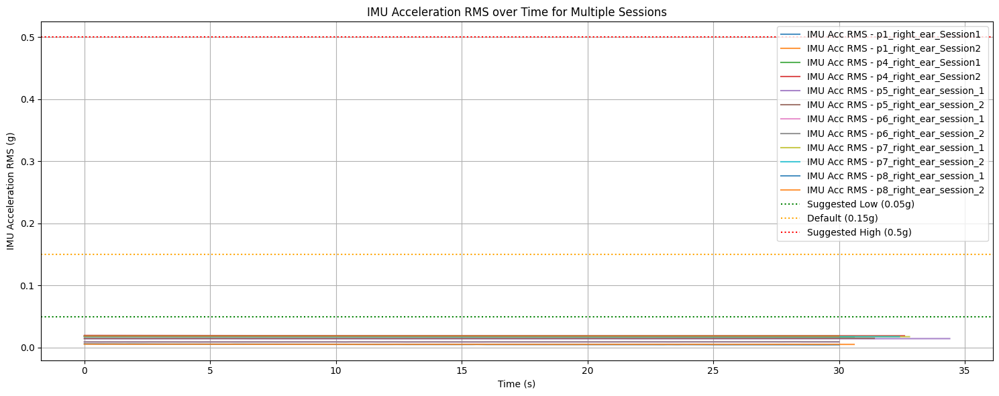


--- Plotting IMU Acceleration RMS with chosen threshold (0.1g) for p1_right_ear_Session1 ---


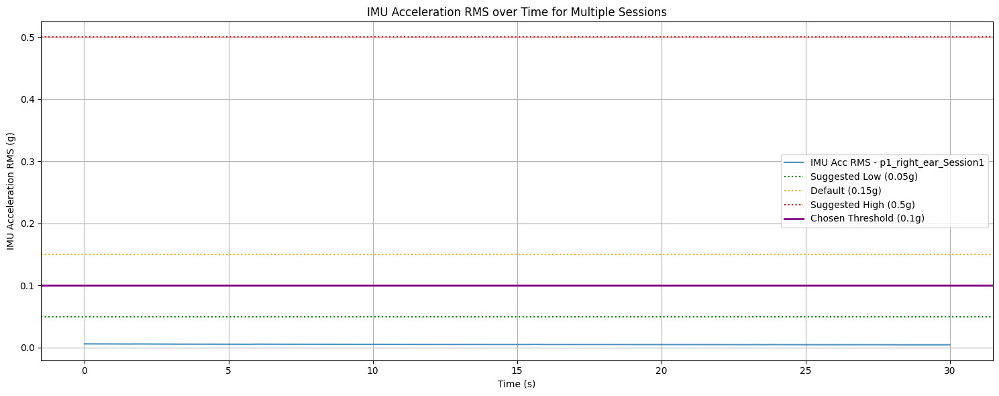


Attempting to plot raw acceleration for validation for session: p1_right_ear_Session1
Found _sensors.csv for validation: trimmed dual csv data/oe data/patient 1 - healthy/right ear/Session1_sensors.csv


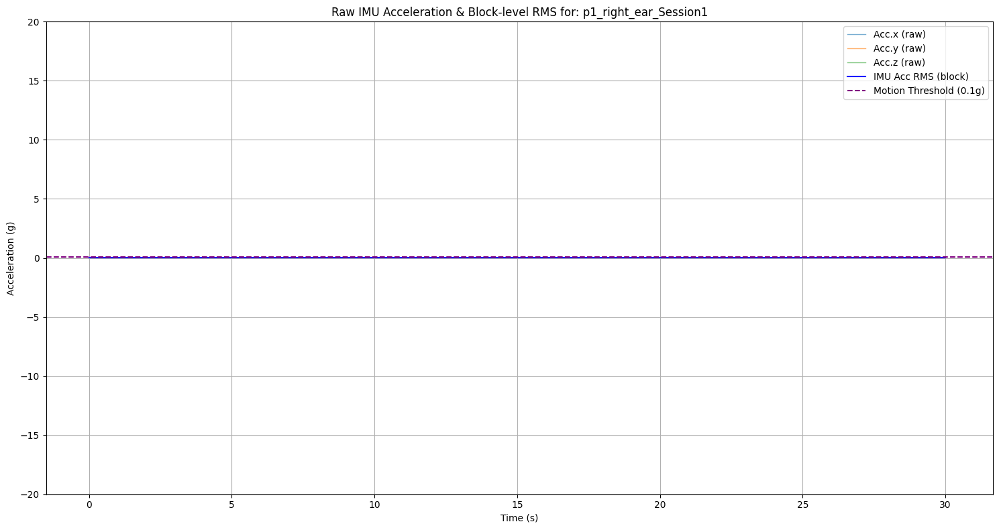

In [23]:
# --- Example Usage ---
print("Available session IDs (from blocks_*.parquet files):")
available_session_ids_from_blocks = get_available_blocks_session_ids(OUTPUT_DIR)

# Load session_features.csv to get valid session_ids
session_features_path = os.path.join(OUTPUT_DIR, "session_features.csv")
if not os.path.exists(session_features_path):
    print(f"Error: session_features.csv not found at '{session_features_path}'. Cannot validate session IDs.")
    available_session_ids = [] # Cannot proceed without session features
else:
    session_features_df = pd.read_csv(session_features_path)
    valid_session_ids_in_features = session_features_df['session_id'].unique().tolist()

    # Filter available_session_ids_from_blocks to only include those present in session_features.csv
    available_session_ids = [sid for sid in available_session_ids_from_blocks if sid in valid_session_ids_in_features]

if not available_session_ids:
    print(f"No processed blocks_*.parquet files found in '{OUTPUT_DIR}' with corresponding entries in 'session_features.csv'. Please ensure 'requirements_main' was run successfully and generated valid data.")
else:
    for sid in available_session_ids:
        print(f"- {sid}")

    # --- NEW: Group sessions by patient and select 2 per patient for Step 1 & 2 ---
    sessions_by_patient = defaultdict(list)
    for sid in available_session_ids:
        # Extract patient ID from session_id (e.g., 'p4_right_ear_Session1' -> '4')
        patient_id_match = re.match(r"p(\d+)_", sid)
        if patient_id_match:
            patient_id = patient_id_match.group(1)
            sessions_by_patient[patient_id].append(sid)

    sessions_to_plot_rms_multi_patient = []
    for patient_id in sorted(sessions_by_patient.keys()):
        # Take up to 2 sessions per patient
        sessions_to_plot_rms_multi_patient.extend(sessions_by_patient[patient_id][:2])

    if sessions_to_plot_rms_multi_patient:
        print(f"\n--- Plotting IMU Acceleration RMS for selected sessions (2 per patient): {', '.join(sessions_to_plot_rms_multi_patient)} ---")
        plot_imu_acc_rms_over_time(sessions_to_plot_rms_multi_patient, OUTPUT_DIR)
    else:
        print("\nNo valid sessions to plot IMU Acceleration RMS for multiple patients.")

    # --- Step 3: Pick a threshold (adjust this value based on visual inspection) ---
    chosen_threshold = 0.10 # Example: User decides 0.10 g is a better threshold

    if available_session_ids:
        example_session_for_threshold_plot = available_session_ids[0]
        print(f"\n--- Plotting IMU Acceleration RMS with chosen threshold ({chosen_threshold}g) for {example_session_for_threshold_plot} ---")
        plot_imu_acc_rms_over_time([example_session_for_threshold_plot], OUTPUT_DIR, current_threshold=chosen_threshold)
    else:
        print("\nNo valid sessions to plot IMU Acceleration RMS with chosen threshold for.")

    # --- Step 4: Validate against raw acceleration for a single session ---
    if available_session_ids:
        example_session_for_raw_plot = available_session_ids[0] # Use one of the sessions
        plot_raw_accel_with_rejected_blocks(example_session_for_raw_plot, OUTPUT_DIR, TRIMMED_DUAL_CSV_DATA_ROOT, chosen_threshold)
    else:
        print("\nNo valid sessions to plot raw acceleration for.")

### MIC_BP LOW & HIGH


Analyzing frequency spectrum for session: p1_right_ear_Session1


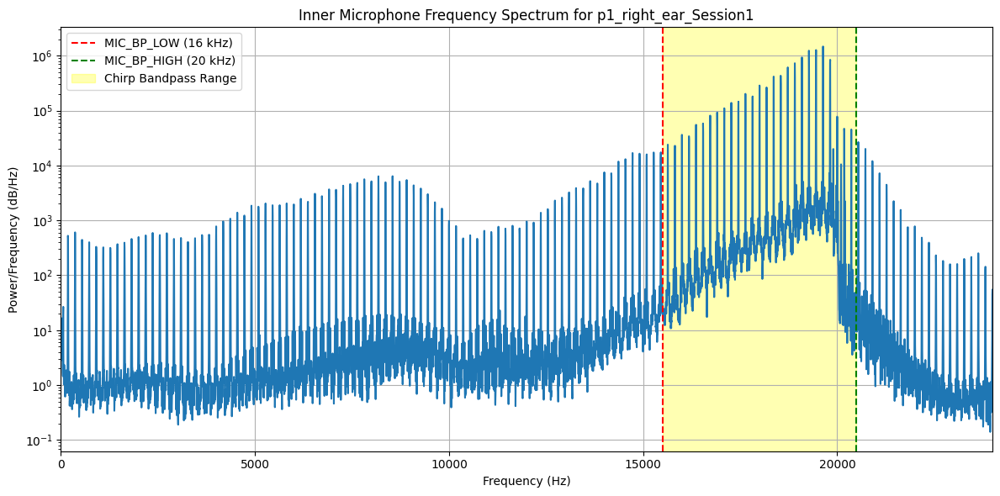


Analyzing frequency spectrum for session: p1_right_ear_Session2


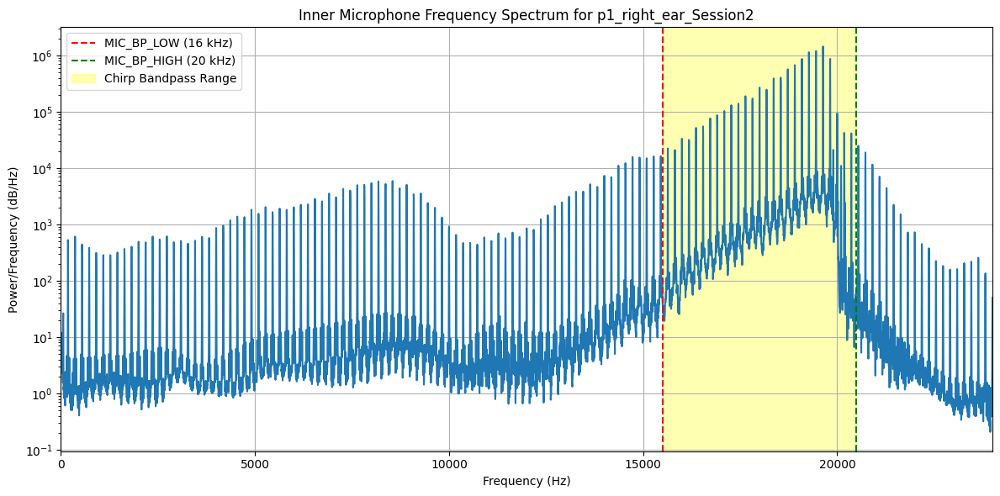


Analyzing frequency spectrum for session: p1_right_ear_Session3


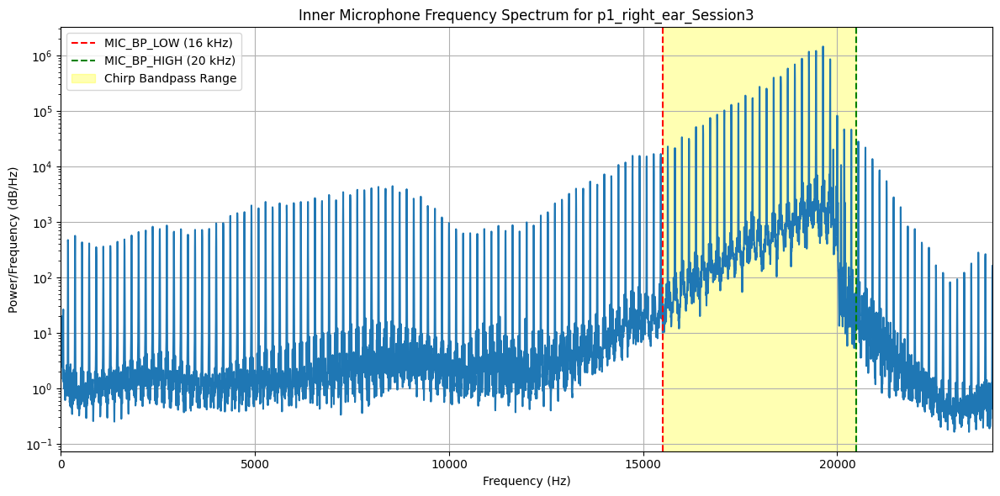


Analyzing frequency spectrum for session: p1_right_ear_Session4


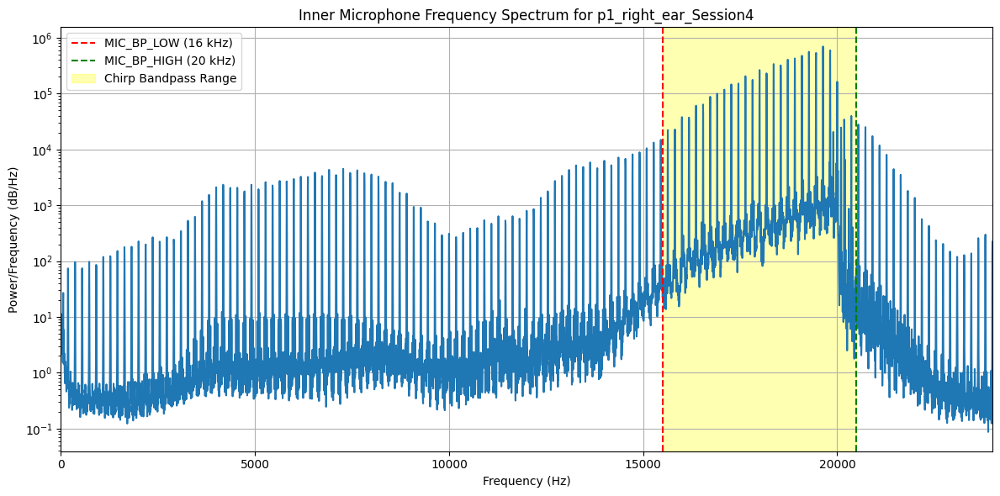


Analyzing frequency spectrum for session: p4_right_ear_Session1


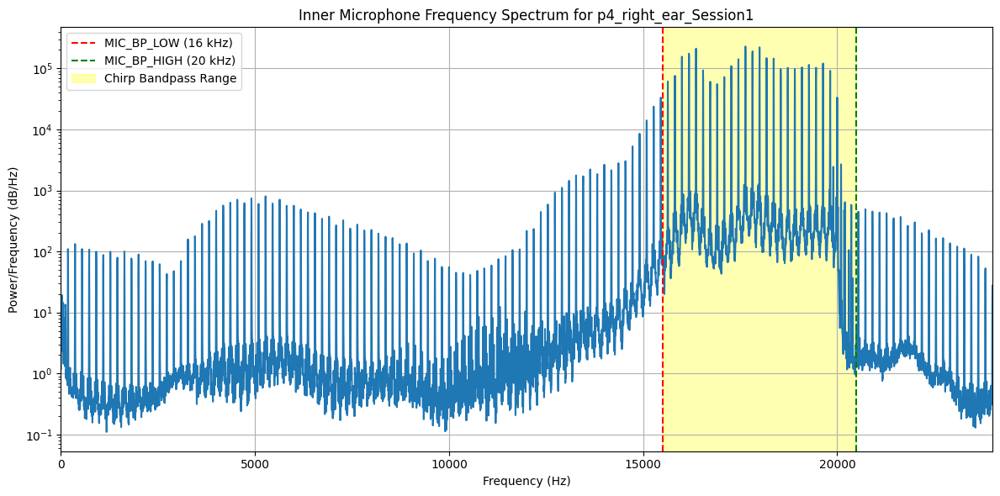


Analyzing frequency spectrum for session: p4_right_ear_Session2


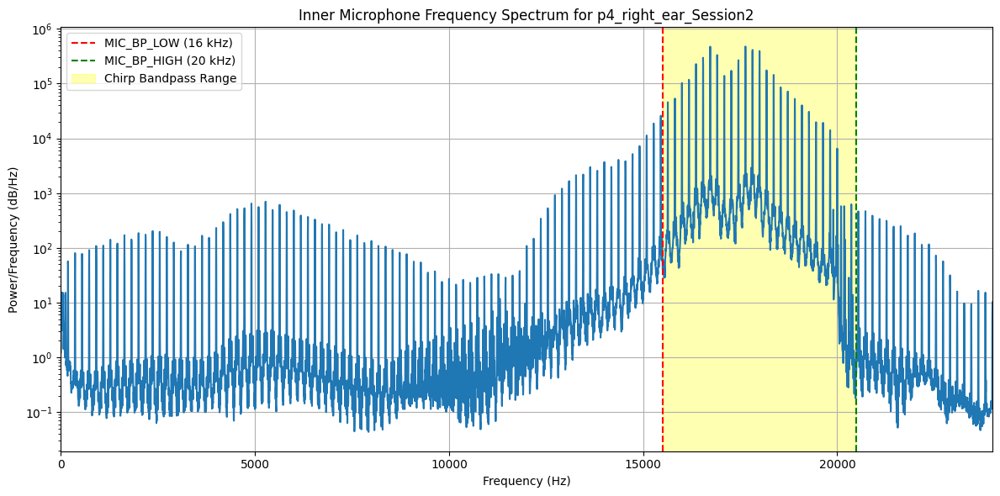


Analyzing frequency spectrum for session: p4_right_ear_Session3


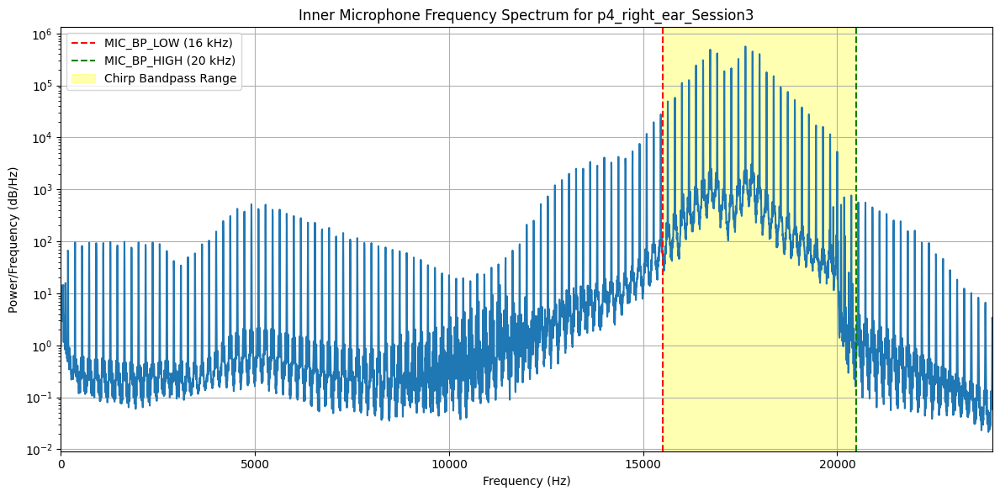


Analyzing frequency spectrum for session: p5_right_ear_session_1


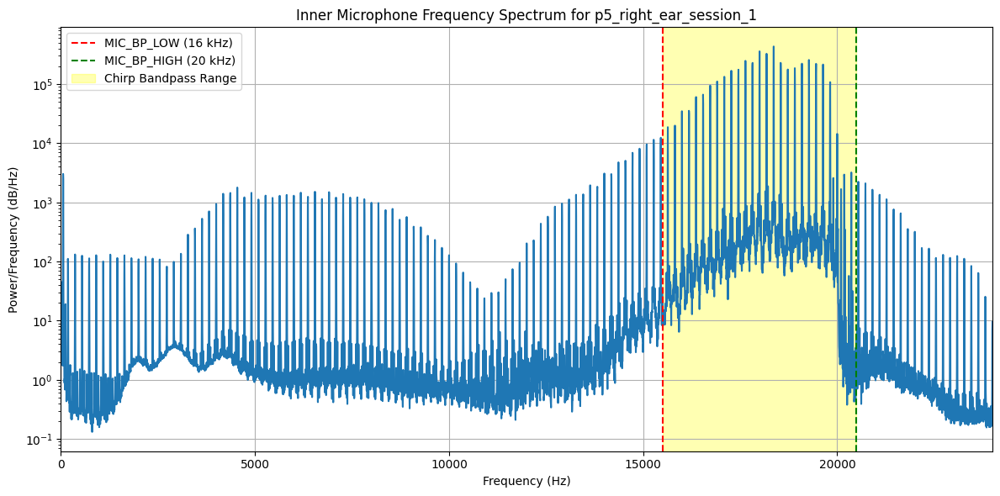


Analyzing frequency spectrum for session: p5_right_ear_session_2


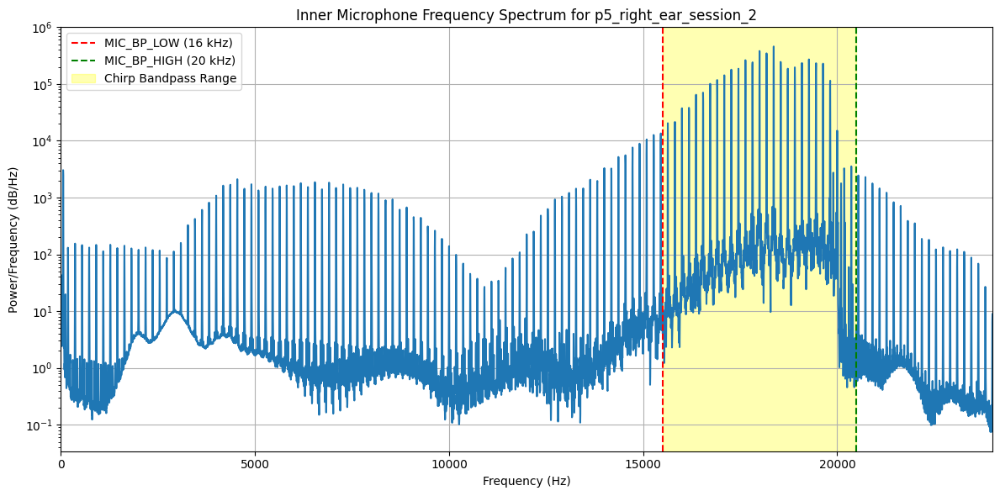


Analyzing frequency spectrum for session: p5_right_ear_session_3


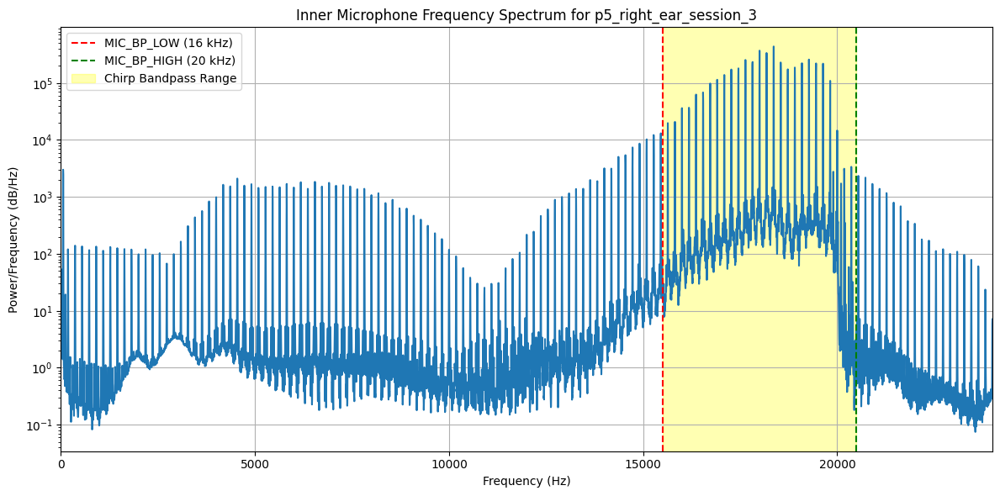


Analyzing frequency spectrum for session: p5_right_ear_session_4


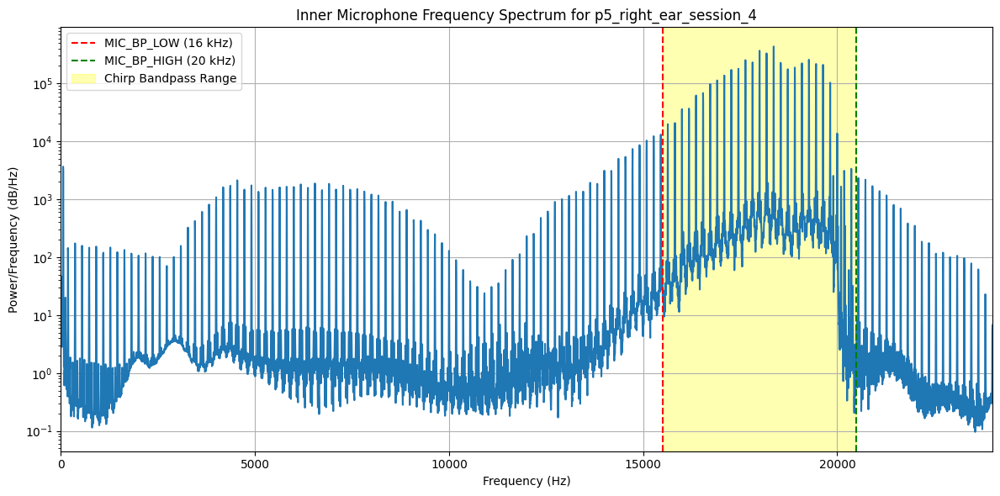


Analyzing frequency spectrum for session: p6_right_ear_session_1


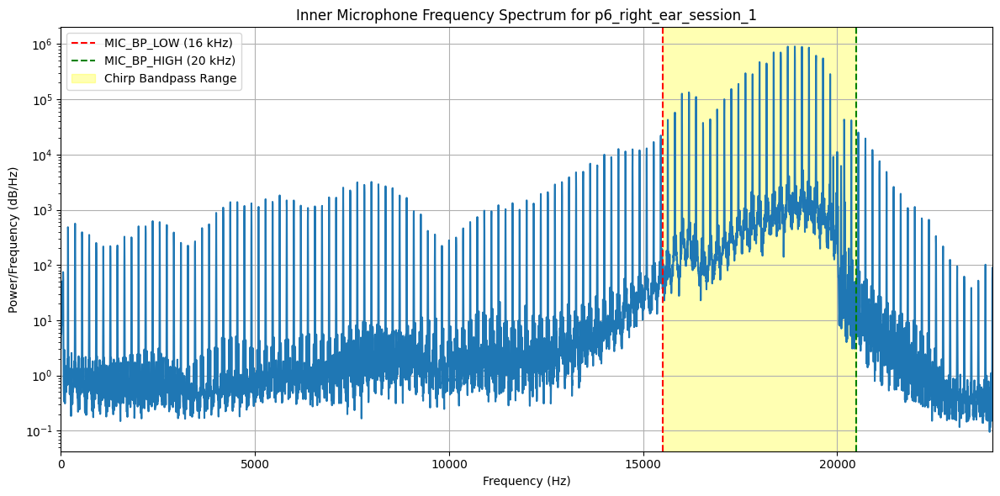


Analyzing frequency spectrum for session: p6_right_ear_session_2


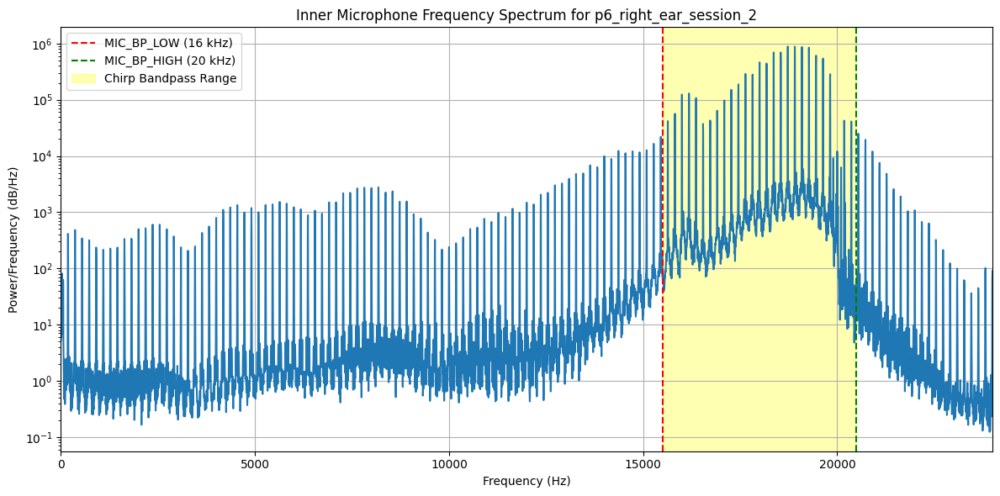


Analyzing frequency spectrum for session: p7_right_ear_session_1


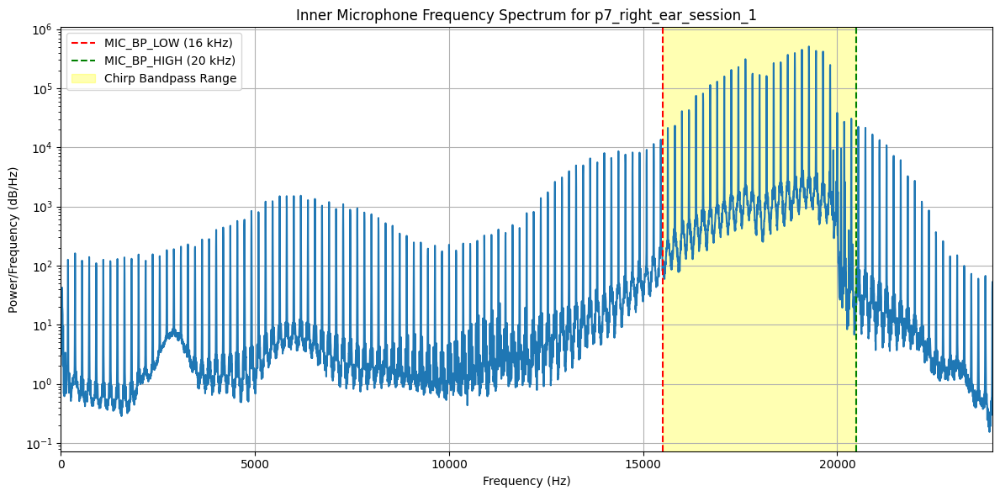


Analyzing frequency spectrum for session: p7_right_ear_session_2


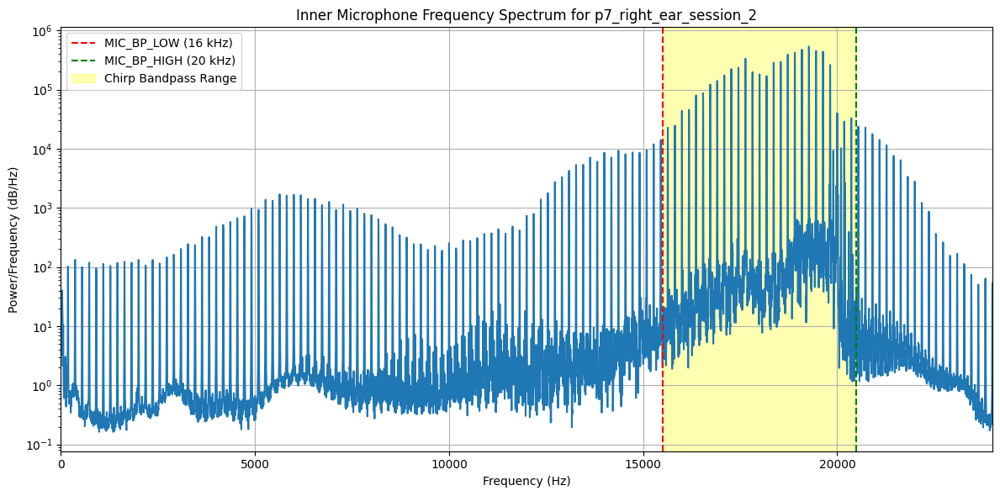


Analyzing frequency spectrum for session: p7_right_ear_session_3


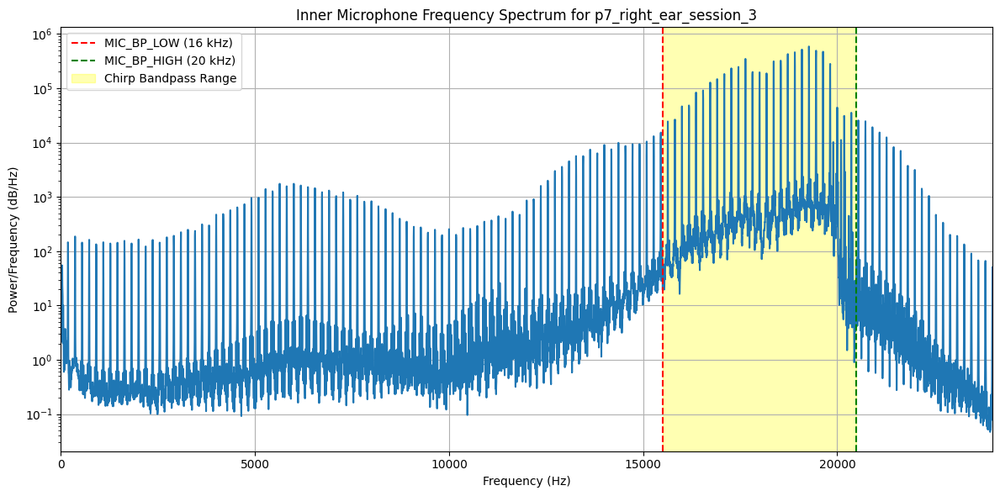


Analyzing frequency spectrum for session: p8_right_ear_session_1


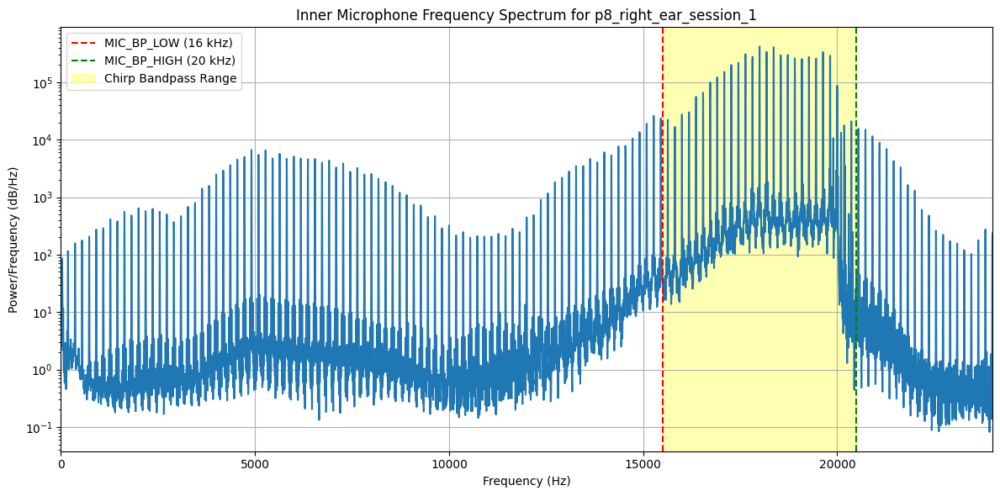


Analyzing frequency spectrum for session: p8_right_ear_session_2


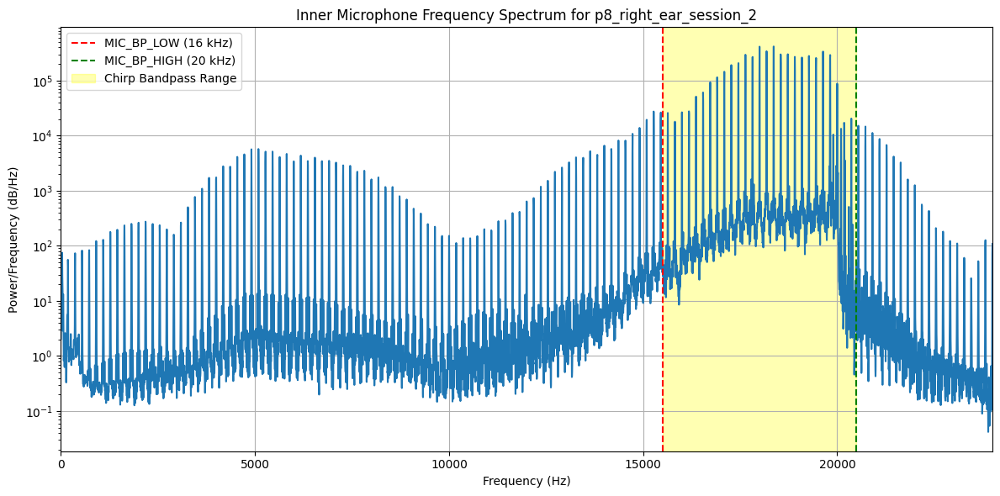

In [24]:
# # Example Usage:
# if available_session_ids:
#     example_session_for_spectrum_plot = available_session_ids[0]
#     plot_mic_frequency_spectrum(
#         example_session_for_spectrum_plot,
#         TRIMMED_DUAL_CSV_DATA_ROOT,
#         MIC_FS,
#         MIC_BP_LOW,
#         MIC_BP_HIGH
#     )
# else:
#     print("No available sessions to plot microphone frequency spectrum.")

# Example Usage:
if available_session_ids:
    for example_session_for_spectrum_plot in available_session_ids:
      plot_mic_frequency_spectrum(
          example_session_for_spectrum_plot,
          TRIMMED_DUAL_CSV_DATA_ROOT,
          MIC_FS,
          MIC_BP_LOW,
          MIC_BP_HIGH
      )
else:
    print("No available sessions to plot microphone frequency spectrum.")

## Saving

In [ ]:
# # name_of_zip_file, format, directory_to_zip
shutil.make_archive(
    'fixed imu rms threshold requirements processed output data', 'zip',
    'requirements processed output data')

# Exploring

In [ ]:
import shutil

# filename, extract_dir
shutil.unpack_archive(
    'requirements processed output data.zip',
    'requirements processed output data')

In [25]:
import pandas as pd

df = pd.read_csv('requirements processed output data/session_features.csv')
df

,patient_dir,ear,session_name,patient_id,condition,session_id,n_valid_blocks,mic_direct_energy__mean,mic_direct_energy__median,mic_direct_energy__std,...,bone_zero_crossing_rate__p10,bone_zero_crossing_rate__p90,bone_zero_crossing_rate__cv,bone_decay_pattern__mean,bone_decay_pattern__median,bone_decay_pattern__std,bone_decay_pattern__iqr,bone_decay_pattern__p10,bone_decay_pattern__p90,bone_decay_pattern__cv
0,patient 6 - osteoporosis,right ear,session 1,6,osteoporosis,p6_right_ear_session_1,151,4.043836e+07,2.446684e+07,8.622472e+07,...,0.044866,0.060241,0.116526,-30.704114,-30.640511,0.719580,0.905811,-31.643885,-29.976054,0.023436
1,patient 6 - osteoporosis,right ear,session 2,6,osteoporosis,p6_right_ear_session_2,151,7.557063e+09,7.726778e+09,7.577630e+08,...,0.045597,0.059295,0.114064,-30.648248,-30.660752,0.708333,0.856270,-31.474712,-29.817367,0.023112
2,patient 1 - healthy,right ear,Session1,1,healthy,p1_right_ear_Session1,151,5.301063e+09,5.347655e+09,4.972550e+08,...,0.042536,0.059477,0.127906,-30.439811,-30.486639,0.977357,1.089755,-31.524437,-29.166300,0.032108
3,patient 1 - healthy,right ear,Session2,1,healthy,p1_right_ear_Session2,154,2.244926e+08,3.738771e+07,8.578141e+08,...,0.042821,0.059479,0.140762,-30.536838,-30.550712,0.935088,1.179907,-31.663073,-29.324977,0.030622
4,patient 1 - healthy,right ear,Session3,1,healthy,p1_right_ear_Session3,151,5.041260e+09,5.078206e+09,4.963133e+08,...,0.044737,0.060821,0.126627,-30.512335,-30.645421,0.909472,1.232848,-31.493124,-29.327113,0.029807
5,patient 1 - healthy,right ear,Session4,1,healthy,p1_right_ear_Session4,151,5.877686e+09,5.883013e+09,5.786981e+08,...,0.039421,0.058544,0.142808,-30.236745,-30.322819,1.012782,1.331594,-31.422629,-28.775853,0.033495
6,patient 8 - osteoporosis,right ear,session 1,8,osteoporosis,p8_right_ear_session_1,151,5.638738e+09,5.738291e+09,6.113781e+08,...,0.044374,0.061563,0.122629,-30.185860,-30.236346,0.887820,1.259668,-31.241245,-29.033101,0.029412
7,patient 8 - osteoporosis,right ear,session 2,8,osteoporosis,p8_right_ear_session_2,151,5.580372e+09,5.618735e+09,4.857369e+08,...,0.045633,0.060726,0.123932,-30.123346,-30.177259,0.866892,0.957253,-31.045569,-29.091641,0.028778
8,patient 5 - healthy,right ear,session 1,5,healthy,p5_right_ear_session_1,173,4.598659e+09,4.976679e+09,1.277228e+09,...,0.043617,0.059959,0.138731,-30.804379,-30.407521,5.458214,0.960883,-31.282267,-29.487496,0.177190
9,patient 5 - healthy,right ear,session 2,5,healthy,p5_right_ear_session_2,158,4.585591e+09,4.859303e+09,1.103684e+09,...,0.043471,0.059069,0.113669,-30.469863,-30.400083,0.802051,1.051658,-31.418281,-29.553405,0.026323


### Helper functions

#### plotting

##### tsne

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
import pandas as pd
from sklearn.preprocessing import StandardScaler # Import StandardScaler

def plot_tsne(data_df: pd.DataFrame, target_column: str, n_components: int = 2, perplexity: int = 5, learning_rate: str = 'auto', n_iter: int = 500, random_state: int = 42):
    """
    Performs t-SNE dimensionality reduction and plots the result.

    Args:
        data_df (pd.DataFrame): The input DataFrame containing features and the target.
        target_column (str): The name of the column to use for coloring the plot.
        n_components (int): The number of dimensions to reduce the data to (2 or 3).
        perplexity (int): The perplexity parameter for t-SNE. Should be between 5 and 50.
        learning_rate (str | float): The learning rate for t-SNE.
        n_iter (int): Maximum number of iterations for the optimization.
        random_state (int): Seed for random number generation for reproducibility.
    """
    if n_components not in [2, 3]:
        raise ValueError("n_components must be 2 or 3 for plotting.")

    # Prepare data: features (X) and target (y)
    # Exclude non-numeric columns and the target column from features
    X = data_df.select_dtypes(include=['number']).drop(columns=[col for col in ['patient_id', 'n_valid_blocks'] if col in data_df.columns], errors='ignore')
    X = X.drop(columns=[col for col in ['mic_cycle_idx__mean', 'mic_cycle_idx__median', 'mic_cycle_idx__std', 'mic_cycle_idx__iqr', 'mic_cycle_idx__p10', 'mic_cycle_idx__p90', 'mic_cycle_idx__cv', 'mic_t_start_ms__mean', 'mic_t_start_ms__median', 'mic_t_start_ms__std', 'mic_t_start_ms__iqr', 'mic_t_start_ms__p10', 'mic_t_start_ms__p90', 'mic_t_start_ms__cv'] if col in X.columns], errors='ignore')


    # Handle NaN values: fill with mean (simple imputation)
    X = X.fillna(X.mean())

    # Normalize the data using StandardScaler to prevent numerical issues
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    y = data_df[target_column]

    print(f"Performing t-SNE with {n_components} components and perplexity={perplexity}...")
    tsne = TSNE(
        n_components=n_components,
        perplexity=perplexity,
        learning_rate=learning_rate,
        n_iter=n_iter,
        random_state=random_state,
        init='pca' # Recommended for consistency
    )

    X_tsne = tsne.fit_transform(X_scaled) # Use scaled data here

    tsne_df = pd.DataFrame(X_tsne, columns=[f'TSNE_Component_{i+1}' for i in range(n_components)])
    tsne_df[target_column] = y.reset_index(drop=True)

    plt.figure(figsize=(10, 8))
    if n_components == 2:
        sns.scatterplot(
            x='TSNE_Component_1',
            y='TSNE_Component_2',
            hue=target_column,
            palette='Dark2',
            data=tsne_df,
            legend='full',
            s=80,
            alpha=0.7
        )
        plt.title(f't-SNE (2 Components) of Session Features by {target_column}')
        plt.xlabel('TSNE Component 1')
        plt.ylabel('TSNE Component 2')
    elif n_components == 3:
        from mpl_toolkits.mplot3d import Axes3D # Import for 3D plotting
        fig = plt.figure(figsize=(12, 10))
        ax = fig.add_subplot(111, projection='3d')
        scatter = ax.scatter(
            tsne_df['TSNE_Component_1'],
            tsne_df['TSNE_Component_2'],
            tsne_df['TSNE_Component_3'],
            c=tsne_df[target_column].astype('category').cat.codes, # Convert to numerical for coloring
            cmap='Accent',
            s=50 + np.abs(tsne_df['TSNE_Component_3']) * 100, # Vary size based on TSNE_Component_3
            alpha=0.7
        )
        ax.set_title(f't-SNE (3 Components) of Session Features by {target_column}')
        ax.set_xlabel('TSNE Component 1')
        ax.set_ylabel('TSNE Component 2')
        ax.set_zlabel('TSNE Component 3')
        # Create a legend with actual class names
        handles, _ = scatter.legend_elements()
        labels = tsne_df[target_column].astype('category').cat.categories.tolist()
        legend1 = ax.legend(handles, labels, title=target_column)
        ax.add_artist(legend1)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

##### pca

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA # Changed from TSNE to PCA
import pandas as pd
from sklearn.preprocessing import StandardScaler # Import StandardScaler

def plot_pca(data_df: pd.DataFrame, target_column: str, n_components: int = 2):
    """
    Performs PCA dimensionality reduction and plots the result.

    Args:
        data_df (pd.DataFrame): The input DataFrame containing features and the target.
        target_column (str): The name of the column to use for coloring the plot.
        n_components (int): The number of dimensions to reduce the data to (2 or 3).
    """
    if n_components not in [2, 3]:
        raise ValueError("n_components must be 2 or 3 for plotting.")

    # Prepare data: features (X) and target (y)
    # Exclude non-numeric columns and the target column from features
    X = data_df.select_dtypes(include=['number']).drop(columns=[col for col in ['patient_id', 'n_valid_blocks'] if col in data_df.columns], errors='ignore')
    X = X.drop(columns=[col for col in ['mic_cycle_idx__mean', 'mic_cycle_idx__median', 'mic_cycle_idx__std', 'mic_cycle_idx__iqr', 'mic_cycle_idx__p10', 'mic_cycle_idx__p90', 'mic_cycle_idx__cv', 'mic_t_start_ms__mean', 'mic_t_start_ms__median', 'mic_t_start_ms__std', 'mic_t_start_ms__iqr', 'mic_t_start_ms__p10', 'mic_t_start_ms__p90', 'mic_t_start_ms__cv'] if col in X.columns], errors='ignore')


    # Handle NaN values: fill with mean (simple imputation)
    X = X.fillna(X.mean())

    # Normalize the data using StandardScaler to prevent numerical issues
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    y = data_df[target_column]

    print(f"Performing PCA with {n_components} components...")
    pca = PCA(n_components=n_components)

    X_pca = pca.fit_transform(X_scaled) # Use scaled data here

    pca_df = pd.DataFrame(X_pca, columns=[f'PC_{i+1}' for i in range(n_components)])
    pca_df[target_column] = y.reset_index(drop=True)

    plt.figure(figsize=(10, 8))
    if n_components == 2:
        sns.scatterplot(
            x='PC_1',
            y='PC_2',
            hue=target_column,
            palette='Dark2',
            data=pca_df,
            legend='full',
            s=80,
            alpha=0.7
        )
        plt.title(f'PCA (2 Components) of Session Features by {target_column}')
        plt.xlabel('Principal Component 1')
        plt.ylabel('Principal Component 2')
    elif n_components == 3:
        from mpl_toolkits.mplot3d import Axes3D # Import for 3D plotting
        fig = plt.figure(figsize=(12, 10))
        ax = fig.add_subplot(111, projection='3d')
        scatter = ax.scatter(
            pca_df['PC_1'],
            pca_df['PC_2'],
            pca_df['PC_3'],
            c=pca_df[target_column].astype('category').cat.codes, # Convert to numerical for coloring
            cmap='Accent',
            s=50 + np.abs(pca_df['PC_3']) * 100, # Vary size based on PC_3
            alpha=0.7
        )
        ax.set_title(f'PCA (3 Components) of Session Features by {target_column}')
        ax.set_xlabel('Principal Component 1')
        ax.set_ylabel('Principal Component 2')
        ax.set_zlabel('Principal Component 3')
        # Create a legend with actual class names
        handles, _ = scatter.legend_elements()
        labels = pca_df[target_column].astype('category').cat.categories.tolist()
        legend1 = ax.legend(handles, labels, title=target_column)
        ax.add_artist(legend1)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

## Visualization

### t-SNE


--- t-SNE with 2 Components ---
Performing t-SNE with 2 components and perplexity=5...


/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


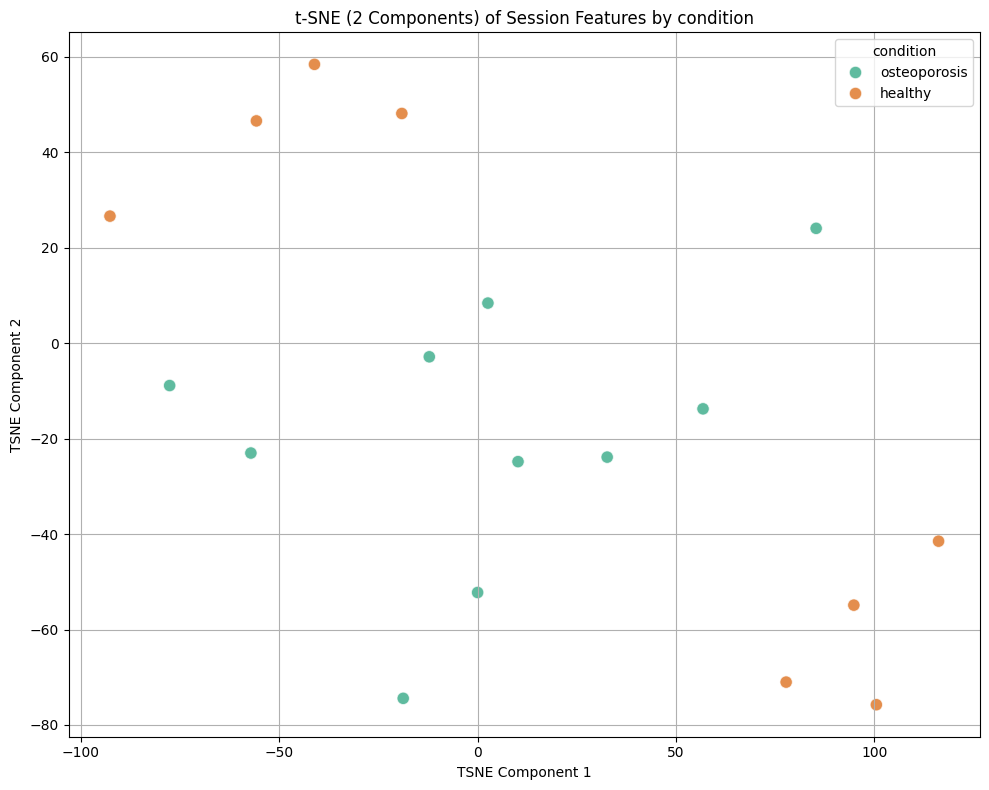

In [26]:


# Assuming 'df' is your DataFrame loaded from 'session_features.csv'
# And it has a 'condition' column

if 'df' in locals():
    print("\n--- t-SNE with 2 Components ---")
    plot_tsne(df, target_column='condition', n_components=2)

    # print("\n--- t-SNE with 3 Components ---")
    # plot_tsne(df, target_column='condition', n_components=3)
else:
    print("DataFrame 'df' not found. Please ensure 'session_features.csv' is loaded into a DataFrame named 'df'.")


--- t-SNE with 3 Components ---
Performing t-SNE with 3 components and perplexity=5...


/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


<Figure size 1000x800 with 0 Axes>

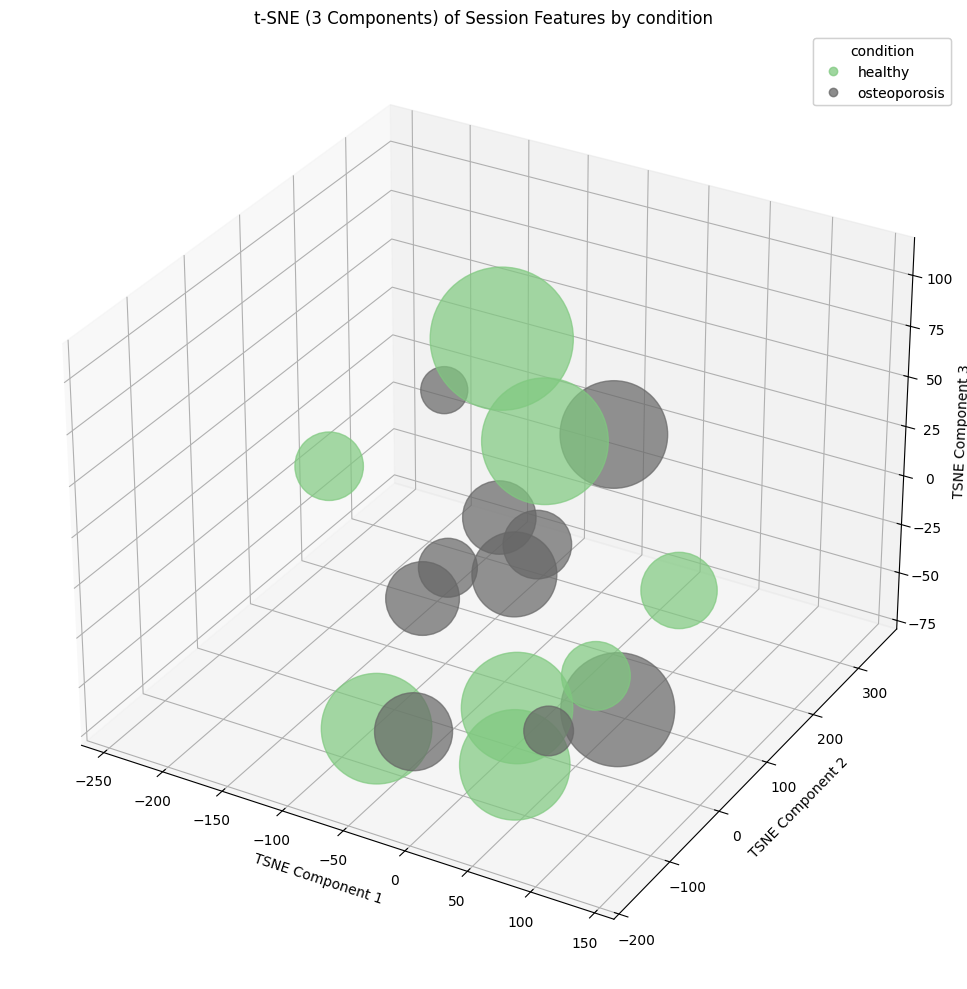

In [34]:


# Assuming 'df' is your DataFrame loaded from 'session_features.csv'
# And it has a 'condition' column

if 'df' in locals():
    # print("\n--- t-SNE with 2 Components ---")
    # plot_tsne(df, target_column='condition', n_components=2)

    print("\n--- t-SNE with 3 Components ---")
    plot_tsne(df, target_column='condition', n_components=3)
else:
    print("DataFrame 'df' not found. Please ensure 'session_features.csv' is loaded into a DataFrame named 'df'.")

### PCA

Performing PCA with 2 components...


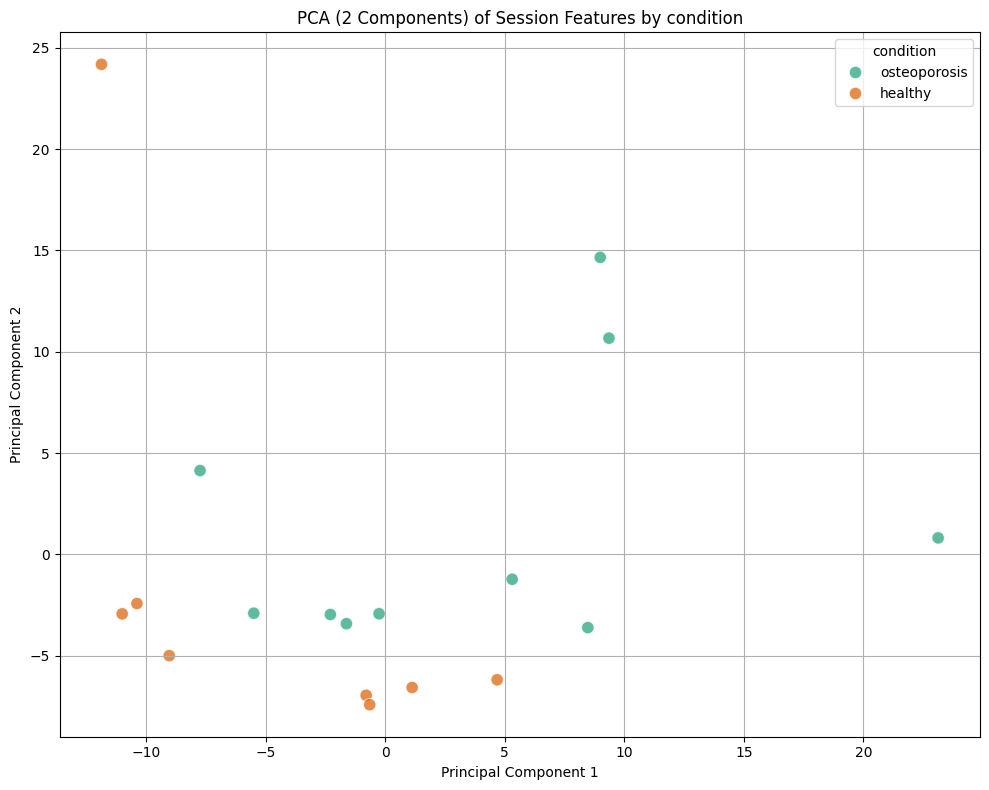

In [31]:
plot_pca(df, target_column='condition', n_components= 2)

Performing PCA with 3 components...


<Figure size 1000x800 with 0 Axes>

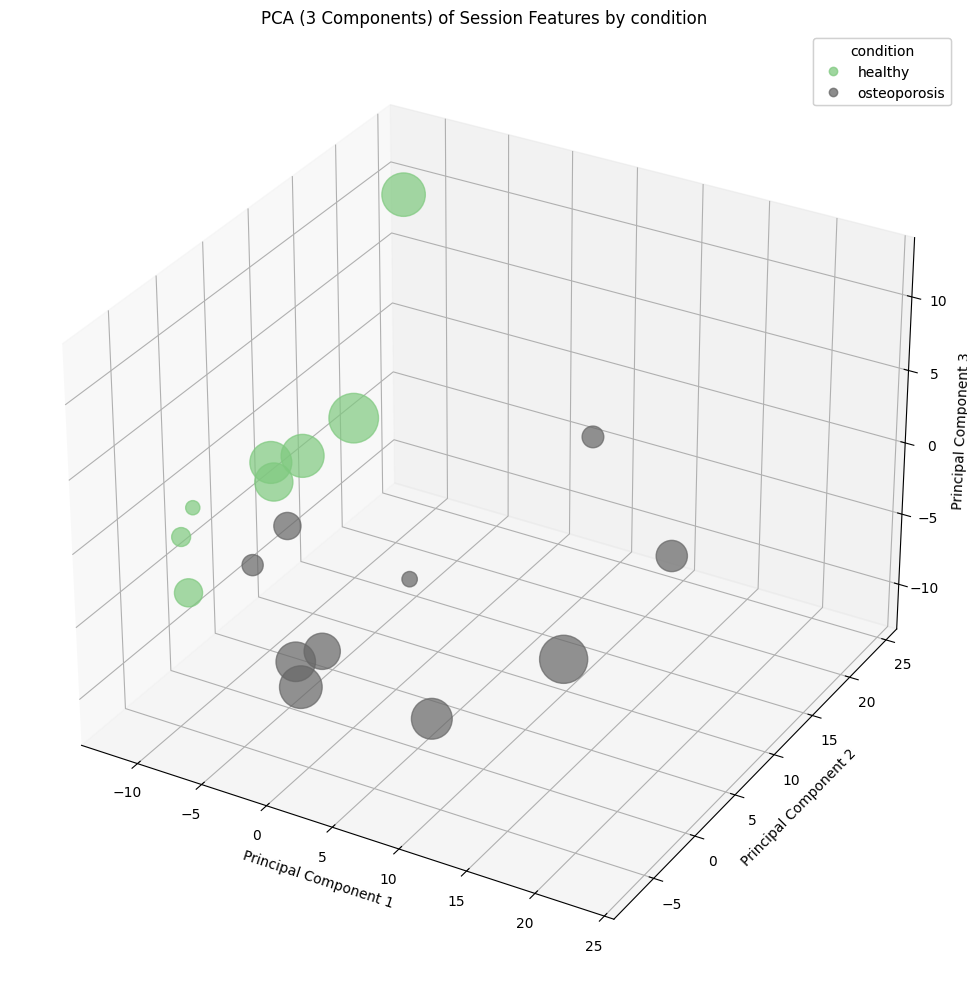

In [32]:
plot_pca(df, target_column='condition', n_components= 3)

# ML Pipeline


## 1) Preprocessing (**important!**)

Change this section's code to suit your specific dataset characteristics

## **what you need to perform:**

  - **define the following variables**:
    - `full_df`: the df to split
    - `patient_id_col`: name of the column containing the patients' IDs (*its values must be integers*)
    - `target_col`: name of the target column
    - *optional* `session_id_col`: name of the column containing sessions IDs OR `None`
  - **encode all categorical columns**: *if any*
  - *optional* **normalize all features**

In [3]:
import shutil

# filename, extract_dir
shutil.unpack_archive('semi final requirements processed output data.zip', 'semi final requirements processed output data')


In [5]:
import pandas as pd
import numpy as np

RANDOM_STATE = 42

data_path = '/content/semi final requirements processed output data/session_features.csv'
df = pd.read_csv(data_path)

print("Original DataFrame head:")
display(df.head())
print("\nUnique patients in original DataFrame:", df['patient_id'].nunique())

cleaned_df = df.drop(columns=[
    'patient_dir', 'ear', 'session_name',
    # 'n_valid_blocks' # need to decide whether or not to keep
    ])

cleaned_df['condition'] = cleaned_df['condition'].map(
    lambda x: 0 if x == 'healthy' else 1)

cleaned_df['session_id'] = cleaned_df['session_id'].map(
    lambda x: x[-1]
)

cleaned_df = cleaned_df.rename(columns={'condition': 'flag'})

# This creates an index array of [0, 2, 1, 3, 4, 5, ... up to the last column]
column_indices = np.r_[0, 2, 1, 3:len(cleaned_df.columns)]

cleaned_df = cleaned_df.iloc[:, column_indices]

display(cleaned_df)

full_df = cleaned_df.copy()

patient_id_col='patient_id'
target_col = 'flag'
session_id_col = 'session_id'

Original DataFrame head:


,patient_dir,ear,session_name,patient_id,condition,session_id,n_valid_blocks,mic_direct_energy__mean,mic_direct_energy__median,mic_direct_energy__std,...,bone_zero_crossing_rate__p10,bone_zero_crossing_rate__p90,bone_zero_crossing_rate__cv,bone_decay_pattern__mean,bone_decay_pattern__median,bone_decay_pattern__std,bone_decay_pattern__iqr,bone_decay_pattern__p10,bone_decay_pattern__p90,bone_decay_pattern__cv
0,patient 6 - osteoporosis,right ear,session 1,6,osteoporosis,p6_right_ear_session_1,151,4.043836e+07,2.446684e+07,8.622472e+07,...,0.044866,0.060241,0.116526,-30.704114,-30.640511,0.719580,0.905811,-31.643885,-29.976054,0.023436
1,patient 6 - osteoporosis,right ear,session 2,6,osteoporosis,p6_right_ear_session_2,151,7.557063e+09,7.726778e+09,7.577630e+08,...,0.045597,0.059295,0.114064,-30.648248,-30.660752,0.708333,0.856270,-31.474712,-29.817367,0.023112
2,patient 1 - healthy,right ear,Session1,1,healthy,p1_right_ear_Session1,151,5.301063e+09,5.347655e+09,4.972550e+08,...,0.042536,0.059477,0.127906,-30.439811,-30.486639,0.977357,1.089755,-31.524437,-29.166300,0.032108
3,patient 1 - healthy,right ear,Session2,1,healthy,p1_right_ear_Session2,154,2.244926e+08,3.738771e+07,8.578141e+08,...,0.042821,0.059479,0.140762,-30.536838,-30.550712,0.935088,1.179907,-31.663073,-29.324977,0.030622
4,patient 1 - healthy,right ear,Session3,1,healthy,p1_right_ear_Session3,151,5.041260e+09,5.078206e+09,4.963133e+08,...,0.044737,0.060821,0.126627,-30.512335,-30.645421,0.909472,1.232848,-31.493124,-29.327113,0.029807



Unique patients in original DataFrame: 6


,patient_id,session_id,flag,n_valid_blocks,mic_direct_energy__mean,mic_direct_energy__median,mic_direct_energy__std,mic_direct_energy__iqr,mic_direct_energy__p10,mic_direct_energy__p90,...,bone_zero_crossing_rate__p10,bone_zero_crossing_rate__p90,bone_zero_crossing_rate__cv,bone_decay_pattern__mean,bone_decay_pattern__median,bone_decay_pattern__std,bone_decay_pattern__iqr,bone_decay_pattern__p10,bone_decay_pattern__p90,bone_decay_pattern__cv
0,6,1,1,151,4.043836e+07,2.446684e+07,8.622472e+07,3.975284e+05,2.418347e+07,2.548980e+07,...,0.044866,0.060241,0.116526,-30.704114,-30.640511,0.719580,0.905811,-31.643885,-29.976054,0.023436
1,6,2,1,151,7.557063e+09,7.726778e+09,7.577630e+08,2.990714e+08,7.424180e+09,7.912143e+09,...,0.045597,0.059295,0.114064,-30.648248,-30.660752,0.708333,0.856270,-31.474712,-29.817367,0.023112
2,1,1,0,151,5.301063e+09,5.347655e+09,4.972550e+08,3.165054e+08,5.069974e+09,5.645021e+09,...,0.042536,0.059477,0.127906,-30.439811,-30.486639,0.977357,1.089755,-31.524437,-29.166300,0.032108
3,1,2,0,154,2.244926e+08,3.738771e+07,8.578141e+08,1.128925e+07,3.673881e+07,3.252263e+08,...,0.042821,0.059479,0.140762,-30.536838,-30.550712,0.935088,1.179907,-31.663073,-29.324977,0.030622
4,1,3,0,151,5.041260e+09,5.078206e+09,4.963133e+08,3.392954e+08,4.872505e+09,5.376085e+09,...,0.044737,0.060821,0.126627,-30.512335,-30.645421,0.909472,1.232848,-31.493124,-29.327113,0.029807
5,1,4,0,151,5.877686e+09,5.883013e+09,5.786981e+08,5.440713e+08,5.480846e+09,6.366996e+09,...,0.039421,0.058544,0.142808,-30.236745,-30.322819,1.012782,1.331594,-31.422629,-28.775853,0.033495
6,8,1,1,151,5.638738e+09,5.738291e+09,6.113781e+08,4.383625e+08,5.378883e+09,6.066850e+09,...,0.044374,0.061563,0.122629,-30.185860,-30.236346,0.887820,1.259668,-31.241245,-29.033101,0.029412
7,8,2,1,151,5.580372e+09,5.618735e+09,4.857369e+08,3.212549e+08,5.362147e+09,5.852510e+09,...,0.045633,0.060726,0.123932,-30.123346,-30.177259,0.866892,0.957253,-31.045569,-29.091641,0.028778
8,5,1,0,173,4.598659e+09,4.976679e+09,1.277228e+09,1.956263e+08,4.539372e+09,5.124645e+09,...,0.043617,0.059959,0.138731,-30.804379,-30.407521,5.458214,0.960883,-31.282267,-29.487496,0.177190
9,5,2,0,158,4.585591e+09,4.859303e+09,1.103684e+09,1.758353e+08,4.671570e+09,4.970739e+09,...,0.043471,0.059069,0.113669,-30.469863,-30.400083,0.802051,1.051658,-31.418281,-29.553405,0.026323


## Splitting

### Helper functions

In [6]:
import pandas as pd
from sklearn.model_selection import train_test_split
import numpy as np

def patient_id_train_test_split(
    df: pd.DataFrame,
    patient_id_col: str,
    test_size: float = 0.2,
    random_state: int = None,
    shuffle: bool = True,
    stratify_col: str = None
) -> tuple[pd.DataFrame, pd.DataFrame]:
    """
    Performs a train-test split on a DataFrame at the patient ID level,
    ensuring all sessions for a given patient are in either the train or test set.
    If stratify_col is provided, it also ensures at least one patient of each category
    is included in the test set.

    Args:
        df (pd.DataFrame): The input DataFrame.
        patient_id_col (str): The name of the column containing patient IDs.
        test_size (float, optional): The proportion of the dataset to include in the test split.
                                     Defaults to 0.2.
        random_state (int, optional): Controls the shuffling applied to the data before applying
                                      the split. Pass an int for reproducible output across
                                      multiple function calls. Defaults to None.
        shuffle (bool, optional): Whether or not to shuffle the data before splitting.
                                  Defaults to True.
        stratify_col (str, optional): If not None, data is split in a stratified fashion,
                                      using this column as the class labels. This ensures
                                      that the proportion of values in the stratify_col
                                      is roughly the same in both train and test sets.
                                      Additionally, it guarantees at least one patient
                                      of each category is in the test set.
                                      Defaults to None.

    Returns:
        tuple[pd.DataFrame, pd.DataFrame]: A tuple containing the training and testing DataFrames.

    Raises:
        ValueError: If `patient_id_col` or `stratify_col` is not found in the DataFrame.
    """
    if patient_id_col not in df.columns:
        raise ValueError(f"Patient ID column '{patient_id_col}' not found in the DataFrame.")

    unique_patient_ids = df[patient_id_col].unique()

    if stratify_col:
        if stratify_col not in df.columns:
            raise ValueError(f"Stratify column '{stratify_col}' not found in the DataFrame.")

        # Map each unique patient ID to its stratify value (using the first session's target)
        # This assumes each patient has a consistent target, or we take the mode/first.
        patient_id_to_stratify_value = df.groupby(patient_id_col)[stratify_col].first()
        stratify_values_for_patients = patient_id_to_stratify_value[unique_patient_ids].values

        # Perform initial train-test split on patient IDs
        train_patient_ids, test_patient_ids = train_test_split(
            unique_patient_ids,
            test_size=test_size,
            random_state=random_state,
            shuffle=shuffle,
            stratify=stratify_values_for_patients
        )

        # Convert to lists for easier manipulation
        train_patient_ids = list(train_patient_ids)
        test_patient_ids = list(test_patient_ids)

        # Ensure all categories are represented in the test set
        all_categories = patient_id_to_stratify_value.unique()

        # Get categories currently present in the test set
        # Handle case where test_patient_ids might be empty initially if test_size is very small and no patients were selected
        if test_patient_ids:
            test_categories_present = set(patient_id_to_stratify_value.loc[test_patient_ids].unique())
        else:
            test_categories_present = set()

        missing_categories = set(all_categories) - test_categories_present

        if missing_categories:
            print(f"Warning: Categories {sorted(list(missing_categories))} were not initially present in the test set. Moving patients to ensure coverage.")
            for category in missing_categories:
                # Find a patient from this category in the training set
                # and move them to the test set
                patient_found = False
                for p_id in list(train_patient_ids): # Iterate over a copy to safely modify original list
                    if patient_id_to_stratify_value.loc[p_id] == category:
                        test_patient_ids.append(p_id)
                        train_patient_ids.remove(p_id)
                        patient_found = True
                        break # Found and moved one patient, move to next missing category
                if not patient_found:
                    print(f"Error: Could not find a patient for category '{category}' in the training set to move to test set. This should not happen if all categories have at least one patient overall.")

        # At this point, train_patient_ids and test_patient_ids are lists.


    else:
        # Original logic without stratification requirement
        train_patient_ids, test_patient_ids = train_test_split(
            unique_patient_ids,
            test_size=test_size,
            random_state=random_state,
            shuffle=shuffle
        )


    # Ensure patient_id_col is hashable for set operations later in verification
    train_patient_ids_final = np.array(train_patient_ids)
    test_patient_ids_final = np.array(test_patient_ids)

    train_df = df[df[patient_id_col].isin(train_patient_ids_final)]
    test_df = df[df[patient_id_col].isin(test_patient_ids_final)]

    return train_df, test_df

### Execution

In [7]:

# Perform the split with the new guarantee
train_df, test_df = patient_id_train_test_split(
    full_df,
    patient_id_col=patient_id_col,
    test_size=0.3,
    random_state=RANDOM_STATE,
    stratify_col=target_col
)

In [42]:

print("\nUnique patients in Train DataFrame:", train_df[patient_id_col].nunique())
print("Unique patients in Test DataFrame:", test_df[patient_id_col].nunique())

# Verify that at least one patient of each category is in the test set
print("\nVerifying at least one patient of each category in test set:")
patient_id_to_stratify_value = full_df.groupby(patient_id_col)[target_col].first()
all_categories = patient_id_to_stratify_value.unique()
test_patient_categories = test_df.groupby(patient_id_col)[target_col].first().unique()

missing_categories_in_test = set(all_categories) - set(test_patient_categories)
if not missing_categories_in_test:
    print(f"All categories {sorted(list(all_categories))} are represented in the test set.")
else:
    print(f"WARNING: Categories {sorted(list(missing_categories_in_test))} are missing from the test set.")


# Verify stratification (approximate for patient-level split)
print("\nTarget distribution in original data (patient-level):\n", patient_id_to_stratify_value.value_counts(normalize=True))
print("\nTarget distribution in train data (patient-level):\n", train_df.groupby('patient_id')[target_col].first().value_counts(normalize=True))
print("\nTarget distribution in test data (patient-level):\n", test_df.groupby('patient_id')[target_col].first().value_counts(normalize=True))


Unique patients in Train DataFrame: 4
Unique patients in Test DataFrame: 2

Verifying at least one patient of each category in test set:
All categories [np.int64(0), np.int64(1)] are represented in the test set.

Target distribution in original data (patient-level):
 flag
1    0.666667
0    0.333333
Name: proportion, dtype: float64

Target distribution in train data (patient-level):
 flag
1    0.75
0    0.25
Name: proportion, dtype: float64

Target distribution in test data (patient-level):
 flag
0    0.5
1    0.5
Name: proportion, dtype: float64


## Normalization

In [8]:
from sklearn.preprocessing import StandardScaler

def apply_normalization(train_df, test_df, metadata_cols):
  normalized_train = train_df.copy()
  normalized_test = test_df.copy()

  # Identify only the feature columns, excluding metadata
  feature_cols_to_normalize = [col for col in train_df.columns if col not in metadata_cols]

  standscaler = StandardScaler()

  normalized_train[feature_cols_to_normalize] = standscaler.fit_transform(normalized_train[feature_cols_to_normalize])
  normalized_test[feature_cols_to_normalize] = standscaler.transform(normalized_test[feature_cols_to_normalize])

  return normalized_train, normalized_test


In [20]:
# Define metadata columns to exclude from processing
metadata_cols = [
    'patient_dir', 'ear', 'session_name', 'patient_id', 'condition', 'flag', 'session_id', 'n_valid_blocks'
]

In [9]:


normalized_train_df, normalized_test_df = apply_normalization(train_df, test_df, metadata_cols)

display(normalized_train_df.head())
display(normalized_test_df.head())

,patient_id,session_id,flag,n_valid_blocks,mic_direct_energy__mean,mic_direct_energy__median,mic_direct_energy__std,mic_direct_energy__iqr,mic_direct_energy__p10,mic_direct_energy__p90,...,bone_zero_crossing_rate__p10,bone_zero_crossing_rate__p90,bone_zero_crossing_rate__cv,bone_decay_pattern__mean,bone_decay_pattern__median,bone_decay_pattern__std,bone_decay_pattern__iqr,bone_decay_pattern__p10,bone_decay_pattern__p90,bone_decay_pattern__cv
0,6,1,1,151,-2.143014,-1.975869,-1.630048,-1.809707,-1.949373,-2.784479,...,-0.268834,-0.239987,-0.417237,-1.219950,-1.458578,-0.398261,-0.993823,-1.595831,-1.990790,-0.405415
1,6,2,1,151,1.427248,1.313292,-0.451166,0.480850,1.369969,1.331575,...,0.253247,-1.284131,-0.665593,-0.977128,-1.572143,-0.406695,-1.474795,-0.748223,-1.400662,-0.412923
6,8,1,1,151,0.516078,0.464137,-0.708144,1.549086,0.452531,0.368514,...,-0.620297,1.218783,0.198647,1.032643,0.809085,-0.272096,2.441599,0.421517,1.515877,-0.267043
7,8,2,1,151,0.488356,0.413083,-0.928707,0.650978,0.445024,0.256650,...,0.278861,0.294823,0.330091,1.304358,1.140606,-0.287790,-0.494401,1.401912,1.298177,-0.281716
8,5,1,0,173,0.022059,0.138902,0.460753,-0.312480,0.075960,-0.123224,...,-1.161063,-0.551570,1.823407,-1.655752,-0.151335,3.155280,-0.459160,0.215985,-0.173935,3.154789


,patient_id,session_id,flag,n_valid_blocks,mic_direct_energy__mean,mic_direct_energy__median,mic_direct_energy__std,mic_direct_energy__iqr,mic_direct_energy__p10,mic_direct_energy__p90,...,bone_zero_crossing_rate__p10,bone_zero_crossing_rate__p90,bone_zero_crossing_rate__cv,bone_decay_pattern__mean,bone_decay_pattern__median,bone_decay_pattern__std,bone_decay_pattern__iqr,bone_decay_pattern__p10,bone_decay_pattern__p90,bone_decay_pattern__cv
2,1,1,0,151,0.355689,0.297322,-0.908487,0.614553,0.313967,0.148362,...,-1.932527,-1.083562,0.731116,-0.071156,-0.595244,-0.204952,0.791993,-0.997360,1.020534,-0.204615
3,1,2,0,154,-2.055591,-1.970351,-0.275527,-1.726177,-1.943741,-2.628046,...,-1.728861,-1.080736,2.028260,-0.492883,-0.954743,-0.236650,1.667235,-1.691967,0.430443,-0.239029
4,1,3,0,151,0.232287,0.182258,-0.910140,0.789332,0.225390,0.008003,...,-0.361239,0.400699,0.602023,-0.386382,-1.486127,-0.255859,2.181214,-0.840470,0.422502,-0.257898
5,1,4,0,151,0.629574,0.525939,-0.765514,2.359777,0.498268,0.525161,...,-4.156850,-2.112487,2.234800,0.811471,0.323908,-0.178386,3.139886,-0.487268,2.472532,-0.172493
15,4,1,1,154,-2.150243,-1.985656,-1.523356,-1.811616,-1.959592,-2.777046,...,-1.166891,0.114116,3.366888,1.617256,1.694513,-0.095525,2.001172,1.311724,2.408312,-0.082570


## Feature Selection

### Helper functions

##### Laplacian

In [4]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

# Laplacian score
laplacian_k: int = 5
top_k_features: int = 25

def get_feature_columns(dataframe: pd.DataFrame, exclude_cols: list) -> list:
    """
    Identifies all numeric columns in a DataFrame, excluding specified columns.
    It also filters out columns with zero variance.
    """
    numeric_cols = dataframe.select_dtypes(include=np.number).columns.tolist()
    feature_cols = [col for col in numeric_cols if col not in exclude_cols]

    # Filter out features with zero variance
    non_zero_variance_features = []
    for col in feature_cols:
        if dataframe[col].nunique() > 1: # Check if column has more than one unique value
            non_zero_variance_features.append(col)

    return non_zero_variance_features

def laplacian_score(
    X: np.ndarray,
    k: int = 5,
    standardize: bool = True,
) -> np.ndarray:
    X = np.asarray(X, dtype=np.float64)
    if standardize:
        X = StandardScaler().fit_transform(X)

    n_samples, n_features = X.shape
    k = min(k, max(1, n_samples - 1))

    nbrs = NearestNeighbors(n_neighbors=k + 1, metric="euclidean")
    nbrs.fit(X)
    _, indices = nbrs.kneighbors(X)

    W = np.zeros((n_samples, n_samples), dtype=np.float64)
    for i in range(n_samples):
        for j in indices[i, 1:]:
            W[i, j] = 1.0
            W[j, i] = 1.0

    D = np.diag(W.sum(axis=1))
    L = D - W
    d = np.diag(D)
    d_sum = np.sum(d)
    eps = 1e-12

    scores = np.zeros(n_features, dtype=np.float64)
    for f_idx in range(n_features):
        f = X[:, f_idx]
        weighted_mean = float(np.dot(d, f) / (d_sum + eps))
        f_centered = f - weighted_mean
        numerator = float(f_centered.T @ L @ f_centered)
        denominator = float(f_centered.T @ D @ f_centered)
        scores[f_idx] = numerator / (denominator + eps)

    return scores

##### PCA

In [24]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np

def get_pca_variance_ratio_table(df: pd.DataFrame, feature_cols: list, max_components: int = 25) -> pd.DataFrame:
    """
    Calculates the cumulative explained variance ratio for PCA applied to a DataFrame
    for a range of components.

    Args:
        df (pd.DataFrame): The input DataFrame containing the features.
        feature_cols (list): A list of column names in `df` to be used as features for PCA.
        max_components (int): The maximum number of principal components to consider.
                              Defaults to 25, which is the number of selected features.

    Returns:
        pd.DataFrame: A DataFrame with 'Num Components' and 'Cumulative Explained Variance Ratio'.
    """
    if not feature_cols:
        print("No feature columns provided for PCA.")
        return pd.DataFrame()

    # Prepare the data
    X = df[feature_cols].copy()

    # Handle NaN values: fill with mean (simple imputation)
    X = X.fillna(X.mean())

    # Normalize the data using StandardScaler
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    results = []
    # Ensure max_components does not exceed the number of features or samples
    n_features = X_scaled.shape[1]
    n_samples = X_scaled.shape[0]
    max_possible_components = min(n_features, n_samples)
    effective_max_components = min(max_components, max_possible_components)

    if effective_max_components == 0:
        print("Not enough features or samples to perform PCA.")
        return pd.DataFrame()

    for n_comp in range(1, effective_max_components + 1):
        pca = PCA(n_components=n_comp)
        pca.fit(X_scaled)
        cumulative_variance = np.sum(pca.explained_variance_ratio_)
        results.append({
            'Num Components': n_comp,
            'Cumulative Explained Variance Ratio': cumulative_variance
        })

    return pd.DataFrame(results)


##### corr

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# 1. Grab the "Blues" gradient from Matplotlib
# We sample 128 colors for each side to make a smooth 256-color map
blues_base = plt.cm.get_cmap('magma_r', 128)(np.linspace(0, 1, 128)) # Dark Blue -> White
blues_right = plt.cm.get_cmap('magma', 128)(np.linspace(0, 1, 128))  # White -> Dark Blue

# 2. Combine them: -1 is Dark Blue, 0 is White, +1 is Dark Blue
folded_colors = np.vstack((blues_base, blues_right))
symmetric_blues = mcolors.LinearSegmentedColormap.from_list('SymmetricBlues', folded_colors)

def plot_correlation_heatmap(df: pd.DataFrame, metadata_cols: list):
    """
    Generates and displays a correlation heatmap for features in a DataFrame,
    excluding specified metadata columns.

    Args:
        df (pd.DataFrame): The input DataFrame containing features and metadata.
        metadata_cols (list): A list of column names to be excluded from the correlation analysis.
    """
    if df.empty:
        print("Input DataFrame is empty. Cannot generate correlation plot.")
        return

    # Get only the feature columns by excluding metadata
    feature_columns = [col for col in df.columns if col not in metadata_cols]

    if len(feature_columns) == 0:
        print("No feature columns found after excluding metadata. Cannot generate correlation plot.")
        return

    # Compute the correlation matrix
    correlation_matrix = df[feature_columns].corr()

    # Plot the heatmap
    plt.figure(figsize=(15, 12))
    sns.heatmap(correlation_matrix, annot=True, cmap=symmetric_blues, fmt=".2f", linewidths=.5)
    plt.title('Correlation Matrix of Normalized Selected Features (Excluding Metadata)')
    plt.savefig('correlation_matrix.png', bbox_inches='tight')
    plt.show()

/tmp/ipykernel_3181/237372488.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  blues_base = plt.cm.get_cmap('magma_r', 128)(np.linspace(0, 1, 128)) # Dark Blue -> White
/tmp/ipykernel_3181/237372488.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  blues_right = plt.cm.get_cmap('magma', 128)(np.linspace(0, 1, 128))  # White -> Dark Blue


##### visualization

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

def plot_feature_distributions(df_to_plot: pd.DataFrame, selected_features: list):
    """
    Plots the distribution of selected features by condition using KDE plots.

    Args:
        df_to_plot (pd.DataFrame): The DataFrame containing the features and 'condition' column.
        selected_features (list): A list of feature column names to plot.
    """
    if df_to_plot.empty or not selected_features or 'flag' not in df_to_plot.columns:
        print("DataFrame is empty, no features selected, or 'flag' column is missing. Cannot plot features.")
        return

    num_features = len(selected_features)
    if num_features == 0:
        print("No features selected to plot.")
        return

    grid_size = int(np.ceil(np.sqrt(num_features)))

    fig, axes = plt.subplots(grid_size, grid_size, figsize=(20, 20), constrained_layout=False)
    axes = axes.flatten()

    # Use 'flag' instead of 'condition' if 'flag' exists, otherwise default to 'condition'
    hue_col = 'flag' if 'flag' in df_to_plot.columns else 'condition'

    # Define specific labels and colors for the 'flag' column
    if hue_col == 'flag':
        condition_label_map = {0: 'Healthy', 1: 'Osteoporosis'}
        specific_colors = {0: 'green', 1: 'red'}
        # Map the 'flag' column to string labels for plotting
        df_to_plot_mapped = df_to_plot.copy()
        df_to_plot_mapped[hue_col] = df_to_plot_mapped[hue_col].map(condition_label_map)
        # Use the mapped dataframe and specific colors
        plot_df = df_to_plot_mapped
        palette_colors = [specific_colors[cond_val] for cond_val in sorted(df_to_plot[hue_col].unique())]
        hue_order = [condition_label_map[cond_val] for cond_val in sorted(df_to_plot[hue_col].unique())]
    else:
        unique_conditions = df_to_plot[hue_col].unique()
        palette_colors = sns.color_palette('viridis', n_colors=len(unique_conditions))
        hue_order = sorted(unique_conditions)
        plot_df = df_to_plot

    # Create a dictionary for legend mapping based on hue_order and palette_colors
    legend_color_map = dict(zip(hue_order, palette_colors))

    for i, feature in enumerate(selected_features):
        if i < len(axes):
            ax = axes[i]
            sns.kdeplot(
                data=plot_df,
                x=feature,
                hue=hue_col,
                fill=True,
                alpha=0.6,
                linewidth=1.5,
                ax=ax,
                palette=palette_colors,
                hue_order=hue_order,
                legend=False
            )
            ax.set_title(feature.replace('_', ' ').replace('__', ' '), fontsize=12)
            ax.set_xlabel('')
            ax.set_ylabel('')
            ax.tick_params(axis='both', which='major', labelsize=8)
            ax.grid(True, linestyle='--', alpha=0.7)

    dummy_patches = []
    for label, color in legend_color_map.items():
        dummy_patches.append(plt.Line2D([0], [0], color=color, lw=4, label=label))

    # Legend title should be 'Condition' if hue_col is 'flag'
    legend_title = 'Condition' if hue_col == 'flag' else hue_col.capitalize()
    fig.legend(handles=dummy_patches, title=legend_title, loc='upper right', bbox_to_anchor=(1.05, 0.95), fontsize=10, title_fontsize=12)

    fig.suptitle('Distribution of Selected Features by Condition', fontsize=18, y=1.02)
    plt.tight_layout(rect=[0, 0.03, 0.9, 0.95])

    for j in range(num_features, len(axes)):
        fig.delaxes(axes[j])

    plt.savefig('distribution_of_selected_features_by_condition.png', bbox_inches='tight')
    plt.show()

### Laplacian Score feature selection

The Laplacian Score is computed in an unsupervised way, as in the paper. Lower score means more locally structure-preserving. The code ranks the 238 features and keeps the top 25 by default.


In [51]:
# Define Laplacian score parameters
laplacian_k: int = 5
top_k_features: int = 25


# Dynamically get feature columns from the DataFrame, excluding those with zero variance
feature_cols = get_feature_columns(normalized_train_df, metadata_cols)

# Check if any feature columns remain after filtering
if not feature_cols:
    print("No valid feature columns found after excluding metadata and zero-variance columns.")
else:
    X = normalized_train_df[feature_cols].to_numpy(dtype=np.float64)

    scores = laplacian_score(X, k=laplacian_k, standardize=False)
    ranking_df = pd.DataFrame(
        {
            "feature": feature_cols,
            "laplacian_score": scores,
        }
    ).sort_values("laplacian_score", ascending=True, ignore_index=True)

    display(ranking_df)

,feature,laplacian_score
0,bone_decay_pattern__p90,0.715706
1,imu_acc_rms__median,0.755221
2,imu_acc_rms__p10,0.755692
3,imu_acc_rms__mean,0.755920
4,imu_acc_rms__p90,0.757383
...,...,...
351,mic_direct_peak_time__p10,1.186289
352,mic_echo_peak_delay_ms__cv,1.199240
353,mic_echo_resonance_frequency__iqr,1.200714
354,mic_echo_energy__cv,1.204957


**selected features:**

['bone_decay_pattern__p90', 'imu_acc_rms__median', 'imu_acc_rms__p10', 'imu_acc_rms__mean', 'imu_acc_rms__p90', 'imu_motion_score__mean', 'bone_entropy__mean', 'bone_entropy__median', 'bone_decay_pattern__median', 'imu_motion_score__p90', 'bone_spectral_centroid__mean', 'imu_acc_rms__cv', 'bone_spectral_centroid__p90', 'bone_entropy__p90', 'imu_motion_score__median', 'mic_echo_decay_slope__p90', 'bone_peak_amplitude__std', 'bone_spectral_bandwidth__mean', 'mic_echo_snr_db__p10', 'bone_entropy__p10', 'bone_peak_amplitude__cv', 'mic_paper_mfcc_9__p90', 'bone_spectral_bandwidth__median', 'mic_paper_mfcc_9__mean', 'imu_jerk__std']


In [7]:
if 'ranking_df' in locals() and not ranking_df.empty:
    top_k = min(top_k_features, len(ranking_df))
    selected_features = ranking_df.head(top_k)["feature"].tolist()

print("Selected features:", selected_features)

Selected features: ['bone_decay_pattern__p90', 'imu_acc_rms__median', 'imu_acc_rms__p10', 'imu_acc_rms__mean', 'imu_acc_rms__p90', 'imu_motion_score__mean', 'bone_entropy__mean', 'bone_entropy__median', 'bone_decay_pattern__median', 'imu_motion_score__p90', 'bone_spectral_centroid__mean', 'imu_acc_rms__cv', 'bone_spectral_centroid__p90', 'bone_entropy__p90', 'imu_motion_score__median', 'mic_echo_decay_slope__p90', 'bone_peak_amplitude__std', 'bone_spectral_bandwidth__mean', 'mic_echo_snr_db__p10', 'bone_entropy__p10', 'bone_peak_amplitude__cv', 'mic_paper_mfcc_9__p90', 'bone_spectral_bandwidth__median', 'mic_paper_mfcc_9__mean', 'imu_jerk__std']


In [55]:

# Create a new DataFrame with selected features and relevant metadata
# Ensure all metadata columns exist in df before concatenating
existing_metadata_for_selection = [col for col in ['patient_dir', 'patient_id', 'condition', 'flag', 'ear', 'session_name', 'session_id'] if col in normalized_train_df.columns]

selected_feat_train_df = normalized_train_df[
    existing_metadata_for_selection + selected_features
].copy()

display(selected_feat_train_df)

selected_feat_test_df = normalized_test_df[
    existing_metadata_for_selection + selected_features
].copy()


display(selected_feat_test_df)

,patient_id,flag,session_id,bone_decay_pattern__p90,imu_acc_rms__median,imu_acc_rms__p10,imu_acc_rms__mean,imu_acc_rms__p90,imu_motion_score__mean,bone_entropy__mean,...,mic_echo_decay_slope__p90,bone_peak_amplitude__std,bone_spectral_bandwidth__mean,mic_echo_snr_db__p10,bone_entropy__p10,bone_peak_amplitude__cv,mic_paper_mfcc_9__p90,bone_spectral_bandwidth__median,mic_paper_mfcc_9__mean,imu_jerk__std
0,6,1,1,-1.990790,-1.832333,-1.829879,-1.835499,-1.846185,-1.314293,-1.084537,...,-2.438868,-0.909956,-1.068122,1.985687,-1.057869,-0.932765,-1.277783,-1.143492,-1.160385,-1.236213
1,6,1,2,-1.400662,-1.820020,-1.816815,-1.819555,-1.822038,-1.270019,-1.167892,...,-0.295643,-1.257088,-1.039294,2.097102,-1.117777,-1.288861,-0.668890,-0.782515,-0.525375,-1.236075
6,8,1,1,1.515877,1.091683,1.096463,1.090498,1.082680,1.187027,0.544700,...,1.440688,0.958839,1.027309,-0.925996,1.324671,0.936312,1.644213,1.071399,1.635017,0.372499
7,8,1,2,1.298177,1.081028,1.081536,1.078529,1.072436,2.106143,0.549453,...,1.380633,1.334256,0.765319,-1.011671,0.889483,1.327624,1.550937,0.729179,1.402443,2.355744
8,5,0,1,-0.173935,-0.236829,-0.235950,-0.237871,-0.243366,-0.531320,0.603854,...,-0.241212,-0.275016,-0.464796,-0.194775,-1.354013,-0.208642,-0.693351,-0.686507,-0.775366,-0.371774
9,5,0,2,-0.419035,-0.134700,-0.131787,-0.130547,-0.122325,-0.650888,-0.674131,...,-0.373418,-0.158054,-1.026924,-0.216031,-0.161648,-0.098043,-0.705140,-0.944301,-0.622687,-0.783363
10,5,0,3,-0.343454,-0.227221,-0.233544,-0.222327,-0.202370,-0.447537,-1.121942,...,-0.349786,-1.161541,-1.028296,-0.185106,-0.794559,-1.133855,-0.839420,-1.239653,-1.057425,-0.312889
11,5,0,4,0.088673,-0.237248,-0.246958,-0.238887,-0.230404,-0.480372,-0.889680,...,-0.374143,-0.028159,-0.736837,-0.227087,-0.657051,0.038949,-0.877069,-0.533719,-0.990307,0.333886
12,7,1,1,0.478175,0.776615,0.782218,0.778734,0.779093,0.506926,2.072208,...,0.402228,-0.179468,1.251466,-0.312536,0.812974,-0.237506,0.482431,1.275698,0.605876,-0.046069
13,7,1,2,0.677273,0.761904,0.749108,0.760190,0.766699,0.549449,0.672632,...,0.414759,2.063757,1.092250,-0.488809,1.421091,2.054968,0.401676,0.971336,0.448212,1.119818


,patient_id,flag,session_id,bone_decay_pattern__p90,imu_acc_rms__median,imu_acc_rms__p10,imu_acc_rms__mean,imu_acc_rms__p90,imu_motion_score__mean,bone_entropy__mean,...,mic_echo_decay_slope__p90,bone_peak_amplitude__std,bone_spectral_bandwidth__mean,mic_echo_snr_db__p10,bone_entropy__p10,bone_peak_amplitude__cv,mic_paper_mfcc_9__p90,bone_spectral_bandwidth__median,mic_paper_mfcc_9__mean,imu_jerk__std
2,1,0,1,1.020534,-3.091292,-3.189640,-3.081615,-2.978013,-0.920440,-1.304781,...,-1.129279,-0.515107,-1.312497,5.860041,-2.408841,-0.499615,0.346276,-1.397230,0.418073,1.010745
3,1,0,2,0.430443,-3.042586,-3.032916,-3.033734,-3.019653,-1.074075,-1.514311,...,5.701630,-0.149432,-1.140511,2.666082,-2.501777,-0.118141,0.152827,-1.185918,0.179991,0.619523
4,1,0,3,0.422502,-2.993359,-2.994583,-2.997608,-3.010715,-1.167737,-0.950198,...,-1.148061,-0.973977,-1.326911,6.051571,-1.486050,-0.969787,0.365815,-1.242274,0.332323,0.321131
5,1,0,4,2.472532,-2.297220,-2.340961,-2.292040,-2.239147,-0.231769,-1.210627,...,0.570506,-1.443746,-1.045410,3.376588,-1.140012,-1.445948,1.148580,-0.778822,1.174093,0.397892
15,4,1,1,2.408312,0.823767,0.725894,0.812235,0.899690,4.125148,0.198641,...,0.012191,2.654205,0.882889,-0.060436,-0.834801,2.666190,-0.246379,1.061954,-0.006106,5.339119
16,4,1,2,2.915252,1.194897,1.191262,1.220017,1.296050,3.221252,2.529066,...,-0.169576,2.463631,1.811155,1.414341,0.993911,2.493026,-0.310781,1.293854,-0.459800,4.733729
17,4,1,3,0.792511,1.230443,1.231586,1.244785,1.287086,2.875508,0.496192,...,-0.965303,0.246634,1.352080,1.381233,0.271326,0.219397,-0.836437,1.421099,-0.787509,3.035586


#### Saving

In [61]:
import os
import shutil

# Define the directory to store the feature selection datasets
output_dir = 'feature_selection_datasets'
os.makedirs(output_dir, exist_ok=True)

# Save ranking_df to CSV
if 'ranking_df' in locals() and not ranking_df.empty:
    ranking_df_path = os.path.join(output_dir, 'feature_ranking.csv')
    ranking_df.to_csv(ranking_df_path, index=False)
    print(f"Saved feature ranking to: {ranking_df_path}")
else:
    print("ranking_df not found or is empty, skipping save.")

# Save selected_feat_train_df to CSV
if 'selected_feat_train_df' in locals() and not selected_feat_train_df.empty:
    selected_df_path = os.path.join(output_dir, 'selected_feat_train_df.csv')
    selected_feat_train_df.to_csv(selected_df_path, index=False)
    print(f"Saved selected features to: {selected_df_path}")
else:
    print("selected_feat_train_df not found or is empty, skipping save.")

# Save selected_feat_test_df to CSV
if 'selected_feat_test_df' in locals() and not selected_feat_test_df.empty:
    selected_df_path = os.path.join(output_dir, 'selected_feat_test_df.csv')
    selected_feat_test_df.to_csv(selected_df_path, index=False)
    print(f"Saved selected features to: {selected_df_path}")
else:
    print("selected_feat_test_df not found or is empty, skipping save.")


# Save normalized_train_df to CSV
if 'normalized_train_df' in locals() and not normalized_train_df.empty:
    selected_df_path = os.path.join(output_dir, 'normalized_train_df.csv')
    normalized_train_df.to_csv(selected_df_path, index=False)
    print(f"Saved selected features to: {selected_df_path}")
else:
    print("normalized_train_df not found or is empty, skipping save.")


# Save normalized_test_df to CSV
if 'normalized_test_df' in locals() and not normalized_test_df.empty:
    selected_df_path = os.path.join(output_dir, 'normalized_test_df.csv')
    normalized_test_df.to_csv(selected_df_path, index=False)
    print(f"Saved selected features to: {selected_df_path}")
else:
    print("normalized_test_df not found or is empty, skipping save.")


# Create a zip archive of the output directory
zip_filename = 'feature_selection_datasets'
shutil.make_archive(zip_filename, 'zip', output_dir)

print(f"All feature selection datasets packed into: {zip_filename}.zip")

Saved feature ranking to: feature_selection_datasets/feature_ranking.csv
Saved selected features to: feature_selection_datasets/selected_feat_train_df.csv
Saved selected features to: feature_selection_datasets/selected_feat_test_df.csv
Saved selected features to: feature_selection_datasets/normalized_train_df.csv
Saved selected features to: feature_selection_datasets/normalized_test_df.csv
All feature selection datasets packed into: feature_selection_datasets.zip


In [2]:
import shutil
import pandas as pd

# filename, extract_dir
shutil.unpack_archive('feature_selection_datasets.zip', 'feature_selection_datasets')

ranking_df = pd.read_csv('/content/feature_selection_datasets/feature_ranking.csv')
selected_feat_train_df = pd.read_csv('/content/feature_selection_datasets/selected_feat_train_df.csv')
selected_feat_test_df = pd.read_csv('/content/feature_selection_datasets/selected_feat_test_df.csv')
normalized_train_df = pd.read_csv('/content/feature_selection_datasets/normalized_train_df.csv')
normalized_test_df = pd.read_csv('/content/feature_selection_datasets/normalized_test_df.csv')

In [54]:
from collections import Counter

print(f"original class distribution in train: {Counter(normalized_train_df['flag'])}")
print(f"original class distribution in test: {Counter(normalized_test_df['flag'])}")

original class distribution in train: Counter({1: 7, 0: 4})
original class distribution in test: Counter({0: 4, 1: 3})


#### Visualization

In [3]:
full_selected_feat_df = pd.concat([selected_feat_train_df, selected_feat_test_df])

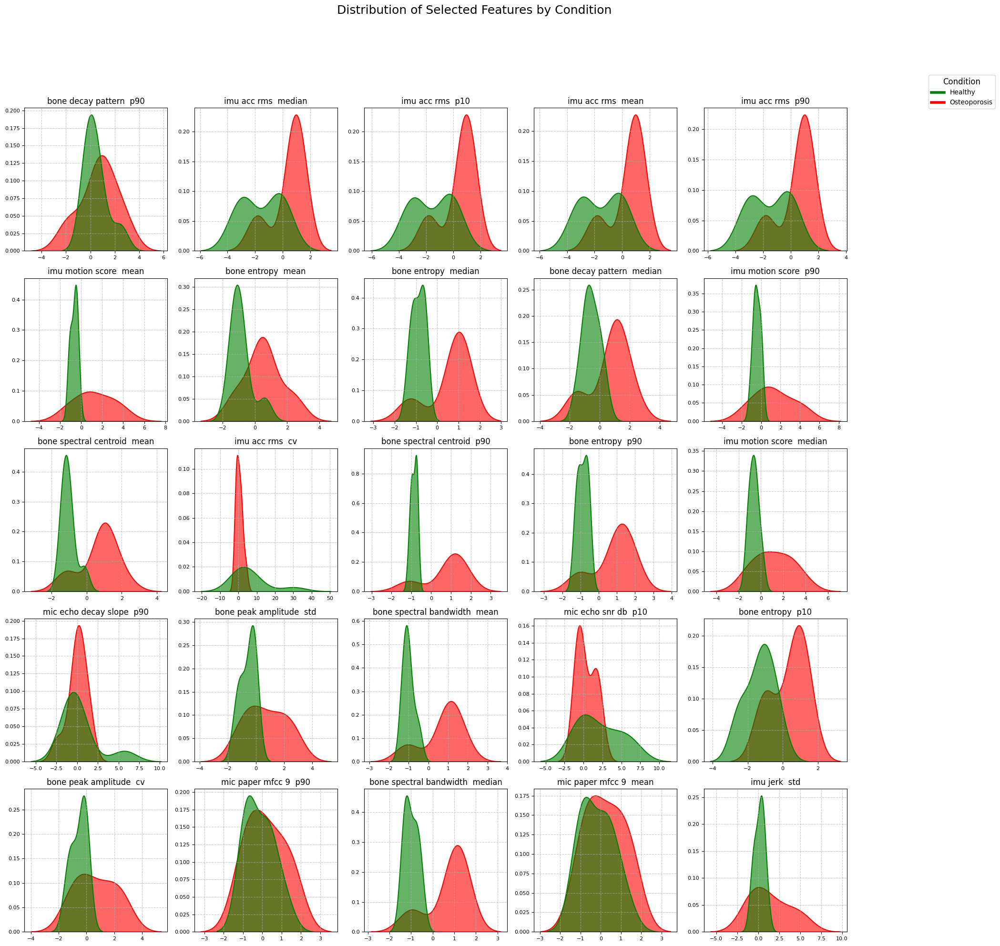

In [10]:
plot_feature_distributions(full_selected_feat_df, selected_features)

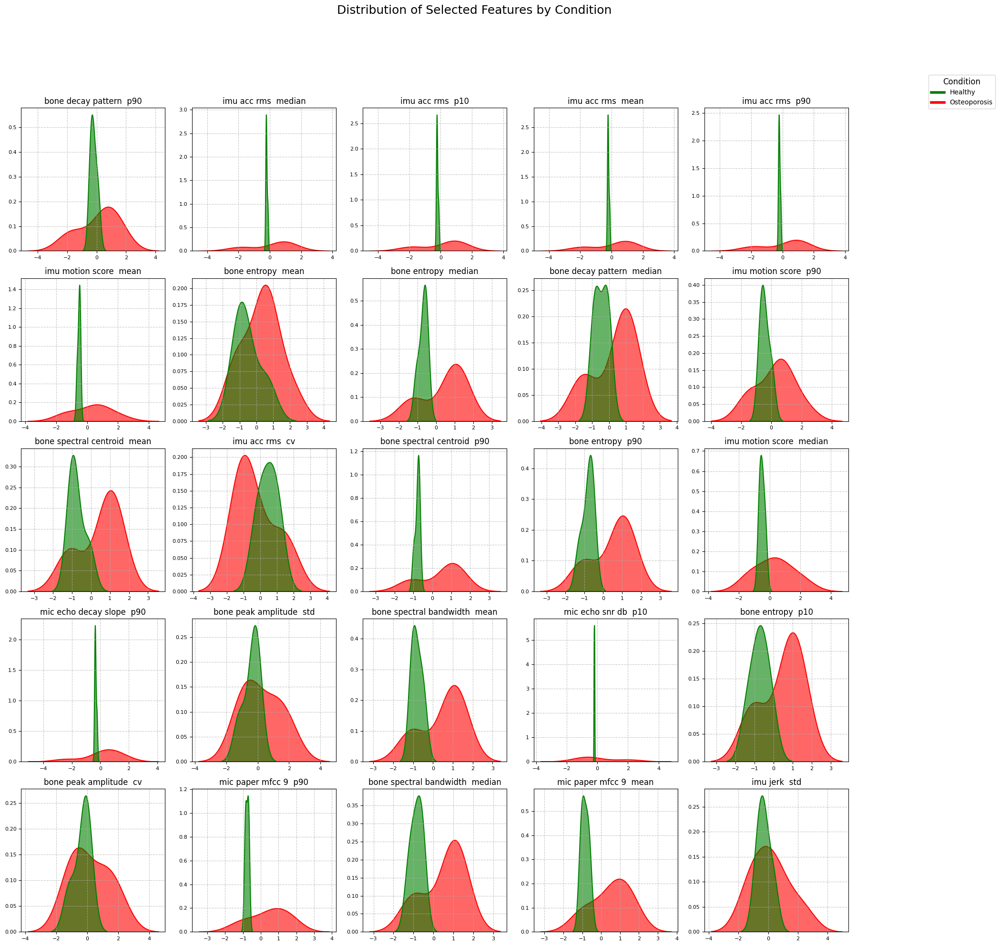

In [9]:
plot_feature_distributions(selected_feat_train_df, selected_features)

In [17]:
import pandas as pd
import numpy as np
from scipy.stats import norm

# Define the metadata columns to exclude from feature analysis
metadata_cols_for_stats = ['patient_id', 'flag', 'session_id']

# Identify non-metadata feature columns
feature_cols = [col for col in selected_feat_train_df.columns if col not in metadata_cols_for_stats]

# Initialize an empty list to store results for each feature
feature_statistics = []

for feature in feature_cols:
    healthy_data = selected_feat_train_df[selected_feat_train_df['flag'] == 0][feature].dropna()
    osteoporosis_data = selected_feat_train_df[selected_feat_train_df['flag'] == 1][feature].dropna()

    # Skip if either group has no data
    if healthy_data.empty or osteoporosis_data.empty:
        feature_statistics.append({
            'Feature': feature,
            'Healthy Mean \u00b1 SD': 'N/A',
            'Osteoporosis Mean \u00b1 SD': 'N/A',
            "Cohen's d (Effect Size)": np.nan,
            'Distribution Overlap (%)': np.nan
        })
        continue

    # Healthy Group Stats
    healthy_mean = healthy_data.mean()
    healthy_std = healthy_data.std()
    n_healthy = len(healthy_data)

    # Osteoporosis Group Stats
    osteoporosis_mean = osteoporosis_data.mean()
    osteoporosis_std = osteoporosis_data.std()
    n_osteoporosis = len(osteoporosis_data)

    # Pooled Standard Deviation for Cohen's d
    if (n_healthy + n_osteoporosis - 2) > 0: # Avoid division by zero
        pooled_std = np.sqrt(((n_healthy - 1) * healthy_std**2 + (n_osteoporosis - 1) * osteoporosis_std**2) / (n_healthy + n_osteoporosis - 2))
    else:
        pooled_std = np.nan # Not enough data for pooled std

    # Cohen's d
    if not np.isnan(pooled_std) and pooled_std > 0:
        cohens_d = (osteoporosis_mean - healthy_mean) / pooled_std
    else:
        cohens_d = np.nan

    # Distribution Overlap (assuming normal distributions)
    if not np.isnan(cohens_d):
        overlap_percentage = 2 * norm.cdf(-abs(cohens_d) / 2) * 100
    else:
        overlap_percentage = np.nan

    feature_statistics.append({
        'Feature': feature,
        'Healthy Mean \u00b1 SD': f'{healthy_mean:.2f} \u00b1 {healthy_std:.2f}',
        'Osteoporosis Mean \u00b1 SD': f'{osteoporosis_mean:.2f} \u00b1 {osteoporosis_std:.2f}',
        "Cohen's d (Effect Size)": cohens_d,
        'Distribution Overlap (%)': overlap_percentage
    })

# Create the new DataFrame
summary_df = pd.DataFrame(feature_statistics)

# display(summary_df.sort_values(by='Distribution Overlap (%)', ascending=False))
print(summary_df.sort_values(by='Distribution Overlap (%)').to_string(index=False))


                        Feature Healthy Mean ± SD Osteoporosis Mean ± SD  Cohen's d (Effect Size)  Distribution Overlap (%)
         mic_paper_mfcc_9__mean      -0.86 ± 0.20            0.49 ± 1.02                 1.613452                 41.982449
bone_spectral_bandwidth__median      -0.85 ± 0.31            0.49 ± 1.01                 1.580071                 42.950705
  bone_spectral_bandwidth__mean      -0.81 ± 0.27            0.47 ± 1.05                 1.468421                 46.282039
              bone_entropy__p90      -0.81 ± 0.30            0.46 ± 1.05                 1.466333                 46.345704
    bone_spectral_centroid__p90      -0.79 ± 0.12            0.45 ± 1.08                 1.402607                 48.311350
          mic_paper_mfcc_9__p90      -0.78 ± 0.09            0.44 ± 1.09                 1.369320                 49.355858
   bone_spectral_centroid__mean      -0.75 ± 0.43            0.43 ± 1.07                 1.291975                 51.828756
        

### Correlation analysis

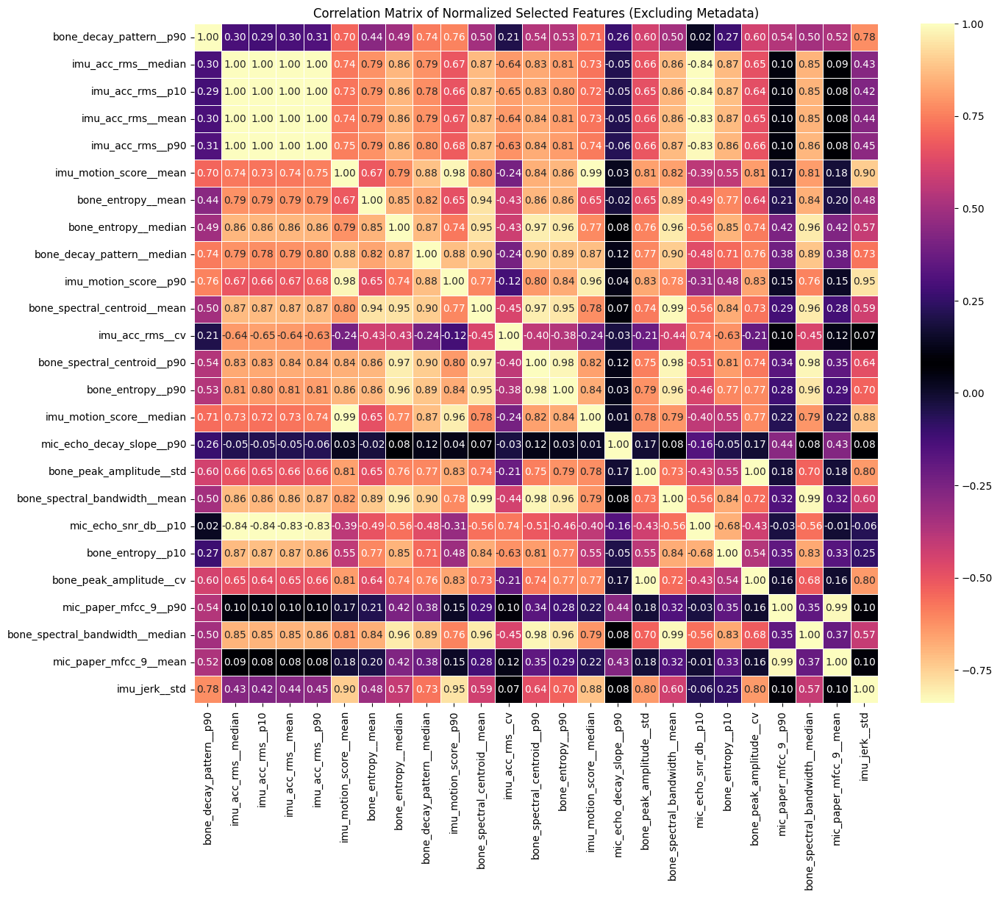

In [22]:
# Define metadata columns to exclude
metadata_columns_to_exclude = metadata_cols

plot_correlation_heatmap(full_selected_feat_df, metadata_columns_to_exclude)


**Most selected features exhibit strong correlation with each other, indicating the existence of nformation redundancy, which needs further handling**

### Analysis of PCA Explained variance

#### in the selected features

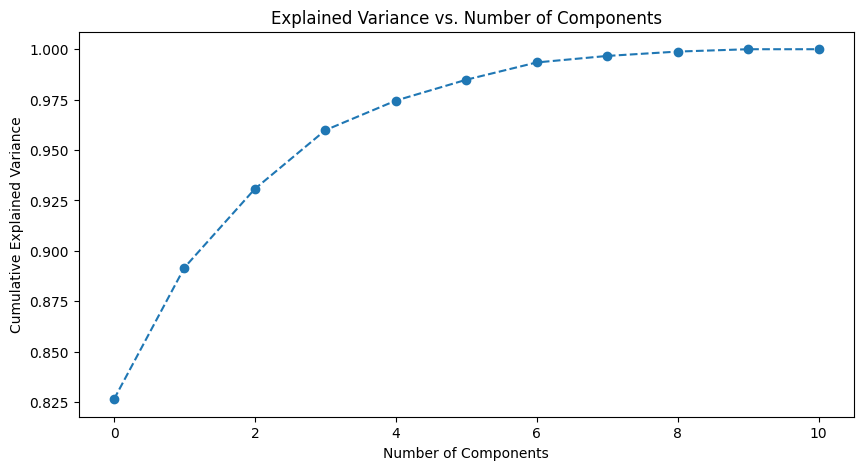


PCA Explained Variance Ratio:


,Num Components,Cumulative Explained Variance Ratio
0,1,0.826403
1,2,0.891725
2,3,0.930743
3,4,0.959848
4,5,0.974512
5,6,0.984865
6,7,0.993445
7,8,0.996670
8,9,0.998832
9,10,1.000000


In [25]:
# max_components should be len(selected_features)
pca_variance_table = get_pca_variance_ratio_table(
    selected_feat_train_df,
    selected_features,
    max_components=len(selected_features)
)

plt.figure(figsize=(10, 5))
plt.plot(pca_variance_table['Cumulative Explained Variance Ratio'], marker='o', linestyle='--')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs. Number of Components')
plt.savefig('app_a_cat_2_explained_variance_vs_components.png')
plt.show()

print("\nPCA Explained Variance Ratio:")
display(pca_variance_table)

In [ ]:
from sklearn.decomposition import PCA



pca = PCA(n_components=6)

X_pca = pca.fit_transform(selected_feat_train_df[selected_features])

X_pca


#### in the full features

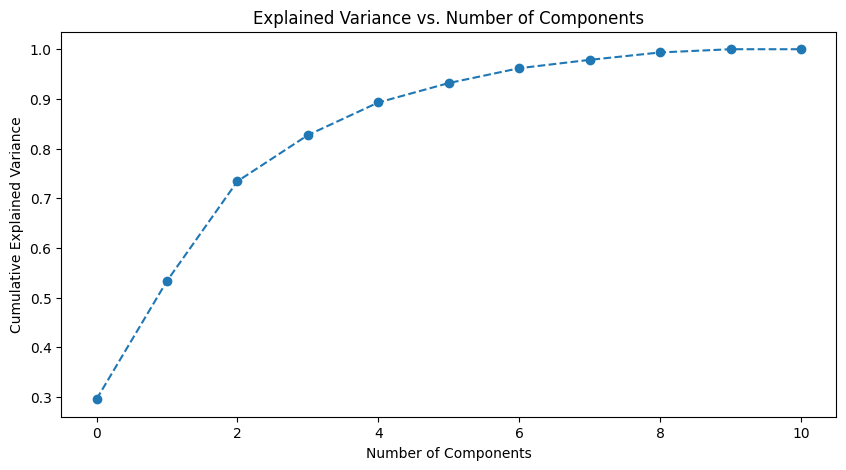


PCA Explained Variance Ratio:


,Num Components,Cumulative Explained Variance Ratio
0,1,0.295673
1,2,0.533602
2,3,0.734189
3,4,0.827157
4,5,0.892826
5,6,0.931926
6,7,0.961786
7,8,0.978608
8,9,0.993502
9,10,1.000000


In [68]:
full_features = [c for c in normalized_train_df.columns if c not in metadata_cols]


# max_components should be len(selected_features)
pca_variance_table = get_pca_variance_ratio_table(
    normalized_train_df,
    full_features,
    max_components=len(selected_features)
)

plt.figure(figsize=(10, 5))
plt.plot(pca_variance_table['Cumulative Explained Variance Ratio'], marker='o', linestyle='--')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs. Number of Components')
plt.show()


print("\nPCA Explained Variance Ratio:")
display(pca_variance_table)


### Applying PCA dim reduction

In [13]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np
def apply_pca(train_df, test_df, metadata, n_components, standarize=False):
    # Separate metadata and features
    existing_metadata = [col for col in metadata if col in train_df.columns]

    train_metadata = train_df[existing_metadata].copy()
    test_metadata = test_df[existing_metadata].copy()

    train_features = train_df.drop(columns=existing_metadata)
    test_features = test_df.drop(columns=existing_metadata)

    # Handle NaN values: fill with mean (simple imputation) before scaling/PCA
    train_features = train_features.fillna(train_features.mean())
    test_features = test_features.fillna(test_features.mean())

    # Optional: Standardize features
    if standarize:
        scaler = StandardScaler()
        train_features_scaled = scaler.fit_transform(train_features)
        test_features_scaled = scaler.transform(test_features)
        train_features = pd.DataFrame(train_features_scaled, columns=train_features.columns, index=train_features.index)
        test_features = pd.DataFrame(test_features_scaled, columns=test_features.columns, index=test_features.index)

    # Apply PCA
    pca = PCA(n_components=n_components)

    # Fit PCA on training data and transform both train and test
    train_pca_components = pca.fit_transform(train_features)
    test_pca_components = pca.transform(test_features)

    # Create DataFrames for PCA components
    train_pca_df = pd.DataFrame(
        train_pca_components,
        columns=[f'PC_{i+1}' for i in range(n_components)],
        index=train_df.index
    )
    test_pca_df = pd.DataFrame(
        test_pca_components,
        columns=[f'PC_{i+1}' for i in range(n_components)],
        index=test_df.index
    )

    # Reconstruct dataframes by joining metadata back with PCA components
    train_df_pca = pd.concat([train_metadata, train_pca_df], axis=1)
    test_df_pca = pd.concat([test_metadata, test_pca_df], axis=1)

    return train_df_pca, test_df_pca

In [14]:
pca_6_selected_feat_train_df, pca_6_selected_feat_test_df = apply_pca(
    selected_feat_train_df,
    selected_feat_test_df,
    metadata_cols,
    n_components=6,
    standarize=True
)

pca_10_selected_feat_train_df, pca_10_selected_feat_test_df = apply_pca(
    selected_feat_train_df,
    selected_feat_test_df,
    metadata_cols,
    n_components=10,
    standarize=True
)

In [16]:
pca_6_all_feat_train_df, pca_6_all_feat_test_df = apply_pca(
    normalized_train_df,
    normalized_test_df,
    metadata_cols,
    n_components=6,
    standarize=True
)

pca_10_all_feat_train_df, pca_10_all_feat_test_df = apply_pca(
    normalized_train_df,
    normalized_test_df,
    metadata_cols,
    n_components=10,
    standarize=True
)

In [17]:
import os
import shutil

# Create a directory to store the PCA datasets
output_dir = 'pca_datasets'
os.makedirs(output_dir, exist_ok=True)

# Save all four PCA-transformed DataFrames to CSV files in the new directory
pca_6_selected_feat_train_df.to_csv(os.path.join(output_dir, 'pca_6_selected_feat_train_df.csv'), index=False)
pca_6_selected_feat_test_df.to_csv(os.path.join(output_dir, 'pca_6_selected_feat_test_df.csv'), index=False)
pca_10_selected_feat_train_df.to_csv(os.path.join(output_dir, 'pca_10_selected_feat_train_df.csv'), index=False)
pca_10_all_feat_test_df.to_csv(os.path.join(output_dir, 'pca_10_all_feat_test_df.csv'), index=False)
pca_6_all_feat_train_df.to_csv(os.path.join(output_dir, 'pca_6_all_feat_train_df.csv'), index=False)
pca_6_all_feat_test_df.to_csv(os.path.join(output_dir, 'pca_6_all_feat_test_df.csv'), index=False)
pca_10_all_feat_train_df.to_csv(os.path.join(output_dir, 'pca_10_all_feat_train_df.csv'), index=False)


# Create a zip archive of the directory
zip_filename = 'pca_datasets'
shutil.make_archive(zip_filename, 'zip', output_dir)

print(f"All PCA datasets saved and zipped into: {zip_filename}.zip")

All PCA datasets saved and zipped into: pca_datasets.zip



Plotting feature distributions for: PCA_6_Selected_Features


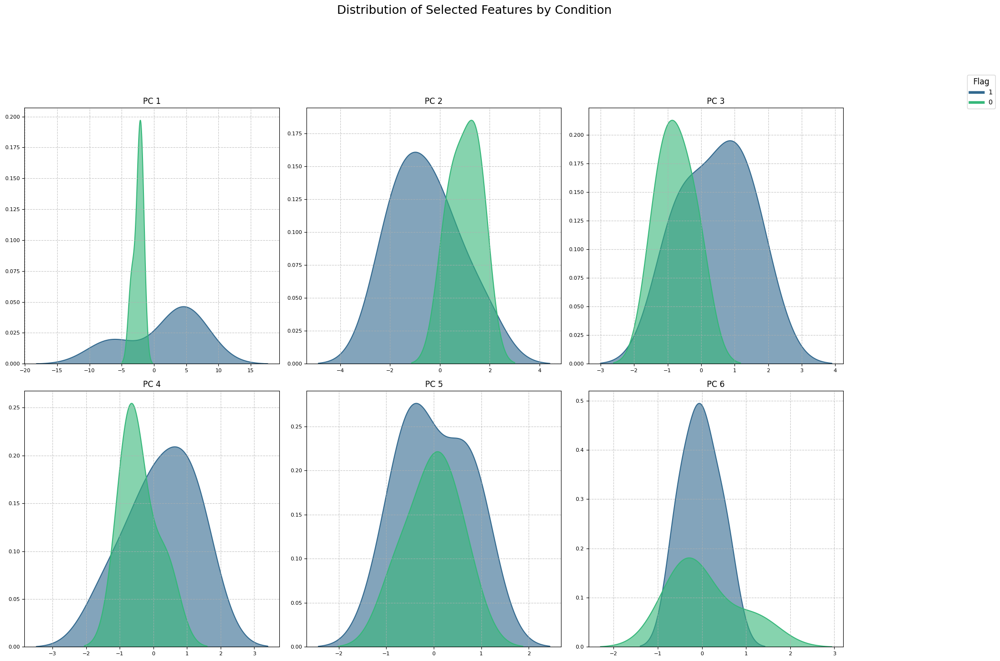


Plotting feature distributions for: PCA_10_Selected_Features


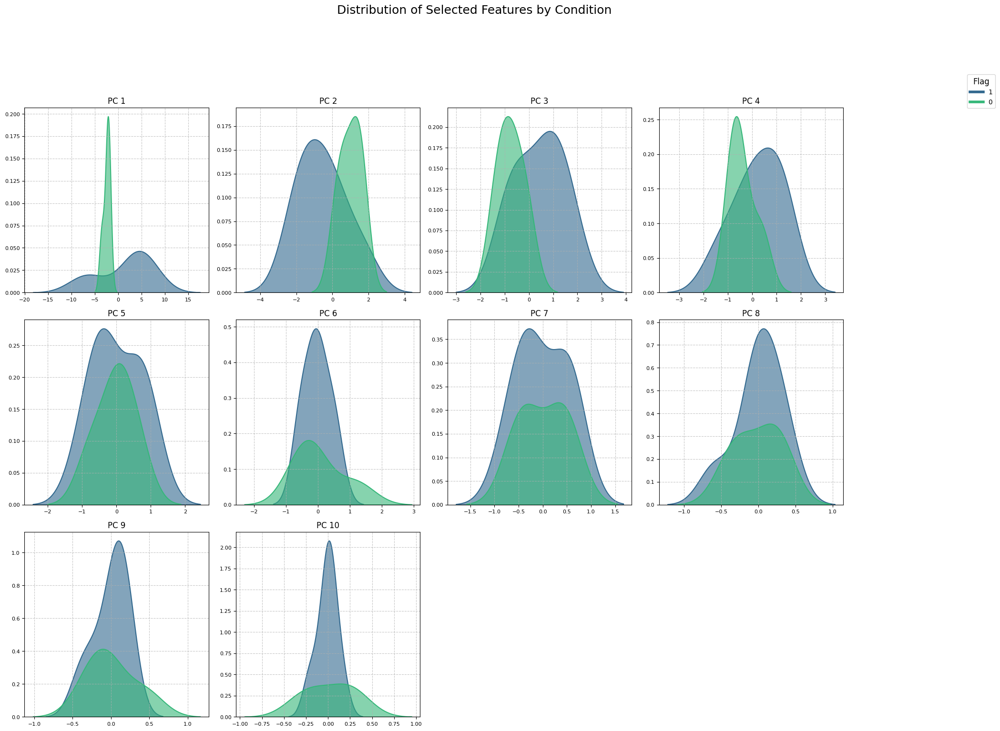


Plotting feature distributions for: PCA_6_All_Features


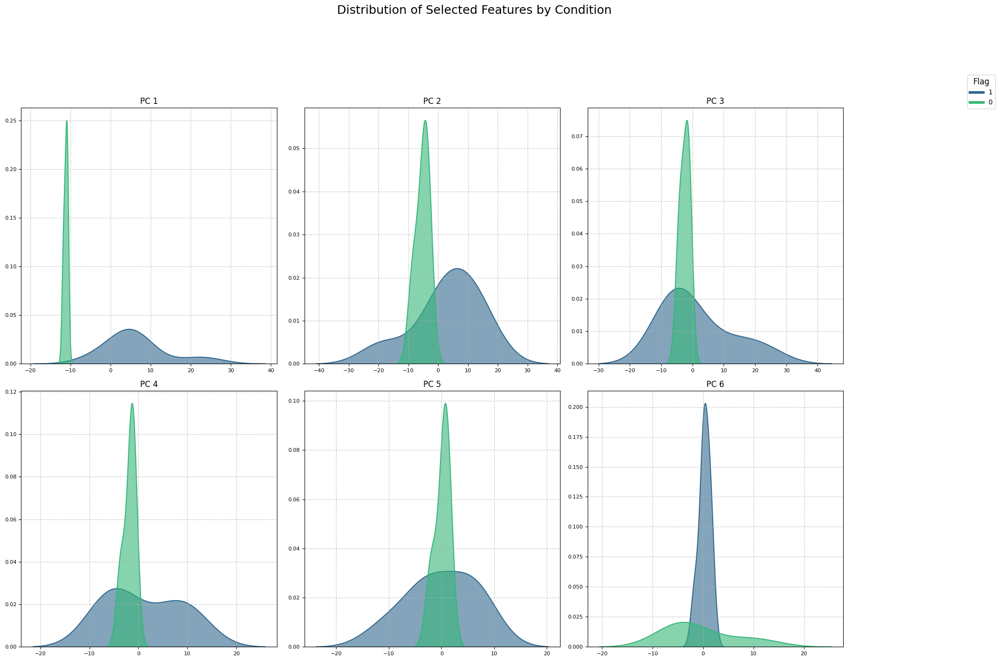


Plotting feature distributions for: PCA_10_All_Features


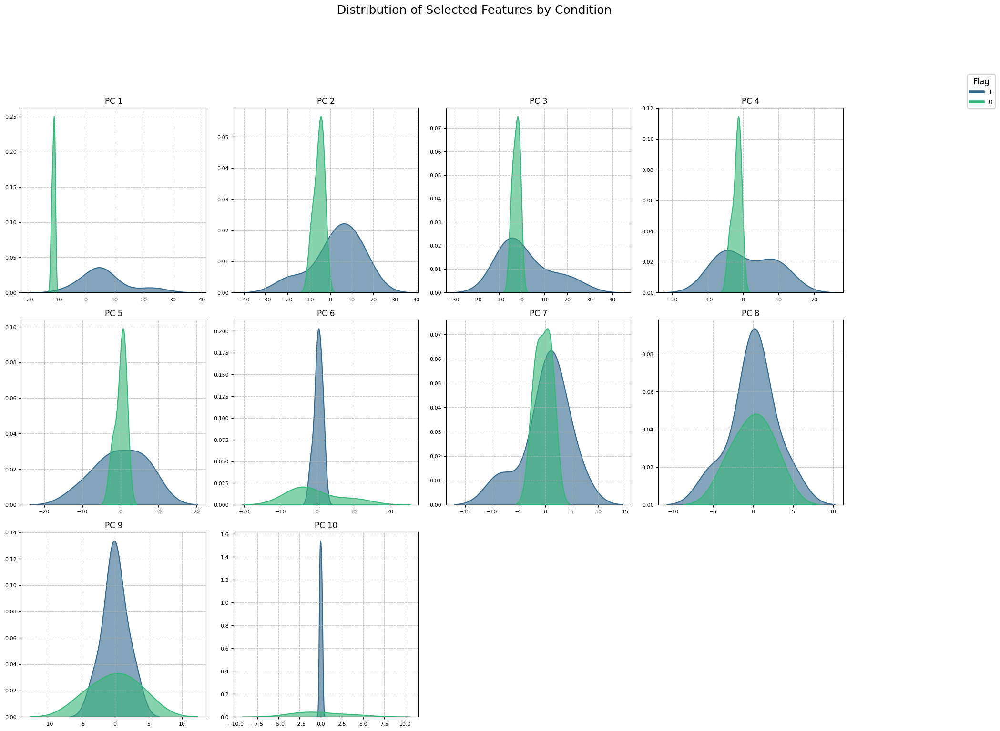

In [25]:
# Group PCA training dataframes for iteration
pca_train_datasets = {
    'PCA_6_Selected_Features': pca_6_selected_feat_train_df,
    'PCA_10_Selected_Features': pca_10_selected_feat_train_df,
    'PCA_6_All_Features': pca_6_all_feat_train_df,
    'PCA_10_All_Features': pca_10_all_feat_train_df
}

for name, df_pca in pca_train_datasets.items():
    print(f"\nPlotting feature distributions for: {name}")
    # Dynamically get feature columns for the current PCA dataframe
    pca_feature_cols = [col for col in df_pca.columns if col.startswith('PC_')]

    # Call the plotting function
    plot_feature_distributions(
        df_pca,
        pca_feature_cols
    )

# Oversampling

### Helper functions

#### SMOTE

In [26]:
from imblearn.over_sampling import SMOTE
from collections import Counter
import pandas as pd

def apply_smote(
    X: pd.DataFrame,
    y: pd.Series,
    random_state: int = None,
    sampling_strategy: str = 'auto',
    k_neighbors = 2
) -> tuple[pd.DataFrame, pd.Series]:
    """
    Applies SMOTE oversampling to the input features (X) and target (y).

    Args:
        X (pd.DataFrame): The DataFrame containing the feature columns.
        y (pd.Series): The Series containing the target column.
        random_state (int, optional): Controls the randomness of the oversampling process.
                                      Pass an int for reproducible results. Defaults to None.
        sampling_strategy (str, optional): Sampling strategy to use. Can be 'auto', 'minority',
                                           'not majority', 'all', or a dictionary/list.
                                           Defaults to 'auto'.

    Returns:
        tuple[pd.DataFrame, pd.Series]: A tuple containing the oversampled features (X_resampled)
                                        and target (y_resampled).
    """
    print(f"Original class distribution: {Counter(y)}")

    smote = SMOTE(random_state=random_state, sampling_strategy=sampling_strategy, k_neighbors=k_neighbors)
    X_resampled, y_resampled = smote.fit_resample(X, y)

    print(f"Resampled class distribution: {Counter(y_resampled)}")
    return X_resampled, y_resampled


#### Jittering

In [43]:
import pandas as pd
import numpy as np
from imblearn.over_sampling import RandomOverSampler

def jitter_oversample(X, y, target_size_dict, noise_level=0.01, random_state=None):
    """
    Oversamples a tiny dataframe by duplicating rows and adding
    minor Gaussian noise relative to each column's standard deviation.
    """
    print(f"Original class distribution: {Counter(y)}")

    ros = RandomOverSampler(random_state=random_state, sampling_strategy=target_size_dict)
    extended_df, extended_y = ros.fit_resample(X, y)

    # 2. Separate numeric features to inject noise
    numeric_cols = extended_df.select_dtypes(include=[np.number]).columns

    for col in numeric_cols:
        # Calculate standard deviation to keep noise proportional to the feature scale
        std = X[col].std()
        if pd.isna(std) or std == 0:
            std = X[col].mean() * 0.1 # Fallback if variance is 0

        noise = np.random.normal(0, std * noise_level, size=len(extended_df))
        extended_df[col] = extended_df[col] + noise

    print(f"Resampled class distribution: {Counter(extended_y)}")
    return extended_df, extended_y

#### plotting

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

def plot_features_by_condition(feature_df, target_df):
    num_features = len(feature_df.columns)
    if num_features == 0:
        print("No features selected to plot.")
    else:
        grid_size = int(np.ceil(np.sqrt(num_features))) # This will be 5 for 25 features

        fig, axes = plt.subplots(grid_size, grid_size, figsize=(20, 20), constrained_layout=False)
        axes = axes.flatten()

        # Determine the name for the target column in the plot data
        target_col_name = target_df.name if target_df.name is not None else 'target_variable'

        # Create a combined DataFrame for plotting, adding the target_df as a column
        plot_data = feature_df.copy()
        plot_data[target_col_name] = target_df

        unique_conditions = target_df.unique()
        palette = sns.color_palette('viridis', n_colors=len(unique_conditions))
        condition_colors = dict(zip(unique_conditions, palette))

        for i, feature in enumerate(feature_df.columns):
            if i < len(axes):
                ax = axes[i]
                # Use kdeplot for smoother distribution visualization
                sns.kdeplot(
                    data=plot_data, # Use the combined dataframe
                    x=feature,
                    hue=target_col_name, # Use the dynamic target column name as hue
                    fill=True,
                    alpha=0.6,
                    linewidth=1.5,
                    ax=ax,
                    palette=condition_colors,
                    common_norm=True,
                    legend=False # Control legend manually for first plot to avoid redundancy
                )
                ax.set_title(feature.replace('_', ' ').replace('__', ' '), fontsize=12)
                ax.set_xlabel('')
                ax.set_ylabel('')
                ax.tick_params(axis='both', which='major', labelsize=8)
                ax.grid(True, linestyle='--', alpha=0.7)
                # ax.set_ylim([0, 1])

        # Create a single legend for the entire figure
        dummy_patches = []
        for cond, color in condition_colors.items():
            dummy_patches.append(plt.Line2D([0], [0], color=color, lw=4, label=cond))

        # Add legend to the figure, using the dynamic target column name for the title
        fig.legend(handles=dummy_patches, title=target_col_name.replace('_', ' ').title(), loc='upper right', bbox_to_anchor=(1.05, 0.95), fontsize=10, title_fontsize=12)

        # Adjust layout to make space for suptitle and legend, using the dynamic target column name
        fig.suptitle(f'Distribution of Normalized Selected Features by {target_col_name.replace("_", " ").title()}', fontsize=18, y=1.02)
        plt.tight_layout(rect=[0, 0.03, 0.9, 0.95])

        # Turn off any unused subplots
        for j in range(num_features, len(axes)):
            fig.delaxes(axes[j])

        plt.savefig('distribution_of_normalized_selected_features_by_condition.png', bbox_inches='tight')
        plt.show()

### Execution

#### Step 1: SMOTE

**Oversample the minority class(es) to be of equal size to the majority class by synthasizing (generating) new samples**

In [38]:
oversampled_pca_train_data = {}

# Add selected_feat_train_df to pca_train_datasets for oversampling
pca_train_datasets['Selected_Features_No_PCA'] = selected_feat_train_df

for name, df_pca_train in pca_train_datasets.items():
    print(f"\nApplying SMOTE to: {name}")

    # Drop metadata columns to get features (X)
    # metadata_cols includes 'flag' (target_col), which should not be dropped from X
    cols_to_drop_from_X = [col for col in metadata_cols if col != target_col and col in df_pca_train.columns]

    X_train_pca = df_pca_train.drop(
        columns=cols_to_drop_from_X
    )
    # Ensure target column is dropped from X_train_pca
    X_train_pca = X_train_pca.drop(columns=[target_col])

    # Extract target (y)
    y_train_pca = df_pca_train[target_col]

    # Apply SMOTE
    X_resampled, y_resampled = apply_smote(
        X_train_pca,
        y_train_pca,
        random_state=RANDOM_STATE,
        sampling_strategy='all',
        k_neighbors=2
    )

    oversampled_pca_train_data[name] = {
        'X': X_resampled,
        'y': y_resampled
    }

    print(f'Length of {name} before SMOTE: {len(df_pca_train)} -- Length after SMOTE: {len(X_resampled)}')
    # display(X_resampled.head())
    # display(y_resampled.head())

print("\nSMOTE applied to all PCA training datasets. Results stored in 'oversampled_pca_train_data'.")


Applying SMOTE to: PCA_6_Selected_Features
Original class distribution: Counter({1: 7, 0: 4})
Resampled class distribution: Counter({1: 7, 0: 7})
Length of PCA_6_Selected_Features before SMOTE: 11 -- Length after SMOTE: 14

Applying SMOTE to: PCA_10_Selected_Features
Original class distribution: Counter({1: 7, 0: 4})
Resampled class distribution: Counter({1: 7, 0: 7})
Length of PCA_10_Selected_Features before SMOTE: 11 -- Length after SMOTE: 14

Applying SMOTE to: PCA_6_All_Features
Original class distribution: Counter({1: 7, 0: 4})
Resampled class distribution: Counter({1: 7, 0: 7})
Length of PCA_6_All_Features before SMOTE: 11 -- Length after SMOTE: 14

Applying SMOTE to: PCA_10_All_Features
Original class distribution: Counter({1: 7, 0: 4})
Resampled class distribution: Counter({1: 7, 0: 7})
Length of PCA_10_All_Features before SMOTE: 11 -- Length after SMOTE: 14

Applying SMOTE to: Selected_Features_No_PCA
Original class distribution: Counter({1: 7, 0: 4})
Resampled class distribu

In [42]:
oversampled_pca_train_data.keys()

oversampled_pca_train_data['PCA_6_Selected_Features']

{'X':         PC_1      PC_2      PC_3      PC_4      PC_5      PC_6
 0  -6.900504 -1.026017  1.288383 -0.109619  0.555433 -0.506335
 1  -6.415845 -0.957053  0.854910  1.351217 -0.420269  0.573326
 2   5.392730  0.003837 -0.069759  0.805145 -0.972725  0.390976
 3   6.224022  1.692445  0.718331  1.231399  0.978285 -0.053873
 4  -1.884015  0.247470 -0.973362 -0.837296  0.606125  1.185570
 5  -2.259111  0.746332 -0.608414 -0.688525 -0.751692 -0.165443
 6  -3.486381  1.375541 -1.369715  0.366241  0.005916 -0.551609
 7  -2.227963  1.597291 -0.080917 -0.488527  0.025699 -0.244222
 8   3.845821 -2.177044 -0.643347 -0.506683  0.672063 -0.050266
 9   4.284002  0.297400  1.822807 -1.446494 -0.437360 -0.024964
 10  3.427244 -1.800202 -0.938916  0.323142 -0.261477 -0.553161
 11 -2.233676  1.441196 -0.177679 -0.525213 -0.116902 -0.229771
 12 -1.966652  0.357374 -0.892961 -0.804520  0.306986  0.887930
 13 -2.735294  1.507893 -0.600496 -0.143927  0.017723 -0.368145,
 'y': 0     1
 1     1
 2     1
 3

#### Step 2: Jittering

**Increase the total size of the dataset to a safe limit with respect to the number of features**

In [44]:
for name, data in oversampled_pca_train_data.items():
    print(f"\nApplying Jitter Oversampling to: {name}")
    oversampled_train_x = data['X']
    oversampled_train_y = data['y']

    target_size_per_class = min(
        len(oversampled_train_x.columns) * 10,
        len(oversampled_train_x.columns) ** 2
    ) # choosing min to avoid the possible drawbacks of excessive oversampling

    if len(oversampled_train_x) < target_size_per_class:
        target_size_dict = {
            cls: target_size_per_class
            for cls in oversampled_train_y.unique()
        }

        oversampled_train_x, oversampled_train_y = jitter_oversample(
            oversampled_train_x,
            oversampled_train_y,
            target_size_dict=target_size_dict,
            random_state=RANDOM_STATE)

    # Update the dictionary with the jittered data
    oversampled_pca_train_data[name]['X'] = oversampled_train_x
    oversampled_pca_train_data[name]['y'] = oversampled_train_y

    print(f'Length of {name} after Jitter Oversampling: {len(oversampled_train_x)}')
    # Display head for verification for each dataset
    # print(f"X for {name}:")
    # display(oversampled_train_x.head())
    # print(f"y for {name}:")
    # display(oversampled_train_y.head())


Applying Jitter Oversampling to: PCA_6_Selected_Features
Original class distribution: Counter({1: 7, 0: 7})
Resampled class distribution: Counter({1: 36, 0: 36})
Length of PCA_6_Selected_Features after Jitter Oversampling: 72

Applying Jitter Oversampling to: PCA_10_Selected_Features
Original class distribution: Counter({1: 7, 0: 7})
Resampled class distribution: Counter({1: 100, 0: 100})
Length of PCA_10_Selected_Features after Jitter Oversampling: 200

Applying Jitter Oversampling to: PCA_6_All_Features
Original class distribution: Counter({1: 7, 0: 7})
Resampled class distribution: Counter({1: 36, 0: 36})
Length of PCA_6_All_Features after Jitter Oversampling: 72

Applying Jitter Oversampling to: PCA_10_All_Features
Original class distribution: Counter({1: 7, 0: 7})
Resampled class distribution: Counter({1: 100, 0: 100})
Length of PCA_10_All_Features after Jitter Oversampling: 200

Applying Jitter Oversampling to: Selected_Features_No_PCA
Original class distribution: Counter({1: 7,

#### Visualization


Plotting feature distributions for: PCA_6_Selected_Features


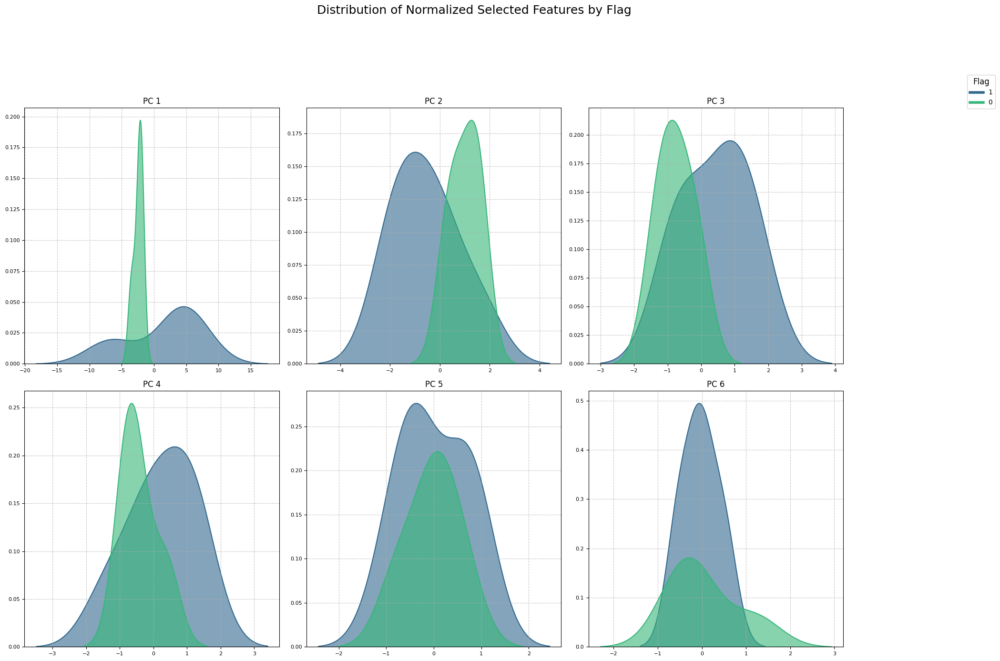


Plotting feature distributions for: PCA_10_Selected_Features


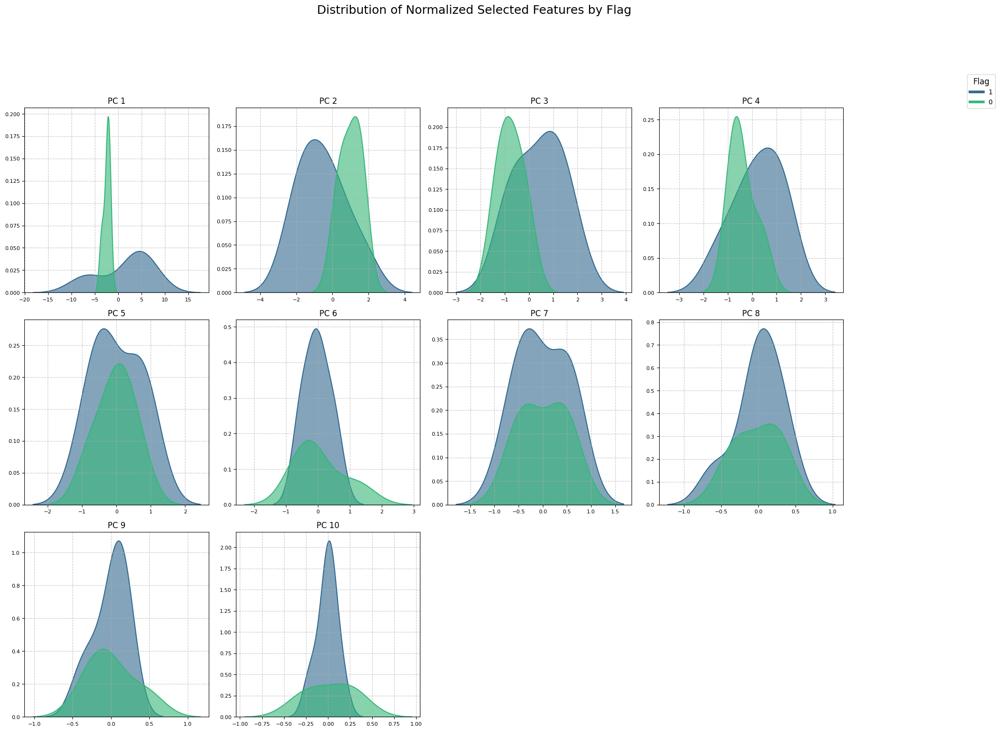


Plotting feature distributions for: PCA_6_All_Features


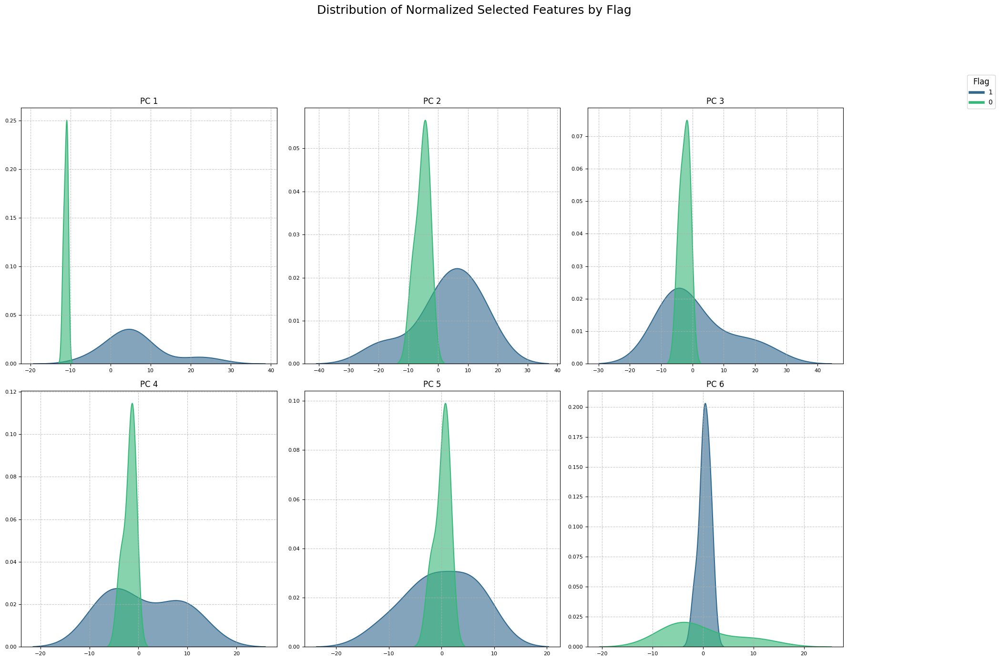


Plotting feature distributions for: PCA_10_All_Features


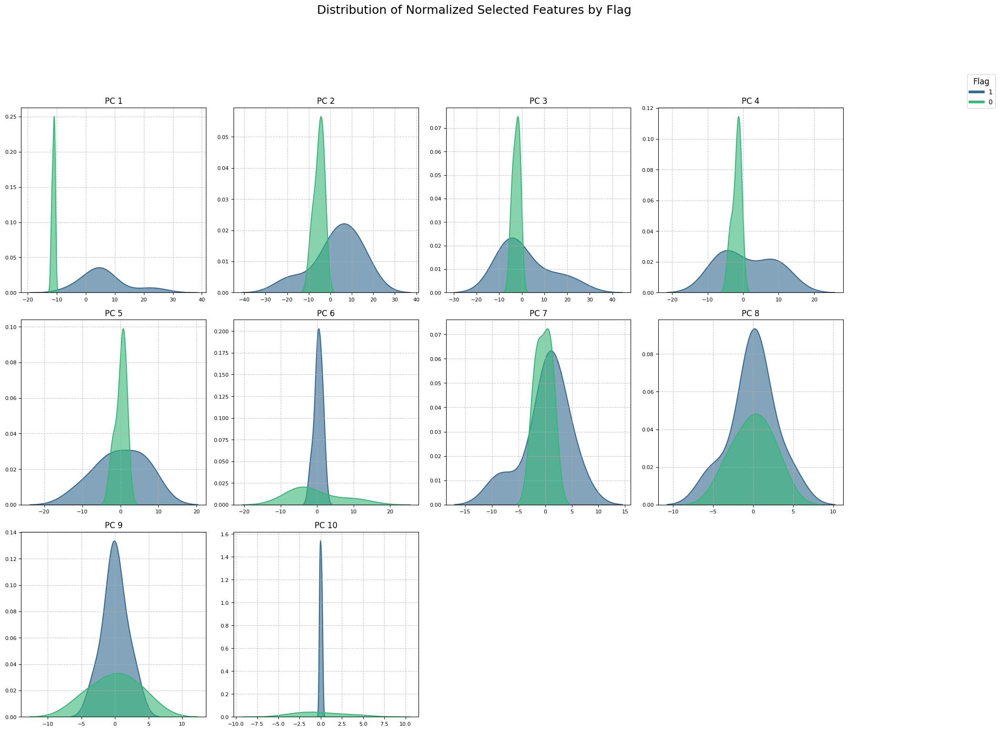


Plotting feature distributions for: Selected_Features_No_PCA


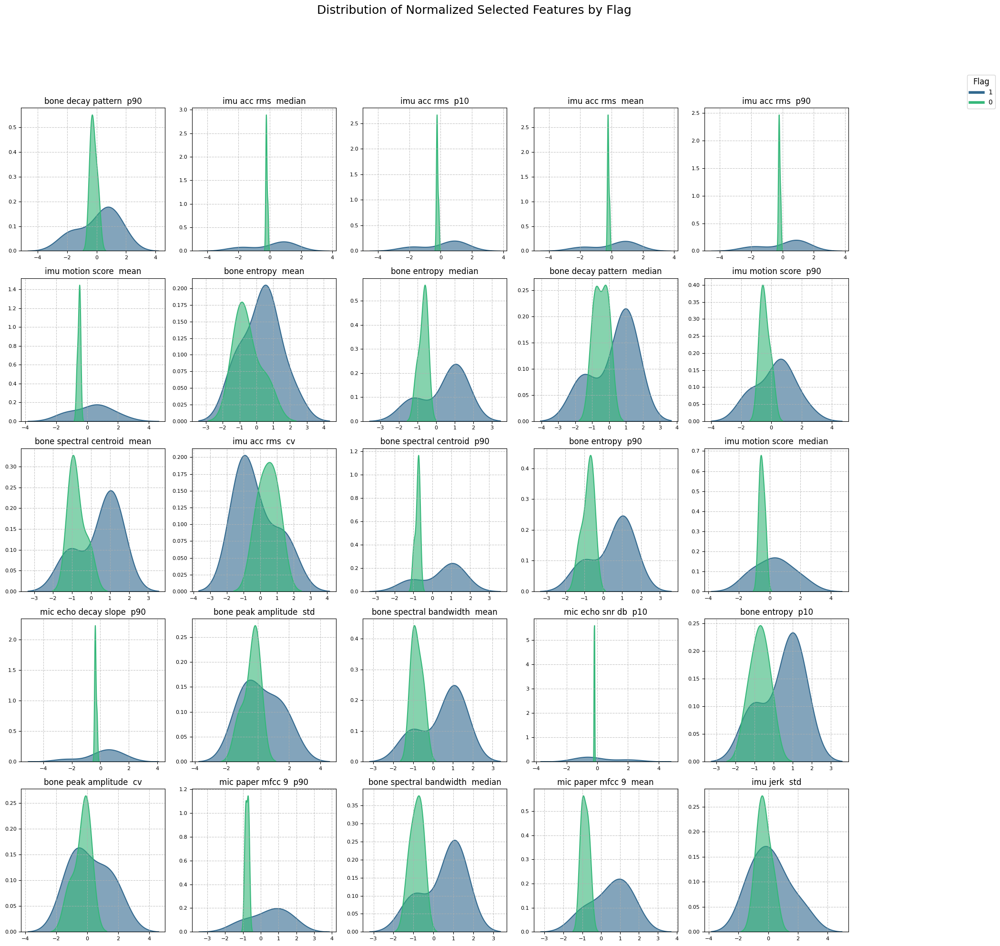

In [68]:
for name, df_train in pca_train_datasets.items():
    print(f"\nPlotting feature distributions for: {name}")

    # Identify feature columns by excluding metadata columns
    feature_cols_for_plot = [col for col in df_train.columns if col not in metadata_cols]

    # Extract features (X) and target (y)
    original_train_x = df_train[feature_cols_for_plot]
    original_train_y = df_train[target_col]

    plot_features_by_condition(original_train_x, original_train_y)


Plotting feature distributions for: PCA_6_Selected_Features


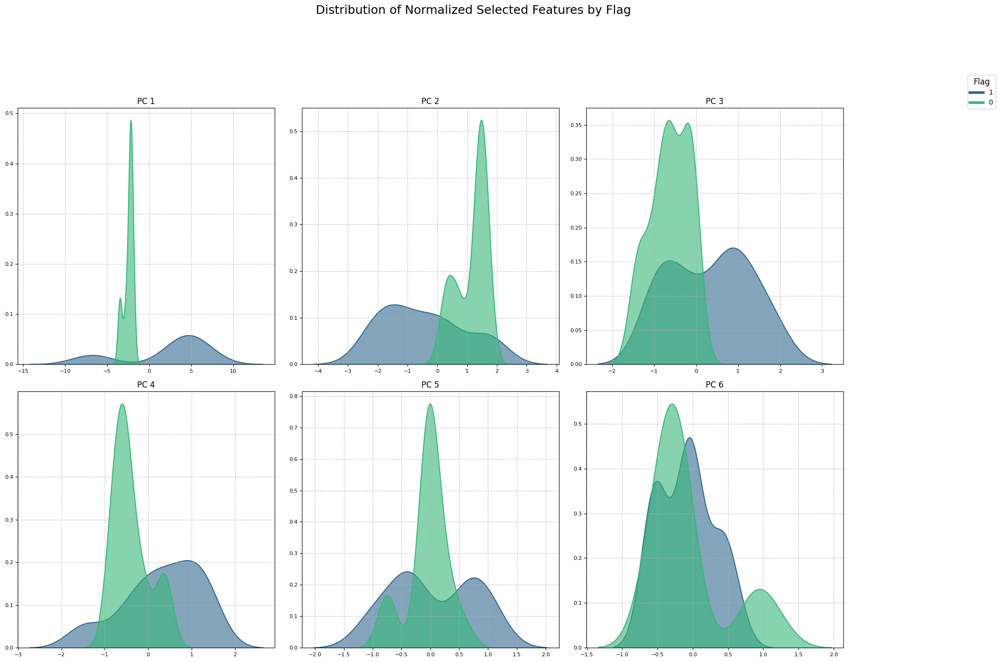


Plotting feature distributions for: PCA_10_Selected_Features


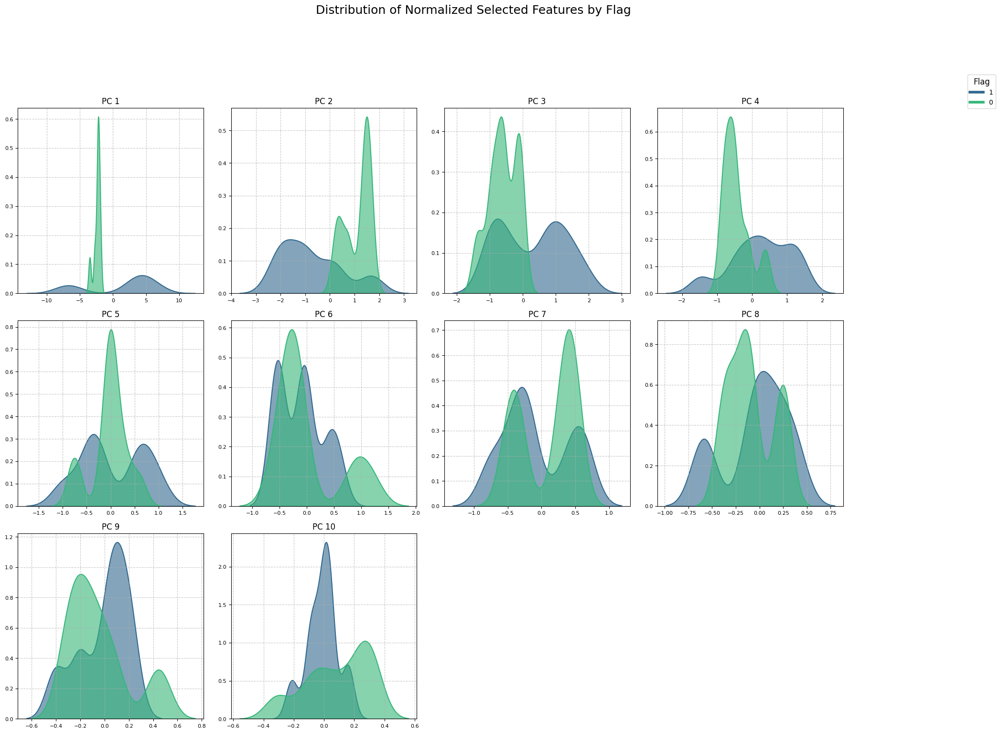


Plotting feature distributions for: PCA_6_All_Features


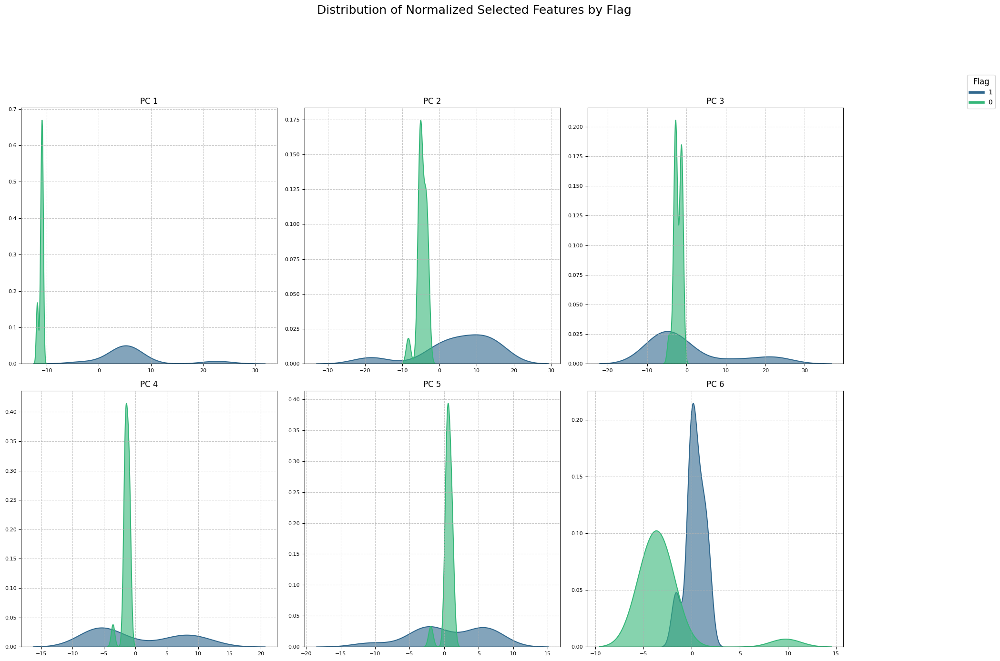


Plotting feature distributions for: PCA_10_All_Features


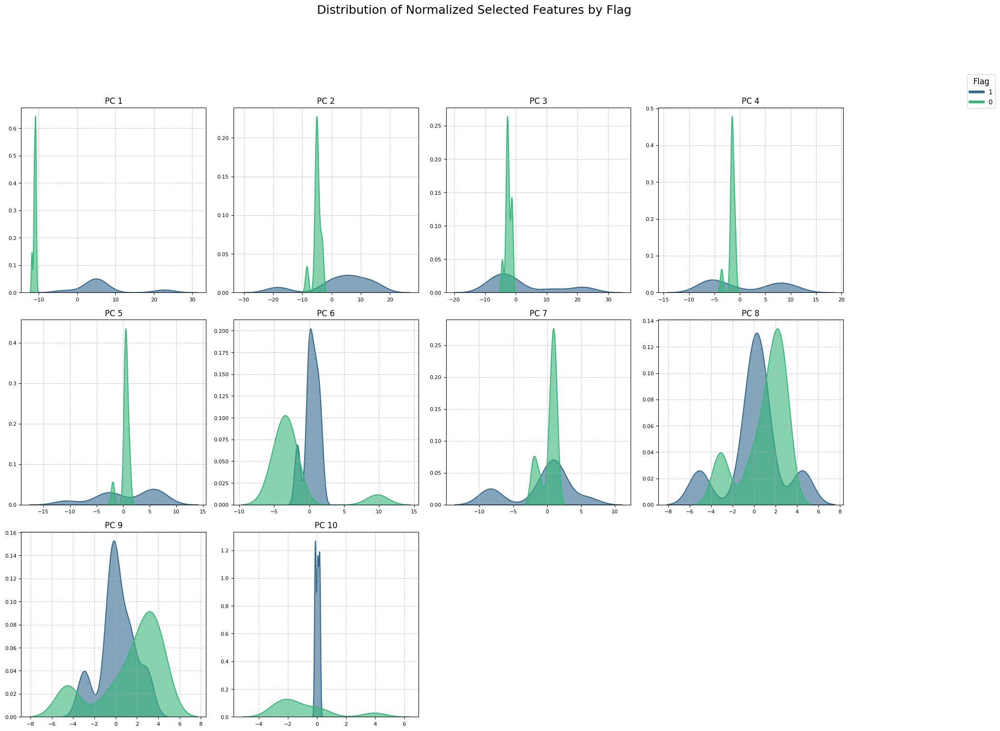


Plotting feature distributions for: Selected_Features_No_PCA


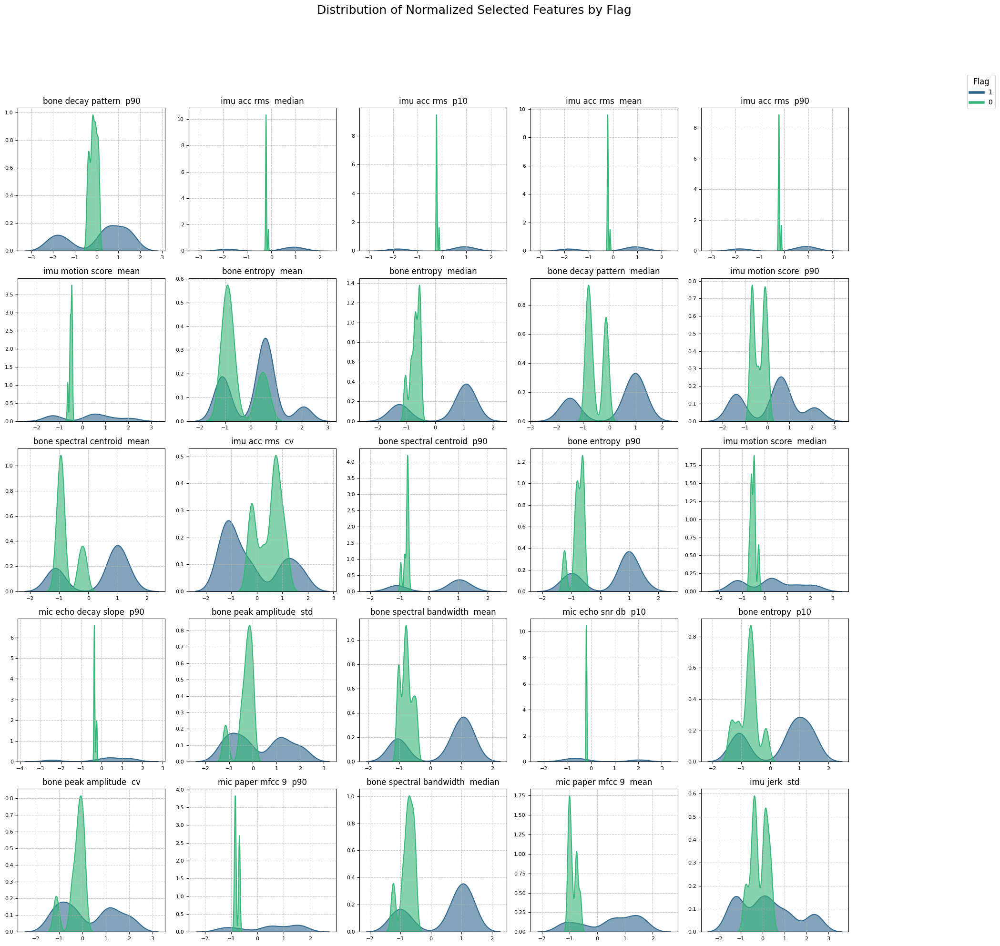

In [45]:
for name, data in oversampled_pca_train_data.items():
    print(f"\nPlotting feature distributions for: {name}")
    oversampled_train_x = data['X']
    oversampled_train_y = data['y']
    plot_features_by_condition(oversampled_train_x, oversampled_train_y)

# ML Models training

In [84]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import TunedThresholdClassifierCV
import numpy as np
import pandas as pd
import os
import zipfile
from collections import Counter # For distribution counts

def train_and_evaluate_model(model_instance, X_train, y_train, X_test, y_test, model_name):
    """
    Trains a given model and evaluates its performance.
    Handles TunedThresholdClassifierCV specifically.
    """
    optimal_threshold = np.nan # Initialize for untuned models
    y_prob = None # Initialize y_prob

    if isinstance(model_instance, TunedThresholdClassifierCV):
        # Fit TunedThresholdClassifierCV on the oversampled training data
        model_instance.fit(X_train, y_train)
        y_pred = model_instance.predict(X_test)

        # Safely extract best_threshold_
        if hasattr(model_instance, 'best_threshold_'):
            optimal_threshold = model_instance.best_threshold_

        # Safely get probabilities from the underlying best estimator
        if hasattr(model_instance, 'best_estimator_') and model_instance.best_estimator_ is not None:
            if hasattr(model_instance.best_estimator_, 'predict_proba'):
                y_prob = model_instance.best_estimator_.predict_proba(X_test)[:, 1]
    else:
        # For standard models, fit directly
        model_instance.fit(X_train, y_train)
        y_pred = model_instance.predict(X_test)
        y_prob = model_instance.predict_proba(X_test)[:, 1] if hasattr(model_instance, "predict_proba") else None

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_prob) if y_prob is not None else np.nan

    return {
        'Model': model_name,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
        'ROC-AUC': roc_auc,
        'Optimal_Threshold_Used': optimal_threshold, # New field
        'y_test': y_test,
        'y_pred': y_pred,
        'y_prob': y_prob
    }

# Define the base models to be trained
base_models = {
    'Logistic Regression': LogisticRegression(random_state=RANDOM_STATE, solver='liblinear'),
    'K-Nearest Neighbors': KNeighborsClassifier(n_neighbors=1),
    'Random Forest': RandomForestClassifier(random_state=RANDOM_STATE),
    'Decision Tree': DecisionTreeClassifier(random_state=RANDOM_STATE),
    'SVM': SVC(probability=True, random_state=RANDOM_STATE), # SVC needs probability=True for predict_proba
    'AdaBoost': AdaBoostClassifier(random_state=RANDOM_STATE),
    'MLP': MLPClassifier(random_state=RANDOM_STATE, max_iter=1000) # Increased max_iter for convergence
}

# Combine base models with their tuned threshold versions
all_models = {}
for name, estimator in base_models.items():
    all_models[name] = estimator # Add the base model

    # Only wrap models that can provide probabilities (i.e., have predict_proba)
    # SVC needs probability=True for TunedThresholdClassifierCV to work correctly
    if (hasattr(estimator, 'predict_proba') and callable(getattr(estimator, 'predict_proba'))) or \
       (isinstance(estimator, SVC) and estimator.probability):
        tuned_estimator = TunedThresholdClassifierCV(
            estimator=estimator,
            scoring="precision", # Maximize F1-score as requested
            cv=3 # Using integer for cv will default to StratifiedKFold
        )
        all_models[f'{name} (Tuned)'] = tuned_estimator

# Group PCA datasets by their configuration (used for test data only now)
datasets = {
    'PCA_6_Selected_Features': {
        'train': pca_6_selected_feat_train_df,
        'test': pca_6_selected_feat_test_df
    },
    'PCA_10_Selected_Features': {
        'train': pca_10_selected_feat_train_df,
        'test': pca_10_selected_feat_test_df
    },
    'PCA_6_All_Features': {
        'train': pca_6_all_feat_train_df,
        'test': pca_6_all_feat_test_df
    },
    'PCA_10_All_Features': {
        'train': pca_10_all_feat_train_df,
        'test': pca_10_all_feat_test_df
    }
}

# --- Prepare all evaluation data sources including different preprocessing stages ---
all_evaluation_data_sources = {}

# 1. Datasets BEFORE SMOTE (from pca_train_datasets)
# These are the training dataframes before any oversampling.
for dataset_key, train_df_source in pca_train_datasets.items():
    stage_name = f"Before_SMOTE_{dataset_key}"

    # Determine X_train and y_train
    if dataset_key == 'Selected_Features_No_PCA':
        # For non-PCA selected features, identify feature columns by excluding metadata and target
        cols_to_drop_from_X_train_source = [col for col in metadata_cols if col != target_col and col in train_df_source.columns]
        X_train_current = train_df_source.drop(columns=cols_to_drop_from_X_train_source + [target_col])
        y_train_current = train_df_source[target_col]
    else:
        # For PCA datasets, features are 'PC_X' columns
        X_train_current = train_df_source[[col for col in train_df_source.columns if col.startswith('PC_')]]
        y_train_current = train_df_source[target_col]

    # Determine X_test and y_test (these remain consistent regardless of training preprocessing stage)
    if dataset_key == 'Selected_Features_No_PCA':
        test_df_for_stage = selected_feat_test_df.copy()
        feature_cols_test_for_stage = [col for col in test_df_for_stage.columns if col not in metadata_cols and col != target_col]
        X_test_current = test_df_for_stage[feature_cols_test_for_stage]
        y_test_current = test_df_for_stage[target_col]
    else:
        # Use the existing 'datasets' dict which already holds the correct PCA test DFs
        test_df_for_stage = datasets[dataset_key]['test'].copy()
        feature_cols_test_for_stage = [col for col in test_df_for_stage.columns if col.startswith('PC_')]
        X_test_current = test_df_for_stage[feature_cols_test_for_stage]
        y_test_current = test_df_for_stage[target_col]

    all_evaluation_data_sources[stage_name] = {
        'X_train': X_train_current,
        'y_train': y_train_current,
        'X_test': X_test_current,
        'y_test': y_test_current
    }

# 2. Datasets AFTER SMOTE and Jittering (from oversampled_pca_train_data)
# This uses the data that was already processed for oversampling and jittering.
for dataset_key, oversampled_data in oversampled_pca_train_data.items():
    stage_name = f"After_SMOTE_Jitter_{dataset_key}"

    X_train_current = oversampled_data['X']
    y_train_current = oversampled_data['y']

    # Determine X_test and y_test (consistent logic as above)
    if dataset_key == 'Selected_Features_No_PCA':
        test_df_for_stage = selected_feat_test_df.copy()
        feature_cols_test_for_stage = [col for col in test_df_for_stage.columns if col not in metadata_cols and col != target_col]
        X_test_current = test_df_for_stage[feature_cols_test_for_stage]
        y_test_current = test_df_for_stage[target_col]
    else:
        test_df_for_stage = datasets[dataset_key]['test'].copy()
        feature_cols_test_for_stage = [col for col in test_df_for_stage.columns if col.startswith('PC_')]
        X_test_current = test_df_for_stage[feature_cols_test_for_stage]
        y_test_current = test_df_for_stage[target_col]

    all_evaluation_data_sources[stage_name] = {
        'X_train': X_train_current,
        'y_train': y_train_current,
        'X_test': X_test_current,
        'y_test': y_test_current
    }

# --- Main Model Training Loop (Modified) ---
results = []
predictions_summary = []

for stage_name, data_source in all_evaluation_data_sources.items():
    X_train_current_stage = data_source['X_train'] # Renamed for clarity within the loop
    y_train_current_stage = data_source['y_train']
    X_test_current_stage = data_source['X_test']
    y_test_current_stage = data_source['y_test']

    print(f"\n--- Processing Data Stage: {stage_name} ---")
    for model_name, model_instance in all_models.items():
        print(f"  Training and evaluating: {model_name}")
        try:
            metrics_output = train_and_evaluate_model(model_instance, X_train_current_stage, y_train_current_stage, X_test_current_stage, y_test_current_stage, model_name)
        except Exception as e:
            print(f"    ❌ Error during evaluation for Model: {model_name}, Dataset: {stage_name}. Error: {e}")
            # Optionally, append an entry with NaN values for metrics to indicate failure
            results.append({
                'Model': model_name,
                'Accuracy': np.nan,
                'Precision': np.nan,
                'Recall': np.nan,
                'F1-Score': np.nan,
                'ROC-AUC': np.nan,
                'Optimal_Threshold_Used': np.nan,
                'Dataset': stage_name
            })
            predictions_summary.append({
                'Dataset': stage_name,
                'Model': model_name,
                'Optimal_Threshold_Used': np.nan,
                'True_0_Count': np.nan,
                'True_1_Count': np.nan,
                'Predicted_0_Count': np.nan,
                'Predicted_1_Count': np.nan,
                'True_0_Predicted_0': np.nan,
                'True_0_Predicted_1': np.nan,
                'True_1_Predicted_0': np.nan,
                'True_1_Predicted_1': np.nan,
                'Predicted_Probabilities': []
            })
            continue # Skip to the next model/dataset

        current_y_test = metrics_output.pop('y_test')
        current_y_pred = metrics_output.pop('y_pred')
        current_y_prob = metrics_output.pop('y_prob')
        optimal_threshold_used = metrics_output['Optimal_Threshold_Used']

        metrics_output['Dataset'] = stage_name # Use the new stage_name
        results.append(metrics_output)

        true_counts = Counter(current_y_test)
        pred_counts = Counter(current_y_pred)

        true_0_pred_0 = ((current_y_test == 0) & (current_y_pred == 0)).sum()
        true_0_pred_1 = ((current_y_test == 0) & (current_y_pred == 1)).sum()
        true_1_pred_0 = ((current_y_test == 1) & (current_y_pred == 0)).sum()
        true_1_pred_1 = ((current_y_test == 1) & (current_y_pred == 1)).sum()

        predictions_summary.append({
            'Dataset': stage_name, # Use the new stage_name
            'Model': model_name,
            'Optimal_Threshold_Used': optimal_threshold_used,
            'True_0_Count': true_counts.get(0, 0),
            'True_1_Count': true_counts.get(1, 0),
            'Predicted_0_Count': pred_counts.get(0, 0),
            'Predicted_1_Count': pred_counts.get(1, 0),
            'True_0_Predicted_0': true_0_pred_0,
            'True_0_Predicted_1': true_0_pred_1,
            'True_1_Predicted_0': true_1_pred_0,
            'True_1_Predicted_1': true_1_pred_1,
            'Predicted_Probabilities': current_y_prob.tolist() if current_y_prob is not None else []
        })

# Convert results to a DataFrame for easy comparison
results_df = pd.DataFrame(results)
predictions_summary_df = pd.DataFrame(predictions_summary)

print("\n--- All Model Training and Evaluation Complete ---")

# --- Save results to CSV and then to a zip file ---
output_dir = 'model_evaluation_results'
os.makedirs(output_dir, exist_ok=True)

results_csv_path = os.path.join(output_dir, 'model_performance_metrics.csv')
predictions_csv_path = os.path.join(output_dir, 'model_predictions_summary.csv')

results_df.to_csv(results_csv_path, index=False)
predictions_summary_df.to_csv(predictions_csv_path, index=False)

print(f"\nSaved model performance metrics to: {results_csv_path}")
print(f"Saved model prediction summary to: {predictions_csv_path}")

# Create a zip archive containing both CSV files
zip_filename = 'model_evaluation_output.zip'
with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
    zipf.write(results_csv_path, os.path.basename(results_csv_path))
    zipf.write(predictions_csv_path, os.path.basename(predictions_csv_path))

print(f"All results zipped into: {zip_filename}")


--- Processing Data Stage: Before_SMOTE_PCA_6_Selected_Features ---
  Training and evaluating: Logistic Regression
  Training and evaluating: Logistic Regression (Tuned)
  Training and evaluating: K-Nearest Neighbors
  Training and evaluating: K-Nearest Neighbors (Tuned)
  Training and evaluating: Random Forest
  Training and evaluating: Random Forest (Tuned)
  Training and evaluating: Decision Tree
  Training and evaluating: Decision Tree (Tuned)
  Training and evaluating: SVM
  Training and evaluating: SVM (Tuned)
  Training and evaluating: AdaBoost
  Training and evaluating: AdaBoost (Tuned)
  Training and evaluating: MLP
  Training and evaluating: MLP (Tuned)

--- Processing Data Stage: Before_SMOTE_PCA_10_Selected_Features ---
  Training and evaluating: Logistic Regression
  Training and evaluating: Logistic Regression (Tuned)
  Training and evaluating: K-Nearest Neighbors
  Training and evaluating: K-Nearest Neighbors (Tuned)
  Training and evaluating: Random Forest
  Training a

#### Analyzing results

Counter

'After_SMOTE_Jitter_PCA_10_Selected_Features': 1,

'After_SMOTE_Jitter_PCA_6_All_Features': 1,

'After_SMOTE_Jitter_Selected_Features_No_PCA': 1,

'Before_SMOTE_PCA_10_All_Features': 1,

'Before_SMOTE_PCA_10_Selected_Features': 1,

~'Before_SMOTE_PCA_6_All_Features': 1~

In [114]:
results_df.iloc[19]

,19
Model,Random Forest (Tuned)
Accuracy,0.714286
Precision,0.666667
Recall,0.666667
F1-Score,0.666667
ROC-AUC,NaN
Optimal_Threshold_Used,0.654242
Dataset,Before_SMOTE_PCA_10_Selected_Features


In [101]:
predictions_summary_df['Predicted_Probabilities'] = predictions_summary_df['Predicted_Probabilities'].apply(lambda x: [f'{p:.2f}' for p in x] if len(x) > 0 else [])
display(predictions_summary_df.sort_values(by='True_0_Predicted_0', ascending=False).head(6))

counts = Counter(predictions_summary_df.sort_values(by='True_0_Predicted_0', ascending=False).head(6)['Dataset'])
print(dict(sorted(counts.items())))

,Dataset,Model,Optimal_Threshold_Used,True_0_Count,True_1_Count,Predicted_0_Count,Predicted_1_Count,True_0_Predicted_0,True_0_Predicted_1,True_1_Predicted_0,True_1_Predicted_1,Predicted_Probabilities
19,Before_SMOTE_PCA_10_Selected_Features,Random Forest (Tuned),0.654242,4.0,3.0,4.0,3.0,3.0,1.0,1.0,2.0,[]
40,Before_SMOTE_PCA_6_All_Features,MLP,NaN,4.0,3.0,2.0,5.0,1.0,3.0,1.0,2.0,"[0.41, 1.00, 0.62, 0.72, 1.00, 0.49, 1.00]"
94,After_SMOTE_Jitter_PCA_10_Selected_Features,AdaBoost,NaN,4.0,3.0,1.0,6.0,1.0,3.0,0.0,3.0,"[0.53, 0.46, 0.60, 0.53, 0.66, 0.62, 0.66]"
47,Before_SMOTE_PCA_10_All_Features,Random Forest (Tuned),0.547576,4.0,3.0,1.0,6.0,1.0,3.0,0.0,3.0,[]
138,After_SMOTE_Jitter_Selected_Features_No_PCA,MLP,NaN,4.0,3.0,1.0,6.0,1.0,3.0,0.0,3.0,"[0.36, 0.85, 1.00, 0.90, 1.00, 1.00, 1.00]"
110,After_SMOTE_Jitter_PCA_6_All_Features,MLP,NaN,4.0,3.0,1.0,6.0,1.0,3.0,0.0,3.0,"[0.39, 1.00, 0.64, 0.73, 1.00, 0.64, 1.00]"


{'After_SMOTE_Jitter_PCA_10_Selected_Features': 1, 'After_SMOTE_Jitter_PCA_6_All_Features': 1, 'After_SMOTE_Jitter_Selected_Features_No_PCA': 1, 'Before_SMOTE_PCA_10_All_Features': 1, 'Before_SMOTE_PCA_10_Selected_Features': 1, 'Before_SMOTE_PCA_6_All_Features': 1}


In [103]:
display(results_df.sort_values(by='Accuracy', ascending=False))
results_df.iloc[[19, 40, 94, 47, 138, 110]]

,Model,Accuracy,Precision,Recall,F1-Score,ROC-AUC,Optimal_Threshold_Used,Dataset
47,Random Forest (Tuned),0.571429,0.500000,1.000000,0.666667,NaN,0.547576,Before_SMOTE_PCA_10_All_Features
19,Random Forest (Tuned),0.714286,0.666667,0.666667,0.666667,NaN,0.654242,Before_SMOTE_PCA_10_Selected_Features
94,AdaBoost,0.571429,0.500000,1.000000,0.666667,1.000000,NaN,After_SMOTE_Jitter_PCA_10_Selected_Features
110,MLP,0.571429,0.500000,1.000000,0.666667,0.625000,NaN,After_SMOTE_Jitter_PCA_6_All_Features
138,MLP,0.571429,0.500000,1.000000,0.666667,0.833333,NaN,After_SMOTE_Jitter_Selected_Features_No_PCA
...,...,...,...,...,...,...,...,...
133,Decision Tree (Tuned),0.285714,0.333333,0.666667,0.444444,NaN,0.010101,After_SMOTE_Jitter_Selected_Features_No_PCA
132,Decision Tree,0.285714,0.333333,0.666667,0.444444,0.333333,NaN,After_SMOTE_Jitter_Selected_Features_No_PCA
136,AdaBoost,0.285714,0.333333,0.666667,0.444444,0.000000,NaN,After_SMOTE_Jitter_Selected_Features_No_PCA
49,Decision Tree (Tuned),NaN,NaN,NaN,NaN,NaN,NaN,Before_SMOTE_PCA_10_All_Features


,Model,Accuracy,Precision,Recall,F1-Score,ROC-AUC,Optimal_Threshold_Used,Dataset
19,Random Forest (Tuned),0.714286,0.666667,0.666667,0.666667,NaN,0.654242,Before_SMOTE_PCA_10_Selected_Features
40,MLP,0.428571,0.400000,0.666667,0.500000,0.625000,NaN,Before_SMOTE_PCA_6_All_Features
94,AdaBoost,0.571429,0.500000,1.000000,0.666667,1.000000,NaN,After_SMOTE_Jitter_PCA_10_Selected_Features
47,Random Forest (Tuned),0.571429,0.500000,1.000000,0.666667,NaN,0.547576,Before_SMOTE_PCA_10_All_Features
138,MLP,0.571429,0.500000,1.000000,0.666667,0.833333,NaN,After_SMOTE_Jitter_Selected_Features_No_PCA
110,MLP,0.571429,0.500000,1.000000,0.666667,0.625000,NaN,After_SMOTE_Jitter_PCA_6_All_Features


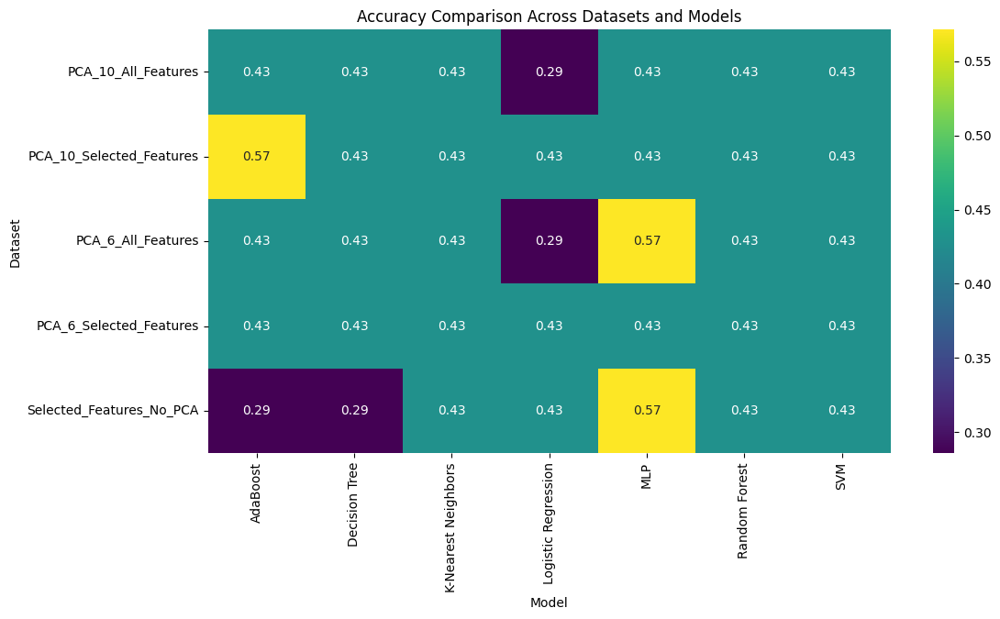

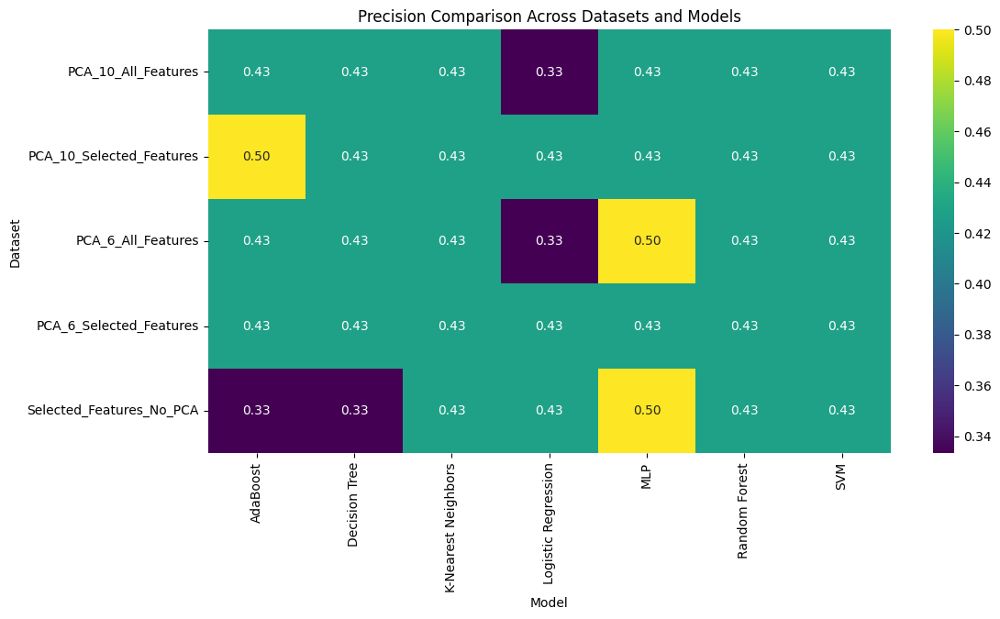

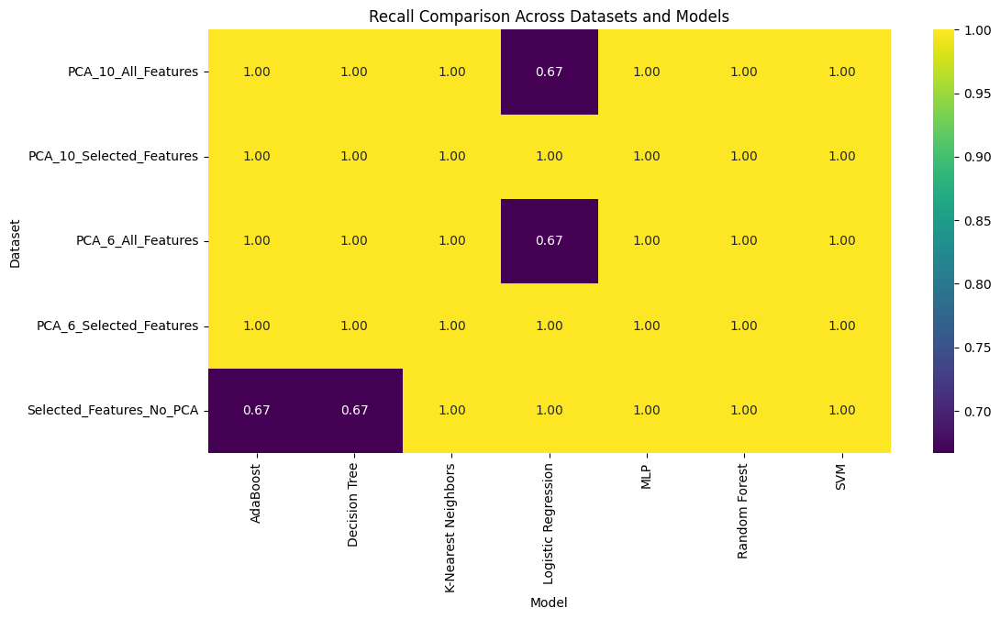

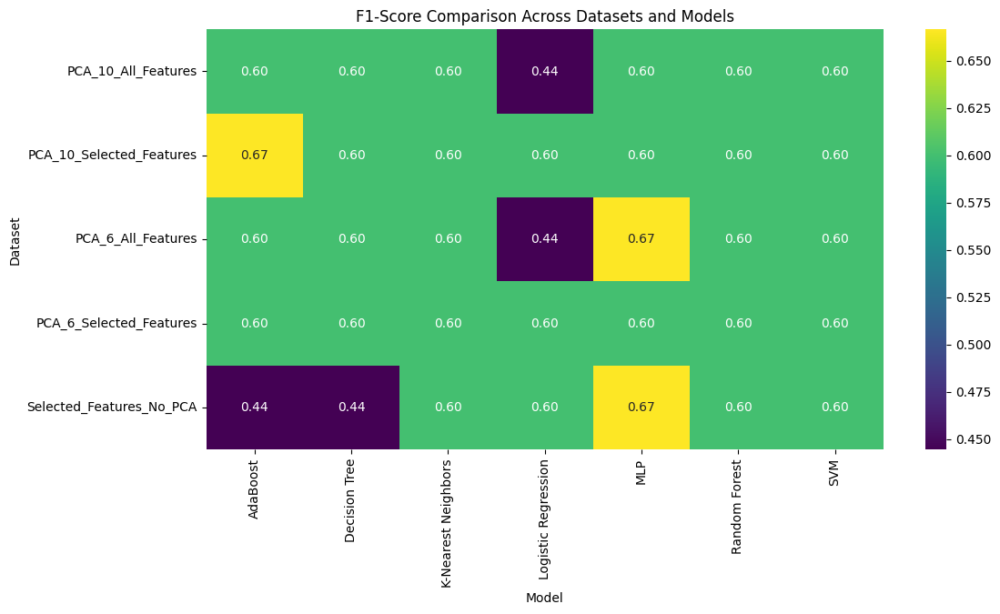

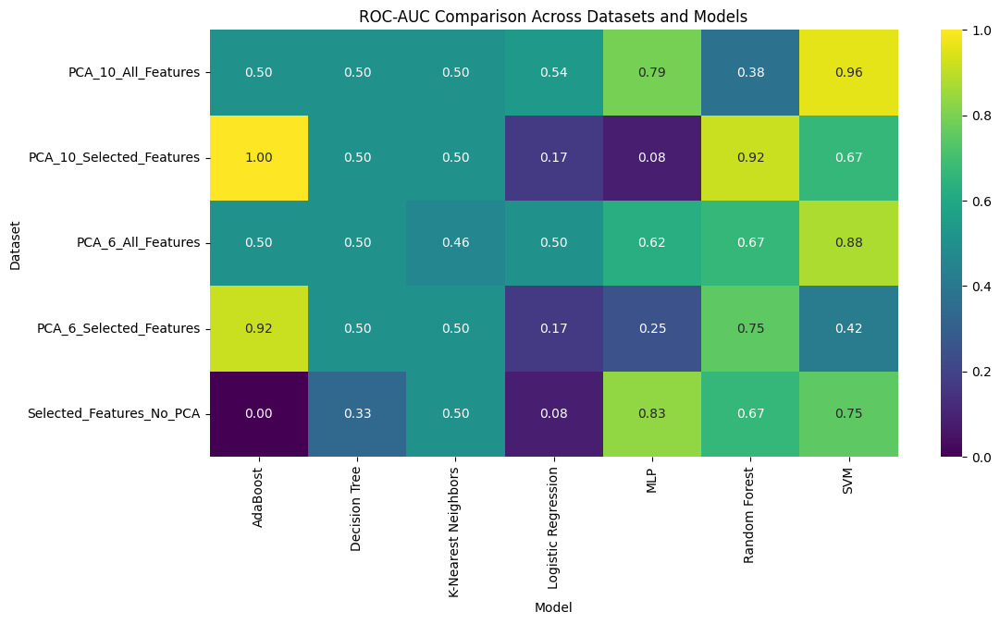

In [52]:
# Optional: Visualize results (e.g., heatmap of F1-scores across models and datasets)
metrics_to_plot = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC']

for metric in metrics_to_plot:
    plt.figure(figsize=(12, 6))
    sns.heatmap(results_df.pivot(index='Dataset', columns='Model', values=metric), annot=True, cmap='viridis', fmt=".2f")
    plt.title(f'{metric} Comparison Across Datasets and Models')
    plt.show()

### Grid Search

In [104]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import TunedThresholdClassifierCV, GridSearchCV
import numpy as np
import pandas as pd
import os
import zipfile
from collections import Counter # For distribution counts

def train_and_evaluate_model(model_instance, X_train, y_train, X_test, y_test, model_name):
    """
    Trains a given model and evaluates its performance.
    Handles TunedThresholdClassifierCV specifically.
    """
    optimal_threshold = np.nan # Initialize for untuned models
    y_prob = None # Initialize y_prob

    if isinstance(model_instance, TunedThresholdClassifierCV):
        # Fit TunedThresholdClassifierCV on the oversampled training data
        model_instance.fit(X_train, y_train)
        y_pred = model_instance.predict(X_test)

        # Safely extract best_threshold_
        if hasattr(model_instance, 'best_threshold_'):
            optimal_threshold = model_instance.best_threshold_

        # Safely get probabilities from the underlying best estimator
        if hasattr(model_instance, 'best_estimator_') and model_instance.best_estimator_ is not None:
            if hasattr(model_instance.best_estimator_, 'predict_proba'):
                y_prob = model_instance.best_estimator_.predict_proba(X_test)[:, 1]
    else:
        # For standard models, fit directly
        model_instance.fit(X_train, y_train)
        y_pred = model_instance.predict(X_test)
        y_prob = model_instance.predict_proba(X_test)[:, 1] if hasattr(model_instance, "predict_proba") else None

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_prob) if y_prob is not None else np.nan

    return {
        'Model': model_name,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
        'ROC-AUC': roc_auc,
        'Optimal_Threshold_Used': optimal_threshold, # New field
        'y_test': y_test,
        'y_pred': y_pred,
        'y_prob': y_prob
    }

# Define the base models to be trained
base_models_for_grid_search = {
    'Random Forest': RandomForestClassifier(random_state=RANDOM_STATE),
    'AdaBoost': AdaBoostClassifier(random_state=RANDOM_STATE),
    'MLP': MLPClassifier(random_state=RANDOM_STATE, max_iter=1000) # Increased max_iter for convergence
}

# Define hyperparameter grids for each model
param_grids = {
    'Random Forest': {
        'n_estimators': [10, 25, 50, 75, 100, 200],
        'max_features': [0.6, 0.8, 1.0, 'sqrt'],
        'min_samples_leaf': [1, 2, 4]
    },
    'AdaBoost': {
        'n_estimators': [10, 25, 50, 75, 100, 200],
        'learning_rate': [0.01, 0.1, 0.5, 1.0]
    },
    'MLP': {
        'hidden_layer_sizes': [(10,), (25,), (50,), (100,), (50, 50)],
        'activation': ['relu', 'tanh'],
        'solver': ['adam', 'sgd'],
        'alpha': [0.0001, 0.001, 0.01, 0.1, 0.5] # L2 penalty (regularization term)
    }
}

# Combine base models with their tuned threshold versions for grid search
models_to_grid_search = {}
for name, estimator in base_models_for_grid_search.items():
    # Wrap with TunedThresholdClassifierCV
    tuned_estimator = TunedThresholdClassifierCV(
        estimator=estimator,
        scoring="f1", # Maximize F1-score for tuning threshold
        cv=3 # Using integer for cv will default to StratifiedKFold
    )
    models_to_grid_search[f'{name} (Tuned)'] = tuned_estimator

# Filter datasets based on user's request
selected_dataset_names = [
    'After_SMOTE_Jitter_PCA_10_Selected_Features',
    'After_SMOTE_Jitter_PCA_6_All_Features',
    'After_SMOTE_Jitter_Selected_Features_No_PCA',
    'Before_SMOTE_PCA_10_All_Features',
    'Before_SMOTE_PCA_10_Selected_Features'
]

# Create a filtered version of all_evaluation_data_sources
filtered_evaluation_data_sources = {
    name: data for name, data in all_evaluation_data_sources.items()
    if name in selected_dataset_names
}

# Initialize lists to store results
grid_search_results = []
grid_search_predictions_summary = []

print("\n--- Starting Grid Search for Selected Models and Datasets ---")

for stage_name, data_source in filtered_evaluation_data_sources.items():
    X_train_current_stage = data_source['X_train']
    y_train_current_stage = data_source['y_train']
    X_test_current_stage = data_source['X_test']
    y_test_current_stage = data_source['y_test']

    print(f"\n--- Processing Data Stage for Grid Search: {stage_name} ---")
    for model_name, model_instance in models_to_grid_search.items():
        base_model_name = model_name.replace(' (Tuned)', '')

        if base_model_name in param_grids:
            print(f"  Performing Grid Search for: {model_name}")

            # Prefix parameter grid keys with 'estimator__' for TunedThresholdClassifierCV
            prefixed_param_grid = {f'estimator__{k}': v for k, v in param_grids[base_model_name].items()}

            # Using multiple scoring metrics and refit to 'f1'
            grid_search = GridSearchCV(
                estimator=model_instance,
                param_grid=prefixed_param_grid,
                scoring=['accuracy', 'f1'],
                refit='f1', # Refit the estimator to the best found parameters on the 'f1' score
                cv=3, # Cross-validation folds for grid search
                n_jobs=-1, # Use all available cores
                verbose=1
            )

            try:
                grid_search.fit(X_train_current_stage, y_train_current_stage)
                best_estimator = grid_search.best_estimator_
                best_params = grid_search.best_params_

                print(f"    Best parameters for {model_name}: {best_params}")
                print(f"    Best F1-score on CV: {grid_search.best_score_:.4f}")
                print(f"    Accuracy score on CV: {grid_search.cv_results_['mean_test_accuracy'][grid_search.best_index_]:.4f}")

                # Evaluate the best estimator on the test set
                metrics_output = train_and_evaluate_model(
                    best_estimator, # This is a TunedThresholdClassifierCV instance
                    X_train_current_stage,
                    y_train_current_stage,
                    X_test_current_stage,
                    y_test_current_stage,
                    f"{model_name} (GridSearch)"
                )

                metrics_output['Dataset'] = stage_name
                metrics_output['Best_Params'] = str(best_params) # Store best params
                grid_search_results.append(metrics_output)

                current_y_test = metrics_output.pop('y_test')
                current_y_pred = metrics_output.pop('y_pred')
                current_y_prob = metrics_output.pop('y_prob')
                optimal_threshold_used = metrics_output['Optimal_Threshold_Used']

                true_counts = Counter(current_y_test)
                pred_counts = Counter(current_y_pred)

                true_0_pred_0 = ((current_y_test == 0) & (current_y_pred == 0)).sum()
                true_0_pred_1 = ((current_y_test == 0) & (current_y_pred == 1)).sum()
                true_1_pred_0 = ((current_y_test == 1) & (current_y_pred == 0)).sum()
                true_1_pred_1 = ((current_y_test == 1) & (current_y_pred == 1)).sum()

                grid_search_predictions_summary.append({
                    'Dataset': stage_name,
                    'Model': f"{model_name} (GridSearch)",
                    'Optimal_Threshold_Used': optimal_threshold_used,
                    'True_0_Count': true_counts.get(0, 0),
                    'True_1_Count': true_counts.get(1, 0),
                    'Predicted_0_Count': pred_counts.get(0, 0),
                    'Predicted_1_Count': pred_counts.get(1, 0),
                    'True_0_Predicted_0': true_0_pred_0,
                    'True_0_Predicted_1': true_0_pred_1,
                    'True_1_Predicted_0': true_1_pred_0,
                    'True_1_Predicted_1': true_1_pred_1,
                    'Predicted_Probabilities': current_y_prob.tolist() if current_y_prob is not None else []
                })

            except Exception as e:
                print(f"    ❌ Error during Grid Search for Model: {model_name}, Dataset: {stage_name}. Error: {e}")
                # Append NaN results for failed grid search
                grid_search_results.append({
                    'Model': f"{model_name} (GridSearch)",
                    'Accuracy': np.nan, 'Precision': np.nan, 'Recall': np.nan,
                    'F1-Score': np.nan, 'ROC-AUC': np.nan, 'Optimal_Threshold_Used': np.nan,
                    'Dataset': stage_name, 'Best_Params': str(best_params) if 'best_params' in locals() else 'N/A'
                })
                grid_search_predictions_summary.append({
                    'Dataset': stage_name,
                    'Model': f"{model_name} (GridSearch)",
                    'Optimal_Threshold_Used': np.nan,
                    'True_0_Count': np.nan, 'True_1_Count': np.nan,
                    'Predicted_0_Count': np.nan, 'Predicted_1_Count': np.nan,
                    'True_0_Predicted_0': np.nan, 'True_0_Predicted_1': np.nan,
                    'True_1_Predicted_0': np.nan, 'True_1_Predicted_1': np.nan,
                    'Predicted_Probabilities': []
                })
                continue # Continue to the next model/dataset

# Convert grid search results to DataFrames
new_grid_search_results_df = pd.DataFrame(grid_search_results)
new_grid_search_predictions_summary_df = pd.DataFrame(grid_search_predictions_summary)

print("\n--- Grid Search Complete. Results stored in new dataframes ---")

# --- Save new grid search results to CSV and then to a zip file ---
output_dir = 'model_evaluation_results'
os.makedirs(output_dir, exist_ok=True)

# Use distinct file names for the new grid search results
new_results_csv_path = os.path.join(output_dir, 'grid_search_performance_metrics.csv')
new_predictions_csv_path = os.path.join(output_dir, 'grid_search_predictions_summary.csv')

new_grid_search_results_df.to_csv(new_results_csv_path, index=False)
new_grid_search_predictions_summary_df.to_csv(new_predictions_csv_path, index=False)

print(f"\nNew grid search performance metrics saved to: {new_results_csv_path}")
print(f"New grid search prediction summary saved to: {new_predictions_csv_path}")

# Create a zip archive containing both CSV files
zip_filename = 'grid_search_evaluation_output.zip'
with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
    zipf.write(new_results_csv_path, os.path.basename(new_results_csv_path))
    zipf.write(new_predictions_csv_path, os.path.basename(new_predictions_csv_path))

print(f"All new grid search results zipped into: {zip_filename}")


--- Starting Grid Search for Selected Models and Datasets ---

--- Processing Data Stage for Grid Search: Before_SMOTE_PCA_10_Selected_Features ---
  Performing Grid Search for: Random Forest (Tuned)
Fitting 3 folds for each of 72 candidates, totalling 216 fits


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
89 fits failed out of a total of 216.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
89 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_classification_threshold.py", line 135, in fit
    sel

    Best parameters for Random Forest (Tuned): {'estimator__max_features': 0.8, 'estimator__min_samples_leaf': 1, 'estimator__n_estimators': 25}
    Best F1-score on CV: 0.8000
    Accuracy score on CV: 0.7222
  Performing Grid Search for: AdaBoost (Tuned)
Fitting 3 folds for each of 24 candidates, totalling 72 fits
    ❌ Error during Grid Search for Model: AdaBoost (Tuned), Dataset: Before_SMOTE_PCA_10_Selected_Features. Error: 
All the 72 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
72 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.12/dist-packages/sklearn/bas

/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
88 fits failed out of a total of 216.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
88 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_classification_threshold.py", line 135, in fit
    sel

    Best parameters for Random Forest (Tuned): {'estimator__max_features': 0.6, 'estimator__min_samples_leaf': 2, 'estimator__n_estimators': 100}
    Best F1-score on CV: 1.0000
    Accuracy score on CV: 1.0000
  Performing Grid Search for: AdaBoost (Tuned)
Fitting 3 folds for each of 24 candidates, totalling 72 fits


/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
48 fits failed out of a total of 72.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
48 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_classification_threshold.py", line 135, in fit
    self

    ❌ Error during Grid Search for Model: AdaBoost (Tuned), Dataset: Before_SMOTE_PCA_10_All_Features. Error: The provided estimator makes constant predictions. Therefore, it is impossible to optimize the decision threshold.
  Performing Grid Search for: MLP (Tuned)
Fitting 3 folds for each of 100 candidates, totalling 300 fits
    Best parameters for MLP (Tuned): {'estimator__activation': 'relu', 'estimator__alpha': 0.0001, 'estimator__hidden_layer_sizes': (25,), 'estimator__solver': 'sgd'}
    Best F1-score on CV: 1.0000
    Accuracy score on CV: 1.0000

--- Processing Data Stage for Grid Search: After_SMOTE_Jitter_PCA_10_Selected_Features ---
  Performing Grid Search for: Random Forest (Tuned)
Fitting 3 folds for each of 72 candidates, totalling 216 fits
    Best parameters for Random Forest (Tuned): {'estimator__max_features': 0.6, 'estimator__min_samples_leaf': 1, 'estimator__n_estimators': 10}
    Best F1-score on CV: 1.0000
    Accuracy score on CV: 1.0000
  Performing Grid Sear

In [112]:
display(new_grid_search_results_df.iloc[7])
print(new_grid_search_results_df.iloc[7, -1])

,7
Model,AdaBoost (Tuned) (GridSearch)
Accuracy,0.857143
Precision,0.75
Recall,1.0
F1-Score,0.857143
ROC-AUC,NaN
Optimal_Threshold_Used,0.21921
Dataset,After_SMOTE_Jitter_PCA_10_Selected_Features
Best_Params,"{'estimator__learning_rate': 0.01, 'estimator_..."


{'estimator__learning_rate': 0.01, 'estimator__n_estimators': 75}


In [107]:
display(new_grid_search_results_df.sort_values(by='Accuracy', ascending=False))

,Model,Accuracy,Precision,Recall,F1-Score,ROC-AUC,Optimal_Threshold_Used,Dataset,Best_Params
7,AdaBoost (Tuned) (GridSearch),0.857143,0.750000,1.000000,0.857143,NaN,0.219210,After_SMOTE_Jitter_PCA_10_Selected_Features,"{'estimator__learning_rate': 0.01, 'estimator_..."
2,MLP (Tuned) (GridSearch),0.428571,0.428571,1.000000,0.600000,NaN,0.233974,Before_SMOTE_PCA_10_Selected_Features,"{'estimator__activation': 'relu', 'estimator__..."
3,Random Forest (Tuned) (GridSearch),0.428571,0.428571,1.000000,0.600000,NaN,0.507427,Before_SMOTE_PCA_10_All_Features,"{'estimator__max_features': 0.6, 'estimator__m..."
5,MLP (Tuned) (GridSearch),0.428571,0.428571,1.000000,0.600000,NaN,0.021643,Before_SMOTE_PCA_10_All_Features,"{'estimator__activation': 'relu', 'estimator__..."
0,Random Forest (Tuned) (GridSearch),0.428571,0.428571,1.000000,0.600000,NaN,0.440000,Before_SMOTE_PCA_10_Selected_Features,"{'estimator__max_features': 0.8, 'estimator__m..."
6,Random Forest (Tuned) (GridSearch),0.428571,0.428571,1.000000,0.600000,NaN,0.202020,After_SMOTE_Jitter_PCA_10_Selected_Features,"{'estimator__max_features': 0.6, 'estimator__m..."
8,MLP (Tuned) (GridSearch),0.428571,0.428571,1.000000,0.600000,NaN,0.089922,After_SMOTE_Jitter_PCA_10_Selected_Features,"{'estimator__activation': 'relu', 'estimator__..."
9,Random Forest (Tuned) (GridSearch),0.428571,0.428571,1.000000,0.600000,NaN,0.323232,After_SMOTE_Jitter_PCA_6_All_Features,"{'estimator__max_features': 'sqrt', 'estimator..."
10,AdaBoost (Tuned) (GridSearch),0.428571,0.428571,1.000000,0.600000,NaN,0.126896,After_SMOTE_Jitter_PCA_6_All_Features,"{'estimator__learning_rate': 0.01, 'estimator_..."
11,MLP (Tuned) (GridSearch),0.428571,0.428571,1.000000,0.600000,NaN,0.020258,After_SMOTE_Jitter_PCA_6_All_Features,"{'estimator__activation': 'relu', 'estimator__..."


In [109]:
display(new_grid_search_predictions_summary_df.sort_values(by='True_0_Predicted_0', ascending=False))

,Dataset,Model,Optimal_Threshold_Used,True_0_Count,True_1_Count,Predicted_0_Count,Predicted_1_Count,True_0_Predicted_0,True_0_Predicted_1,True_1_Predicted_0,True_1_Predicted_1,Predicted_Probabilities
7,After_SMOTE_Jitter_PCA_10_Selected_Features,AdaBoost (Tuned) (GridSearch),0.219210,4.0,3.0,3.0,4.0,3.0,1.0,0.0,3.0,[]
2,Before_SMOTE_PCA_10_Selected_Features,MLP (Tuned) (GridSearch),0.233974,4.0,3.0,0.0,7.0,0.0,4.0,0.0,3.0,[]
3,Before_SMOTE_PCA_10_All_Features,Random Forest (Tuned) (GridSearch),0.507427,4.0,3.0,0.0,7.0,0.0,4.0,0.0,3.0,[]
5,Before_SMOTE_PCA_10_All_Features,MLP (Tuned) (GridSearch),0.021643,4.0,3.0,0.0,7.0,0.0,4.0,0.0,3.0,[]
0,Before_SMOTE_PCA_10_Selected_Features,Random Forest (Tuned) (GridSearch),0.440000,4.0,3.0,0.0,7.0,0.0,4.0,0.0,3.0,[]
6,After_SMOTE_Jitter_PCA_10_Selected_Features,Random Forest (Tuned) (GridSearch),0.202020,4.0,3.0,0.0,7.0,0.0,4.0,0.0,3.0,[]
8,After_SMOTE_Jitter_PCA_10_Selected_Features,MLP (Tuned) (GridSearch),0.089922,4.0,3.0,0.0,7.0,0.0,4.0,0.0,3.0,[]
9,After_SMOTE_Jitter_PCA_6_All_Features,Random Forest (Tuned) (GridSearch),0.323232,4.0,3.0,0.0,7.0,0.0,4.0,0.0,3.0,[]
10,After_SMOTE_Jitter_PCA_6_All_Features,AdaBoost (Tuned) (GridSearch),0.126896,4.0,3.0,0.0,7.0,0.0,4.0,0.0,3.0,[]
11,After_SMOTE_Jitter_PCA_6_All_Features,MLP (Tuned) (GridSearch),0.020258,4.0,3.0,0.0,7.0,0.0,4.0,0.0,3.0,[]


### Final Validation

| Metric / Attribute | Model 1 (Random Forest) | Model 2 (AdaBoost) |
| :--- | :--- | :--- |
| **Model** | Random Forest (Tuned) | AdaBoost (Tuned) (GridSearch) |
| **Accuracy** | 0.714286 | 0.857143 |
| **Precision** | 0.666667 | 0.75 |
| **Recall** | 0.666667 | 1.0 |
| **F1-Score** | 0.666667 | 0.857143 |
| **ROC-AUC** | NaN | NaN |
| **Optimal Threshold Used** | 0.654242 | 0.21921 |
| **Dataset** | Before_SMOTE_PCA_10_Selected_Features | After_SMOTE_Jitter_PCA_10_Selected_Features |
| **Best Params** | — | {'estimator__learning_rate': 0.01, 'estimator__n_estimators': 75} |

In [150]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from collections import Counter
import os

# --- Configurations ---
N_PERMUTATIONS = 20  # Minimum required to achieve mathematically possible p-value < 0.05

base_models = {
    'Random Forest': RandomForestClassifier(random_state=RANDOM_STATE),
    'AdaBoost': AdaBoostClassifier(random_state=RANDOM_STATE, learning_rate=0.01, n_estimators=75)
}

# --- Prepare Dataset ---
pca_10_selected_feat_df = pd.concat([pca_10_selected_feat_train_df, pca_10_selected_feat_test_df]).reset_index(drop=True)
full_data_for_loso = pca_10_selected_feat_df.copy()
unique_patients = full_data_for_loso[patient_id_col].unique()

pooled_real = {model: {scen: {'y_true': [], 'y_prob': []} for scen in ['AS_IS', 'SMOTE_JITTER']} for model in base_models}
permuted_distribution = {model: {metric: [] for metric in ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC']} for model in base_models}

# --- Helper to optimize thresholds for REAL data ---
def evaluate_pooled_metrics(y_true, y_prob, target_thresh=None):
    y_true, y_prob = np.array(y_true), np.array(y_prob)

    if target_thresh is None:  # Optimize if no fixed threshold is forced
        best_f1, best_thresh = -1, 0.5
        for thresh in np.linspace(0.01, 0.99, 100):
            f1 = f1_score(y_true, (y_prob >= thresh).astype(int), zero_division=0)
            if f1 > best_f1:
                best_f1, best_thresh = f1, thresh
    else:
        best_thresh = target_thresh
        best_f1 = f1_score(y_true, (y_prob >= best_thresh).astype(int), zero_division=0)

    y_pred = (y_prob >= best_thresh).astype(int)
    return {
        'Optimal_Threshold': best_thresh,
        'Accuracy': accuracy_score(y_true, y_pred),
        'Precision': precision_score(y_true, y_pred, zero_division=0),
        'Recall': recall_score(y_true, y_pred, zero_division=0),
        'F1-Score': best_f1,
        'ROC-AUC': roc_auc_score(y_true, y_prob) if len(np.unique(y_true)) > 1 else np.nan
    }, best_thresh

# ==========================================
# --- STEP 1: EVALUATE REAL SCENARIOS ---
# ==========================================
print(f"Starting Prediction-Pooled LOSO CV for {len(unique_patients)} patients...")
for test_patient_id in unique_patients:
    print(f"\nEvaluating LOSO CV for Patient ID: {test_patient_id} ({'healthy' if full_data_for_loso[full_data_for_loso[patient_id_col] == test_patient_id][target_col].iloc[0] == 0 else 'Osteoporosis'})")
    train_fold_df = full_data_for_loso[full_data_for_loso[patient_id_col] != test_patient_id].copy()
    test_fold_df = full_data_for_loso[full_data_for_loso[patient_id_col] == test_patient_id].copy()

    X_train_asis = train_fold_df.drop(columns=[patient_id_col, session_id_col, target_col])
    y_train_asis = train_fold_df[target_col]
    X_test_asis = test_fold_df.drop(columns=[patient_id_col, session_id_col, target_col])
    y_test_asis = test_fold_df[target_col].values

    # Correct Oversampling Placement: Strictly on training partitions
    try:
        X_smoted, y_smoted = apply_smote(X_train_asis, y_train_asis, random_state=RANDOM_STATE, sampling_strategy='all', k_neighbors=2)
        target_size_per_class = min(len(X_smoted.columns) * 10, len(X_smoted.columns) ** 2)
        if len(X_smoted) < target_size_per_class * len(y_smoted.unique()):
            target_size_dict = {cls: target_size_per_class for cls in y_smoted.unique()}
            X_train_processed, y_train_processed = jitter_oversample(X_smoted, y_smoted, target_size_dict=target_size_dict, random_state=RANDOM_STATE)
        else:
            X_train_processed = X_smoted
            y_train_processed = y_smoted
        has_oversampling = True
    except Exception as e:
        has_oversampling = False

    for model_name, model_instance in base_models.items():
        model_instance.fit(X_train_asis, y_train_asis)
        pooled_real[model_name]['AS_IS']['y_true'].extend(y_test_asis)
        pooled_real[model_name]['AS_IS']['y_prob'].extend(model_instance.predict_proba(X_test_asis)[:, 1])

        if has_oversampling:
            model_instance.fit(X_train_processed, y_train_processed)
            pooled_real[model_name]['SMOTE_JITTER']['y_true'].extend(y_test_asis)
            pooled_real[model_name]['SMOTE_JITTER']['y_prob'].extend(model_instance.predict_proba(X_test_asis)[:, 1])

# ==========================================
# --- STEP 2: REAL FIXED THRESHOLD DISTRIBUTION ---
# ==========================================
# Discover the real optimized threshold for each model to hold fixed during permutations
real_model_thresholds = {}
final_performance_metrics = []

for model_name in base_models:
    metrics, real_thresh = evaluate_pooled_metrics(pooled_real[model_name]['AS_IS']['y_true'], pooled_real[model_name]['AS_IS']['y_prob'])
    real_model_thresholds[model_name] = real_thresh

# ==========================================
# --- STEP 3: GENERATE NULL DISTRIBUTION ---
# ==========================================
print(f"\nGenerating Null Distribution via {N_PERMUTATIONS} Permutation Iterations...")
for i in range(N_PERMUTATIONS):
    current_seed = RANDOM_STATE + i if RANDOM_STATE is not None else None
    pooled_perm = {model: {'y_true': [], 'y_prob': []} for model in base_models}

    for test_patient_id in unique_patients:
        train_fold_df = full_data_for_loso[full_data_for_loso[patient_id_col] != test_patient_id].copy()
        test_fold_df = full_data_for_loso[full_data_for_loso[patient_id_col] == test_patient_id].copy()

        X_train_asis = train_fold_df.drop(columns=[patient_id_col, session_id_col, target_col])
        y_train_asis = train_fold_df[target_col]
        X_test_asis = test_fold_df.drop(columns=[patient_id_col, session_id_col, target_col])
        y_test_asis = test_fold_df[target_col].values

        y_train_permuted = y_train_asis.sample(frac=1, random_state=current_seed).reset_index(drop=True)

        for model_name, model_instance in base_models.items():
            model_instance.fit(X_train_asis, y_train_permuted)
            pooled_perm[model_name]['y_true'].extend(y_test_asis)
            pooled_perm[model_name]['y_prob'].extend(model_instance.predict_proba(X_test_asis)[:, 1])

    for model_name in base_models:
        y_t = np.array(pooled_perm[model_name]['y_true'])
        y_p = np.array(pooled_perm[model_name]['y_prob'])

        # FIX: Evaluate permutation performance utilizing the REAL model's fixed threshold
        fixed_thresh = real_model_thresholds[model_name]
        y_pred = (y_p >= fixed_thresh).astype(int)

        permuted_distribution[model_name]['Accuracy'].append(accuracy_score(y_t, y_pred))
        permuted_distribution[model_name]['Precision'].append(precision_score(y_t, y_pred, zero_division=0))
        permuted_distribution[model_name]['Recall'].append(recall_score(y_t, y_pred, zero_division=0))
        permuted_distribution[model_name]['F1-Score'].append(f1_score(y_t, y_pred, zero_division=0))
        permuted_distribution[model_name]['ROC-AUC'].append(roc_auc_score(y_t, y_p) if len(np.unique(y_t)) > 1 else np.nan)

# ==========================================
# --- STEP 4: GENERATE INSIGHTS REPORT ---
# ==========================================
print("\n" + "="*85 + "\nPOOLED STATISTICAL SIGNIFICANCE REPORT PANEL\n" + "="*85)
metrics_to_analyze = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC']

for model_name in base_models:
    print(f"\n📈 Evaluation Insights for Model: {model_name}")
    summary_data = []

    # Safe instantiation initialization
    SJ_Exist = len(pooled_real[model_name]['SMOTE_JITTER']['y_true']) > 0

    real_asis_metrics, _ = evaluate_pooled_metrics(pooled_real[model_name]['AS_IS']['y_true'], pooled_real[model_name]['AS_IS']['y_prob'], target_thresh=real_model_thresholds[model_name])
    real_asis_metrics.update({'Model': model_name, 'Dataset_Scenario': 'AS_IS', 'Is_Permuted': False})
    final_performance_metrics.append(real_asis_metrics)

    if SJ_Exist:
        real_sj_metrics, _ = evaluate_pooled_metrics(pooled_real[model_name]['SMOTE_JITTER']['y_true'], pooled_real[model_name]['SMOTE_JITTER']['y_prob'])
        real_sj_metrics.update({'Model': model_name, 'Dataset_Scenario': 'SMOTE_JITTER', 'Is_Permuted': False})
        final_performance_metrics.append(real_sj_metrics)

    for metric in metrics_to_analyze:
        actual_score = real_asis_metrics[metric]
        if SJ_Exist:
            sj_score = real_sj_metrics[metric]
        null_scores = np.array(permuted_distribution[model_name][metric])
        mean_null = np.mean(null_scores)

        higher_or_equal_count = np.sum(null_scores >= actual_score)
        p_val = higher_or_equal_count / N_PERMUTATIONS
        p_str = f"{p_val:.4f} " + ("⭐ (Significant)" if p_val < 0.05 else "❌ (Not Significant)")

        row_dict = {
            'Metric': metric,
            'Actual Pooled (AS_IS)': round(actual_score, 5),
            'Permuted Mean (Null)': round(mean_null, 5),
            'Empirical p-value': p_str
        }
        if SJ_Exist:
            row_dict['Actual Pooled (SMOTE_JITTER)'] = round(real_sj_metrics[metric], 5)

        summary_data.append(row_dict)

    if SJ_Exist:
      summary_data.append({
        'Metric': metric,
        'Actual Pooled (AS_IS)': round(actual_score, 5),
        'Actual Pooled (SMOTE_JITTER)': round(sj_score, 5),
        'Permuted Mean (Null)': round(mean_null, 5),
        'Empirical p-value': p_str
      })
    else:
      summary_data.append({
          'Metric': metric,
          'Actual Pooled (AS_IS)': round(actual_score, 5),
          'Permuted Mean (Null)': round(mean_null, 5),
          'Empirical p-value': p_str
      })

    results_summary_df = pd.DataFrame(summary_data)

    # Force the columns into the exact order you want
    if SJ_Exist:
        column_order = [
            "Metric",
            "Actual Pooled (AS_IS)",
            "Actual Pooled (SMOTE_JITTER)",
            "Permuted Mean (Null)",
            "Empirical p-value",
        ]
    else:
        column_order = [
            "Metric",
            "Actual Pooled (AS_IS)",
            "Permuted Mean (Null)",
            "Empirical p-value",
        ]

    # Reindex the dataframe to match the desired order
    results_summary_df = results_summary_df.reindex(columns=column_order)

    print(results_summary_df.to_string(index=False))
    # print(pd.DataFrame(summary_data).to_string(index=False))

# Save output
loso_results_df = pd.DataFrame(final_performance_metrics)
os.makedirs('loso_evaluation_results', exist_ok=True)
loso_results_df.to_csv('loso_evaluation_results/pooled_significance_performance_metrics.csv', index=False)

Starting Prediction-Pooled LOSO CV for 6 patients...

Evaluating LOSO CV for Patient ID: 6 (Osteoporosis)
Original class distribution: Counter({1: 8, 0: 8})
Resampled class distribution: Counter({1: 8, 0: 8})
Original class distribution: Counter({1: 8, 0: 8})
Resampled class distribution: Counter({1: 100, 0: 100})

Evaluating LOSO CV for Patient ID: 8 (Osteoporosis)
Original class distribution: Counter({1: 8, 0: 8})
Resampled class distribution: Counter({1: 8, 0: 8})
Original class distribution: Counter({1: 8, 0: 8})
Resampled class distribution: Counter({1: 100, 0: 100})

Evaluating LOSO CV for Patient ID: 5 (healthy)
Original class distribution: Counter({1: 10, 0: 4})
Resampled class distribution: Counter({1: 10, 0: 10})
Original class distribution: Counter({1: 10, 0: 10})
Resampled class distribution: Counter({1: 100, 0: 100})

Evaluating LOSO CV for Patient ID: 7 (Osteoporosis)
Original class distribution: Counter({0: 8, 1: 7})
Resampled class distribution: Counter({1: 8, 0: 8})
Or